# **Members**

1. นันท์นภัส วราธนสิน 66340500024

2. นันท์มนัส วราธนสิน 66340500026

3. สิตานัน วรฤทธิ์เรืองอุไร 66340500058

#**1. Reading the data into python and data description**


This dataset contains detailed information about hotel bookings, including reservation dates, customer demographics, stay duration, deposit types, cancellation status, and other booking-related attributes. The dataset is suitable for predicting hotel booking cancellations.

Link to Dataset: https://www.kaggle.com/datasets/kundanbedmutha/hotel-booking-reservation/data

Data description
The meaning of each column in the data is as below:

* hotel - The type of hotel: City Hotel or Resort Hotel.
* is_canceled	- A binary variable (0/1) indicating whether the booking was canceled (1) or not canceled (0).
* lead_time -	The number of days between the booking date and the arrival date.
* arrival_date_year	- The year of arrival (e.g., 2024).
* arrival_date_month - The month of arrival.
* arrival_date_week_number - The week number of the arrival date (1 to 53).
* arrival_date_day_of_month - The day of the month of arrival (1 to 31).
* stays_in_weekend_nights - The number of nights spent at the hotel during the weekend (Saturday and Sunday).
* stays_in_week_nights - The number of nights spent at the hotel during the weekday (Monday to Friday).
* adults - The number of adults included in the booking.
* children - The number of children included in the booking.
* babies - The number of babies included in the booking.
* meal - The type of meal package booked, e.g., BB (Bed & Breakfast), HB (Half Board), FB (Full Board), SC (No Meal).
* country - The country of origin of the guest (using ISO 3166-1 alpha-3 codes).
* market_segment - The market segment designation (the channel used to make the booking), e.g., Online TA (Online Travel Agent), Offline TA/TO (Offline Travel Agent/Tour Operator), Direct, Corporate, Group.
* distribution_channel - The distribution channel used to make the booking, e.g., TA/TO, Direct, Corporate, GDS (Global Distribution System).
* is_repeated_guest - A binary variable (0/1) indicating whether the customer has stayed at the hotel before.
* previous_cancellations - The number of previous bookings by this customer that were canceled.
* previous_bookings_not_canceled - The number of previous bookings by this customer that were not canceled.
* reserved_room_type - The code for the room type reserved by the customer.
* assigned_room_type - The code for the room type assigned to the guest upon check-in.
* booking_changes - The number of modifications/changes made to the booking from the moment it was reserved up to check-in/cancellation.
* deposit_type - The type of deposit made: No Deposit, Non Refund (non-refundable), or Refundable.
* agent - ID of the Travel Agent (if the booking was made through one).
* company - ID of the Company/Organization that made or is responsible for the booking (if applicable).
* days_in_waiting_list - The number of days the booking was on the waiting list before it was confirmed.
* customer_type - The type of booking customer, such as Transient, Group, Contract, or Transient-Party.
* adr - Average Daily Rate, calculated by dividing the total lodging transaction value by the total number of staying nights.
* required_car_parking_spaces - The number of car parking spaces requested by the customer.
* total_of_special_requests - The total number of special requests made by the customer (e.g., crib, high floor, specific view).
* reservation_status - The last status of the reservation: Canceled, Check-Out (guest stayed), or No-Show (guest did not arrive).
* reservation_status_date - The date when the last reservation status was applied.
* city - The name of the city where the hotel located.

In [ ]:
# Import Library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from PIL import Image
from scipy.stats import gaussian_kde

In [ ]:
# Import Dataset
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/hotel_bookings_updated_2024.csv')
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,city
0,Resort Hotel - Chandigarh,0,342,2024,July,30,27,0,0,2,...,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2024-07-27 22:16:40.916332324,Chandigarh
1,Resort Hotel - Mumbai,0,737,2024,April,17,28,0,0,2,...,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2024-04-28 21:56:21.507509066,Mumbai
2,Resort Hotel - Delhi,0,7,2024,September,37,10,0,1,1,...,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2024-09-10 03:46:25.734029096,Delhi
3,Resort Hotel - Kolkata,0,13,2024,August,33,14,0,1,1,...,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2024-08-14 18:07:10.049669568,Kolkata
4,Resort Hotel - Lucknow,0,14,2024,September,37,14,0,2,2,...,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2024-09-14 14:27:32.473846000,Lucknow


#**2. Defining the problem statement**

Create a machine learning model which can predict **hotel booking cancellations (Not canceled = 0, Canceled = 1)**

* **Target Variable:** is_canceled
* **Predictors:** hotel, lead_time, arrival_date_year, arrival_date_month, arrival_date_week_number, arrival_date_day_of_month, stays_in_weekend_nights, stays_in_week_nights, adults, children, babies, meal, country, market_segment, distribution_channel, is_repeated_guest, previous_cancellations, previous_bookings_not_canceled, reserved_room_type, assigned_room_type, booking_changes, deposit_type, agent, company, days_in_waiting_list, customer_type, adr, required_car_parking_spaces, total_of_special_requests, reservation_status, reservation_status_date, city

* **Samples:**  Hotel booking records generated to simulate real-world reservation behavior across multiple Indian cities.

**Determining the type of Machine Learning**

We need to create **supervised machine learning classification models, including Logistic Regression, Random Forest, K-Nearest Neighbors (K-NN), and Neural Network (NN) models**, because the target variable is categorical (binary: 0 or 1).

**Assumptions for Logistic Regression**

Meeting these assumptions on data ensures that Logistic Regression provides valid, unbiased, and interpretable results:

1. Linear Relationship between the features and target
2. Little or no Multicollinearity between the features
3. No High Leverage Points or Influential Outliers
4. No auto-correlation (No Temporal Correlation)

**Assumptions for Random Forest**

Meeting these assumptions on data ensures that Random Forest provides stable, generalizable, and unbiased results:

1. Independence of observations: Each observation in the dataset should be independent of others. Dependencies or autocorrelation can bias the model’s performance and reduce its generalization.
2. Representative and sufficient data: The training data should adequately represent the overall population and contain enough samples to capture underlying patterns and variability.
3. Low multicollinearity: Highly correlated features may reduce model interpretability and can bias feature importance measures, even though Random Forest can still handle moderate correlations.
4. Relevant feature scaling: While Random Forest is not sensitive to feature scaling (e.g., standardization), features should still be meaningful and on reasonable numeric ranges to avoid misinterpretation.
5. Balanced classes (for classification): In classification tasks, unbalanced target classes can cause bias toward majority classes. Balancing techniques like resampling or class weighting may be required.
6. No severe outliers: Extreme outliers can distort splits in some trees and affect prediction stability. Outlier detection or robust preprocessing helps maintain model performance.

**Assumptions for K-Nearest Neighbors (K-NN)**

Meeting these assumptions on data ensures that K-Nearest Neighbors (K-NN) provides meaningful distance-based classification:

1. Minimal Outliers: Data should have few or no outliers, as outliers can significantly affect distance calculations and lead to misclassification.
2. Non-linear Relationships: K-NN can handle non-linear relationships in the data effectively, making it suitable for complex decision boundaries.
3. Feature Scaling: K-NN relies on distance metrics, so features with different scales can lead to inaccurate results. Normalize or standardize features to ensure they have comparable scales, which helps in accurate distance calculations.
4. Sufficient Data Density: Data should be uniformly distributed across the feature space for K-NN to perform well, as K-NN relies on finding similar points in the neighborhood.
5. Low to Moderate Dimensionality: High-dimensional data (curse of dimensionality) can significantly degrade KNN's performance, as the distance between points becomes less meaningful in high-dimensional spaces.
6. Relevant Features Only: KNN considers all features equally important when computing distances. Therefore, irrelevant or redundant features can significantly impact the algorithm's performance, leading to inaccurate predictions or classifications. Feature selection is crucial.RetryClaude can make mistakes. Please double-check responses.ies are relatively smooth rather than highly irregular or overlapping. (Very Important)

**Assumptions for Neural Network (NN)**

Meeting these assumptions on data ensures that Neural Networks (NN) provide accurate and generalizable results:

1. Sufficient Data Quantity: Neural networks require large and diverse datasets to learn complex relationships effectively. Limited data can lead to overfitting, where the model performs well on training data but poorly on unseen data.
2. Representative Data Distribution: The training data should be representative of the real-world or test data distribution. If the training and test data come from different distributions (data drift), model performance will degrade.
3. Feature Relevance and Quality: Input features should be informative, consistent, and relevant to the target variable. Noisy, irrelevant, or highly correlated features can reduce learning efficiency and model accuracy.
4. Normalized or Scaled Inputs: Neural networks are sensitive to the scale of input features. Input variables should typically be normalized or standardized to ensure stable and efficient gradient-based optimization.


#**3. Looking at the distribution of Target**



In [ ]:
# Plotting bar charts as the Target variable is Categorical variables
# This helps visualize the distribution of the target variable and check for class balance.
def PlotBarCharts(inpData, colsToPlot, ncols=2, figsize=(12,5)):
    n = len(colsToPlot)
    nrows = (n + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    axes = axes.flatten()

    if set(colsToPlot) == {"is_canceled"}:
        fig.suptitle("Bar chart of is_canceled", x=0.3)
    else:
        fig.suptitle("Bar charts of categorical variables", x=0.5)

    for i, colName in enumerate(colsToPlot):
        counts = inpData.groupby(colName).size()
        bars = axes[i].bar(range(len(counts)), counts.values)

        for bar in bars:
            height = bar.get_height()
            axes[i].text(bar.get_x() + bar.get_width()/2., height,
                        f'{int(height)}',
                        ha='center', va='bottom', fontsize=10)
        if colName != "is_canceled":
            axes[i].set_title(colName, pad=8, loc='center', fontsize=11)
        axes[i].set_xlabel('')
        axes[i].set_ylabel('Count')
        axes[i].set_xticks(range(len(counts)))
        if colName != 'is_canceled':axes[i].set_xticklabels(counts.index, rotation=30, ha='right', fontstyle='italic')
        else:axes[i].set_xticklabels(counts.index)
        axes[i].grid(axis='y', alpha=0.3)

    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

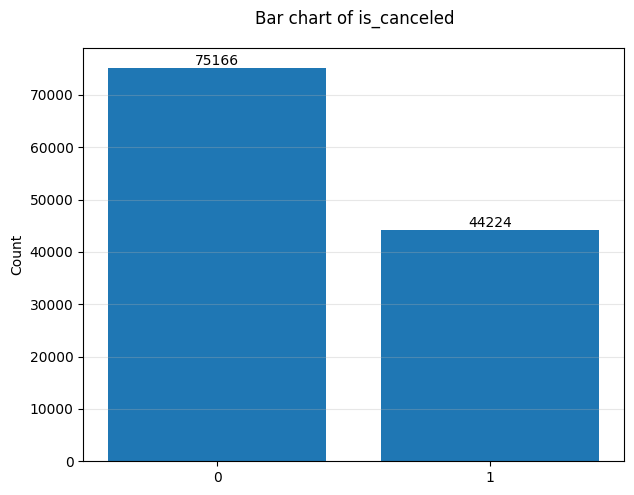

In [ ]:
# Calling Function
PlotBarCharts(inpData=df, colsToPlot=['is_canceled'])

Based on the Bar Chart of the Target variable ‘is_canceled’:

- Class 0 (Not Canceled) accounts for 75,166 instances (62.96%).
- Class 1 (Canceled) accounts for 44,224 instances (37.04%).

The total number of observations is 119,390, with no missing values. The class ratio (0 : 1) is calculated to be 1.7 : 1.

This distribution indicates a characteristic of **Slightly Imbalanced Class**, with the distribution leaning marginally toward Class 0.

#**4. Basic data exploration**



In [ ]:
# Looking at sample rows in the data
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,city
0,Resort Hotel - Chandigarh,0,342,2024,July,30,27,0,0,2,...,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2024-07-27 22:16:40.916332324,Chandigarh
1,Resort Hotel - Mumbai,0,737,2024,April,17,28,0,0,2,...,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2024-04-28 21:56:21.507509066,Mumbai
2,Resort Hotel - Delhi,0,7,2024,September,37,10,0,1,1,...,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2024-09-10 03:46:25.734029096,Delhi
3,Resort Hotel - Kolkata,0,13,2024,August,33,14,0,1,1,...,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2024-08-14 18:07:10.049669568,Kolkata
4,Resort Hotel - Lucknow,0,14,2024,September,37,14,0,2,2,...,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2024-09-14 14:27:32.473846000,Lucknow


In [ ]:
# Observing the summarized information of data
# Data types, Missing values based on number of non-null values Vs total rows etc.
# Remove Qualitative variables which cannot be used in Machine Learning
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 33 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [ ]:
# Looking at the descriptive statistics of the data
df.describe(include='all')

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,city
count,119390,119390.000000,119390.000000,119390.0,119390,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,...,103050.000000,6797.000000,119390.000000,119390,119390.000000,119390.000000,119390.000000,119390,119390,119390
unique,30,NaN,NaN,NaN,12,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,4,NaN,NaN,NaN,3,75629,15
top,City Hotel - Ahmedabad,NaN,NaN,NaN,October,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Transient,NaN,NaN,NaN,Check-Out,2024-01-13 19:56:56.304684686,Bhopal
freq,5405,NaN,NaN,NaN,10349,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,89613,NaN,NaN,NaN,75166,8,8104
mean,NaN,0.370416,104.011416,2024.0,NaN,26.375835,15.723394,0.927599,2.500302,1.856403,...,86.693382,189.266735,2.321149,NaN,101.831122,0.062518,0.571363,NaN,NaN,NaN
std,NaN,0.482918,106.863097,0.0,NaN,15.021596,8.805079,0.998613,1.908286,0.579261,...,110.774548,131.655015,17.594721,NaN,50.535790,0.245291,0.792798,NaN,NaN,NaN
min,NaN,0.000000,0.000000,2024.0,NaN,1.000000,1.000000,0.000000,0.000000,0.000000,...,1.000000,6.000000,0.000000,NaN,-6.380000,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,0.000000,18.000000,2024.0,NaN,13.000000,8.000000,0.000000,1.000000,2.000000,...,9.000000,62.000000,0.000000,NaN,69.290000,0.000000,0.000000,NaN,NaN,NaN
50%,NaN,0.000000,69.000000,2024.0,NaN,26.000000,16.000000,1.000000,2.000000,2.000000,...,14.000000,179.000000,0.000000,NaN,94.575000,0.000000,0.000000,NaN,NaN,NaN
75%,NaN,1.000000,160.000000,2024.0,NaN,39.000000,23.000000,2.000000,3.000000,2.000000,...,229.000000,270.000000,0.000000,NaN,126.000000,0.000000,1.000000,NaN,NaN,NaN


In [ ]:
# Finding unique values for each column to understand which column is categorical and which one is Continuous
# Typically if the numer of unique values are < 20 then the variable is likely to be a category otherwise continuous
df.nunique()

,0
hotel,30
is_canceled,2
lead_time,479
arrival_date_year,1
arrival_date_month,12
arrival_date_week_number,52
arrival_date_day_of_month,31
stays_in_weekend_nights,17
stays_in_week_nights,35
adults,14


Based on the Data Exploration
1. the feature **'reservation_status_date'** can be dropped for the following reasons:

- **Data Leakage Risk**
  - The column 'reservation_status_date' records the specific date and time when the booking's final status was recorded (e.g., when the customer checked out, when the cancellation was processed, or when the booking was marked as a no-show). If a model uses this data that occurs after the event being predicted (cancellation), it will learn the outcome perfectly but fail on real, unseen data.

- **Inappropriate Data Type**
  - 'reservation_status_date' is a Timestamp or Datetime data type.
  - The four models (Logistic Regression, Random Forest, K-NN, Neural Network) cannot directly process Datetime values.
  - Utilizing this feature would require complex Feature Engineering—breaking the date into Year, Month, Day, or calculating a Duration. This process is deemed too complex and unnecessary given the data structure.

2. the feature **'reservation_status'** can be dropped for the following reasons:

- **Data Leakage Risk**
  - The column 'reservation_status' records the direct outcome of the target variable is_canceled (Canceled vs. Check-Out/No-Show) and provides perfect information that is unavailable at the time of prediction. If a model uses this data that occurs after the event being predicted (cancellation), it will learn the outcome perfectly but fail on real, unseen data.

3. the feature **'arrival_date_year'** can be dropped for the following reasons:
- **Single Unique Value (No Variability)**
  - The feature 'arrival_date_year' contains only one unique value (2024) throughout the entire dataset, resulting in zero variance.
- **No Ability to Differentiate Outcomes**
  - Because all records share the same year, the feature cannot help the model distinguish between canceled and non-canceled bookings.
  - It provides no separation power or discriminative information for classification.
- **Zero Predictive Signal Across All Models**
  - A constant-value feature contributes no weight, no split criteria, and no distance impact in models such as Logistic Regression, Random Forest, K-NN, and Neural Networks.
  - It cannot influence predictions or decision boundaries in any meaningful way.
- **Unnecessary Dimensionality and Computational Cost**
  - Keeping a feature with no information content adds needless dimensionality to the dataset.
  - This increases computational load without offering any predictive advantage, and may introduce noise into the modeling process.

**In summary:** Dropping this feature simplifies the modeling process, mitigates data leakage, and ensures the model is built on features available at the time of booking.

**Data Exploration Results**

The selected columns in this step are not final, further study will be done and then a final list will be created

* hotel - Categorical(nominal). Selected.
* is_canceled - Categorical(nominal). Selected. This is the **Target Variable!**
* lead_time - Continuous(numeric). Selected.
* arrival_date_year - Categorical(nominal). Unselected.
* arrival_date_month - Categorical(ordinal). Selected.
* arrival_date_week_number - Categorical(ordinal). Selected.
* arrival_date_day_of_month - Categorical(ordinal). Selected.
* stays_in_weekend_nights - Continuous(numeric). Selected.
* stays_in_week_nights - Continuous(numeric). Selected.
* adults - Continuous(numeric). Selected.
* children - Continuous(numeric). Selected.
* babies - Continuous(numeric). Selected.
* meal - Categorical(nominal). Selected.
* country - Categorical(nominal). Selected.
* market_segment - Categorical(nominal). Selected.
* distribution_channel - Categorical(nominal). Selected.
* is_repeated_guest - Categorical(nominal). Selected.
* previous_cancellations - Continuous(numeric). Selected.
* previous_bookings_not_canceled - Continuous(numeric). Selected.
* reserved_room_type - Categorical(nominal). Selected.
* assigned_room_type - Categorical(nominal). Selected.
* booking_changes - Continuous(numeric). Selected.
* deposit_type - Categorical(nominal). Selected.
* agent - Categorical(nominal). Selected.
* company - Categorical(nominal). Selected.
* days_in_waiting_list - Continuous(numeric). Selected.
* customer_type - Categorical(nominal). Selected.
* adr - Continuous(numeric). Selected.
* required_car_parking_spaces - Continuous(numeric). Selected.
* total_of_special_requests - Continuous(numeric). Selected.
* reservation_status - Categorical(nominal). Unselected.
* reservation_status_date - Categorical(nominal). Unselected.
* city - Categorical(nominal). Selected.

**Summary:** 'arrival_date_year', 'reservation_status_date', 'reservation_status' will be removed as it can cause data leakage and has inappropriate data type.

In [ ]:
# Remove 'reservation_status_date'
df = df.drop(columns=['arrival_date_year', 'reservation_status_date', 'reservation_status'])

In [ ]:
# check shape of df
df.shape

(119390, 30)

# **5. Visual Exploratory Data Analysis for data distribution and Feature Selection based on Data Distribution**



## **5.1 Visualize distribution of all the Categorical Predictor variables in the data using bar plots**

We can spot a categorical variable in the data by looking at the unique values in them. Typically a categorical variable contains less than 20 Unique values AND there is repetition of values, which means the data can be grouped by those unique values.

Based on the Basic Data Exploration above, we have spotted sixteen categorical predictors in the data

**Categorical Predictors:**

'hotel', 'arrival_date_week_number', 'arrival_date_day_of_month', 'meal', 'country', 'market_segment', 'distribution_channel', 'is_repeated_guest', 'reserved_room_type', 'assigned_room_type', 'deposit_type', 'agent', 'company', 'customer_type', 'city'

We use bar charts to see how the data is distributed for these categorical columns.

In [ ]:
def PlotBarCharts_SelectiveTopN(inpData, colsToPlot, ncols=4, figsize=(25,20)):
    HIGH_CARDINALITY_COLS = ['country', 'agent', 'company']
    TOP_N_COUNT = 10

    nrows = int(np.ceil(len(colsToPlot)/ncols))
    figsize = (25, 4 * nrows)
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    axes = axes.flatten()

    for i, col in enumerate(colsToPlot):
        ax = axes[i]

        if col in HIGH_CARDINALITY_COLS:
            value_counts = inpData[col].value_counts(dropna=False)
            top_values = value_counts.head(TOP_N_COUNT)
            other_count = value_counts.iloc[TOP_N_COUNT:].sum()

            if other_count > 0:
                plot_data = pd.concat([top_values, pd.Series({'Others': other_count})])
            else:
                plot_data = top_values

            plot_data.plot(kind='bar', ax=ax)
            ax.set_title(f'Bar charts of {col} (Top {TOP_N_COUNT} + Others)', fontsize=12)

        else:
            inpData[col].value_counts(dropna=False).plot(kind='bar', ax=ax)
            ax.set_title(f'Bar charts of {col} (All)', fontsize=12)

        ax.set_ylabel('Frequency (Log Scale)', fontsize=10)
        ax.set_yscale('log')
        ax.tick_params(axis='x', rotation=45, labelsize=8)
        ax.grid(True, alpha=0.3)

    for i in range(len(colsToPlot), len(axes)):
        axes[i].set_visible(False)

    fig.suptitle('Bar charts of Categorical Variables (Selective Top N Aggregation)', fontsize=18)
    fig.tight_layout(rect=[0,0,1,0.97])

    return fig

# Calling the function with the recommended list of columns
cols_to_plot = ['hotel', 'arrival_date_month', 'arrival_date_week_number', 'arrival_date_day_of_month', 'meal',
                'country', 'market_segment', 'distribution_channel', 'is_repeated_guest','reserved_room_type',
                'assigned_room_type', 'deposit_type', 'agent', 'company', 'customer_type', 'city']

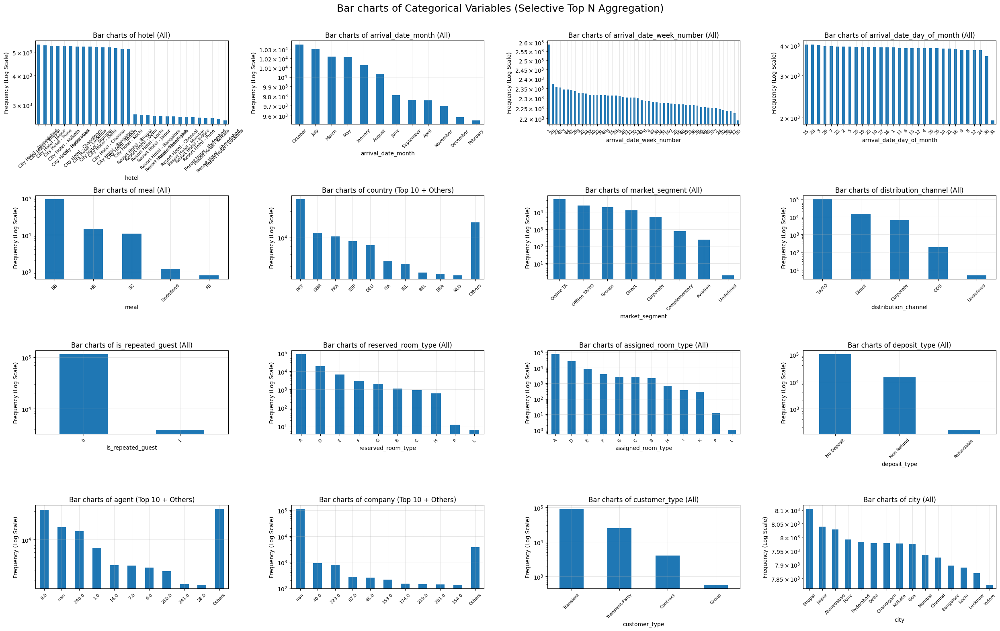

In [ ]:
# Calling the function
BeforeCat = PlotBarCharts_SelectiveTopN(inpData=df, colsToPlot=cols_to_plot)

In [ ]:
# Save Image
import io

def fig_to_img(fig, dpi=150, close=False):
    buf = io.BytesIO()
    fig.savefig(buf, format="png", dpi=dpi, bbox_inches="tight")
    if close:
        plt.close(fig)
    buf.seek(0)
    return Image.open(buf)

# Calling the function to save image
BeforeCat_img = fig_to_img(BeforeCat, dpi=150)

### **Bar Charts Interpretation**

**Interpretation**

**Selected Categorical Variables:**
- **hotel :** Selected. Class Imbalance. City Hotel bookings significantly outnumber Resort Hotel bookings (approx. 2:1 ratio). This indicates that the hotel type is a crucial factor influencing demand and likely impacts cancellation behavior.
- **arrival_date_month :** Selected. Multi-modal Distribution. Shows a clear seasonal pattern, with demand peaking heavily during peak season and dipping in non-peak seasons.
- **arrival_date_week_number :** Selected. Right-skewed. Provides a more granular view of seasonality than the month. The distribution mirrors the monthly trend but with finer peaks and valleys.
- **arrival_date_day_of_month :** Selected. Multi-modal Distribution. The distribution of arrivals is relatively flat across the days of the month (1-31), with minor fluctuations.
- **meal :** Selected. Right-skewed. A vast majority of meal come from BB. The meal feature is important for distinguishing customer types and travel purposes (for example, the FB group often consists of long-stay tourists). This information influences booking flexibility and cancellation behavior.
- **country :** Selected. Strongly Right-skewed. A vast majority of bookings come from the Top 10 countries (especially PRT and GBR). The remaining countries are grouped into "Others," indicating that most predictive power is concentrated in a few classes.
- **market_segment :** Selected. Right-skewed. Online TA (Travel Agents) is the overwhelming dominant segment, followed by Offline TA/TO and Groups. This is highly predictive, as the booking channel often dictates cancellation policy and behavior.
- **distribution_channel :** Selected. Right-skewed. The vast majority of bookings come through TA/TO (Travel Agent/Tour Operator). The volume drops significantly for "Direct" and "Corporate." The channel is highly correlated with pricing and cancellation policies, making it a very strong predictor.
- **is_repeated_guest :** Selected. Strongly Right-skewed. The overwhelming majority of guests are not repeated guests (0). The small percentage of repeated guests (1) will be an important, though imbalanced, factor in prediction.
- **reserved_room_type :** Selected. Right-skewed. Dominated by Room Type A. The key predictive value will come from comparing with assigned_room_type (i.e., whether the assigned room matches the reserved room).
- **assigned_room_type :** Selected. Right-skewed. Dominated by Room Type A. The key predictive value will come from comparing with reserved_room_type (i.e., whether the assigned room matches the reserved room).
- **deposit_type :** Selected. Strongly Right-skewed (class imbalance). A vast majority of bookings are "No Deposit." This feature is extremely valuable, as bookings with a "Non Refund" deposit are highly unlikely to be canceled, making this feature a top predictor for is_canceled.
- **agent :** Selected. Strongly Right-skewed. The distribution is highly concentrated on a single agent (Agent 9), followed by Agent 240 and Agent 1.
- **company :** Selected. Strongly Right-skewed. Similar to agent, the distribution is dominated by a few specific companies (IDs).
- **customer_type :** Selected. Right-skewed. Dominated by Transient guests, followed by Transient-Party. Contract and Group bookings are rare. This is expected to be a strong predictor, distinguishing individual vs. bulk/corporate behavior.
- **city :** Selected. Right-skewed. The booking volume is concentrated in a few cities (e.g., Delhi, Mumbai). This is likely correlated with the hotel type and can be useful in prediction.

**Summary :** No features will be removed.

## **5.2. Visualize distribution of all the Continuous Predictor variables in the data using histograms and boxplots**

Based on the Basic Data Exploration, there are 13 continuous predictor variables : 'lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'days_in_waiting_list', 'adr', 'required_car_parking_spaces' and 'total_of_special_requests'

In [ ]:
def PlotHistChart(cols, ncols):
    nrows = int(np.ceil(len(cols) / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(20, 5*nrows))
    axes = axes.flatten()

    for idx, col in enumerate(cols):
        ax = axes[idx]
        data = df[col].dropna()

        # Calculate statistics
        mean_val = data.mean()
        median_val = data.median()
        std_val = data.std()
        skew_val = data.skew()
        unique_val = data.nunique()

        # Plot histogram
        n, bins, patches = ax.hist(data, bins=30, alpha=0.5, edgecolor='black', density=True)

        # Plot KDE (Kernel Density Estimation) - actual trend of data
        kde = gaussian_kde(data)
        x = np.linspace(data.min(), data.max(), 200)
        ax.plot(x, kde(x), color='lightblue', linestyle='-', linewidth=2, label='KDE (Actual Trend)')

        # Plot vertical lines for mean and median
        ax.axvline(mean_val, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_val:.2f}')
        ax.axvline(median_val, color='green', linestyle='--', linewidth=2, label=f'Median: {median_val:.2f}')

        # Add text box with statistics
        ax.plot([], [], ' ', label=f'Std: {std_val:.2f}')
        ax.plot([], [], ' ', label=f'Skew: {skew_val:.2f}')

        # Set title and labels
        ax.set_title(col, fontsize=16)
        ax.set_ylabel('Frequency', fontsize=14)
        ax.legend(loc='upper right', fontsize=12)
        ax.grid(True, alpha=0.3)

    for idx in range(len(cols), len(axes)):
        axes[idx].set_visible(False)

    plt.suptitle('Histograms of continuous features', fontsize=18, y=1)
    plt.tight_layout()
    plt.show()
    return fig

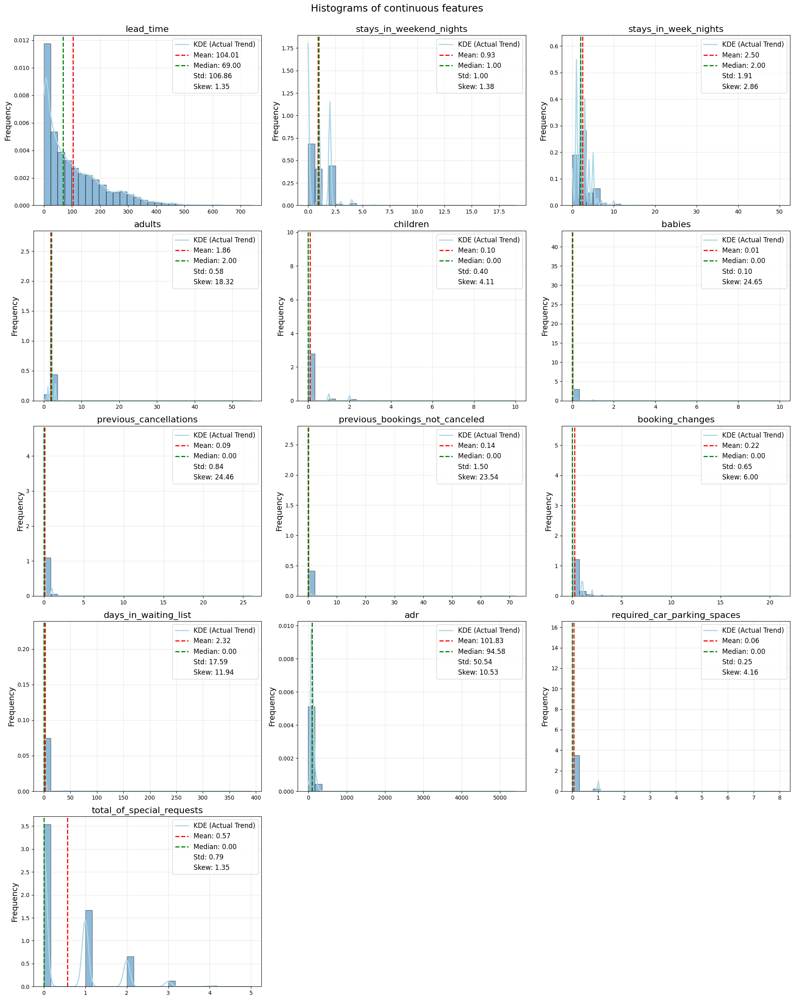

In [ ]:
# Plotting histograms of multiple columns together
continuous_cols= ['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies',
                  'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes',
                  'days_in_waiting_list', 'adr', 'required_car_parking_spaces', 'total_of_special_requests']

BeforeConHis = PlotHistChart(continuous_cols, ncols=3)

# Calling the function to save image
BeforeConHis_img = fig_to_img(BeforeConHis, dpi=150)

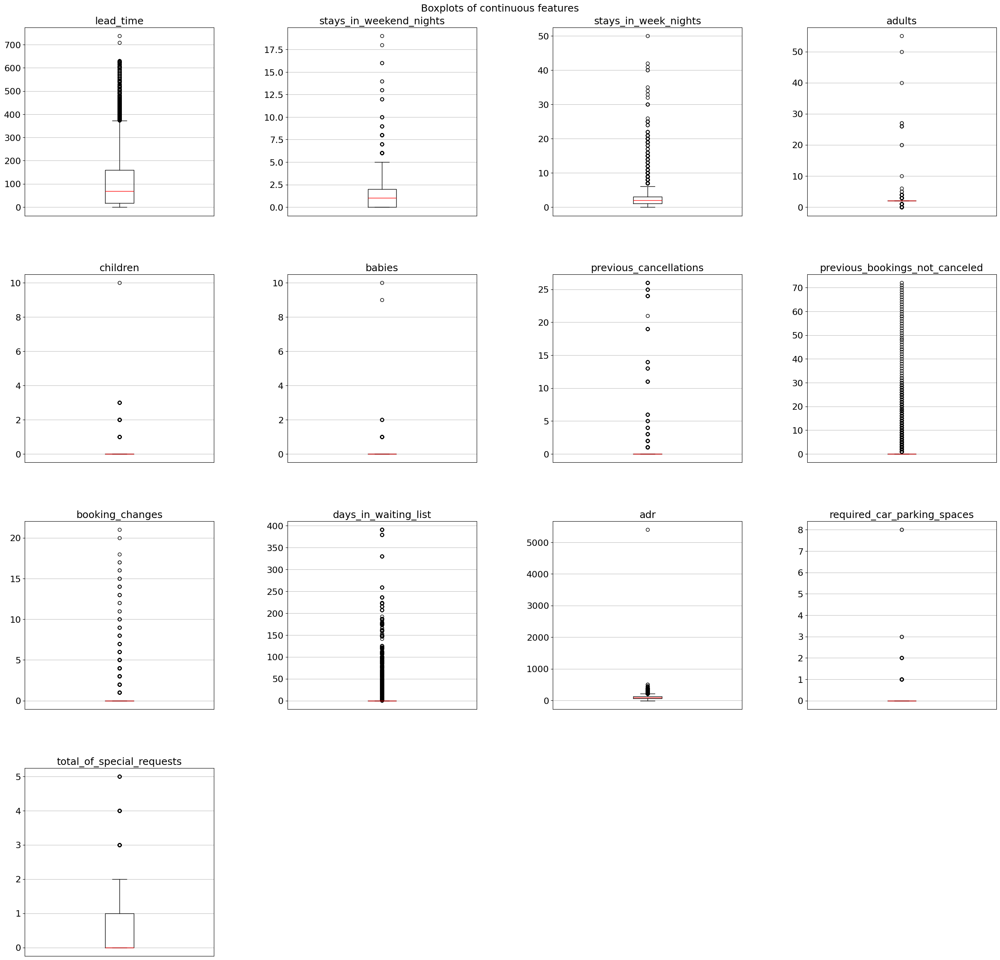

In [ ]:
def plot_multiple_boxplots(df, columns, ncols):
    n = len(columns)
    n_rows = math.ceil(n / ncols)

    fig, axes = plt.subplots(
        n_rows, ncols,
        figsize=(25, 6*n_rows),
        constrained_layout=True,
        gridspec_kw={'wspace': 0.2, 'hspace': 0.2}
    )
    axes = np.atleast_1d(axes).ravel()

    for i, col in enumerate(columns):
        s = pd.to_numeric(df[col], errors='coerce').dropna()
        axes[i].boxplot([s], medianprops=dict(color='red', linewidth=1))
        axes[i].set_title(col, fontsize=18)
        axes[i].set_xticks([])
        axes[i].grid(axis='both', alpha=0.8)
        axes[i].tick_params(axis='y', labelsize=16)

    for j in range(n, len(axes)):
        fig.delaxes(axes[j])

    fig.suptitle('Boxplots of continuous features', fontsize=18)
    return fig

BeforeConBox = plot_multiple_boxplots(df, continuous_cols, ncols=4)
BeforeConBox_img = fig_to_img(BeforeConBox, dpi=150)

### **Histogram Interpretation**

**Interpretation**

**Selected Continuous Variables:** All the continuous variables are selected for further analysis.

- **lead_time :** Selected. Right-skewed. Peak at short notice (0-50 days), slowly decreasing with a long tail extending to 700+ days.
- **stays_in_weekend_nights :** Selected. Right-skewed. Dominated by 0 and 2 nights, rapidly decreasing for longer stays.
- **stays_in_week_nights :** Selected. Right-skewed. Peak at 1-2 nights, rapidly decreasing as length of stay increases.
- **adults :** Selected. Low Variance (Dominant Value). Extremely dominated by value 2, followed by 1.
- **children :** Selected. Highly Zero-inflated. Mostly 0, with a small fraction having 1 or 2.
- **babies :** Selected. Extreme Low Variance. Nearly all values are 0; contains very little information gain. **(Doubt)**
- **previous_cancellations :** Selected. Highly Zero-inflated. Vast majority at 0, very few users have history of cancellations.
- **previous_bookings_not_canceled :** Selected. Highly Zero-inflated / Right-skewed. Massive peak at 0 (indicating most are new customers), with a long thin tail representing repeat/loyal guests.
- **booking_changes :** Selected. Highly Zero-inflated. Most bookings have 0 changes, tapering off quickly for 1+ changes.
- **days_in_waiting_list :** Selected. Extreme Zero-inflated. Almost 100% of data is 0; nonzero values are rare outliers. **(Doubt)**
- **adr :** Selected. Normal Distribution. Currently compressed by extreme outliers (>5000); core data appears normally distributed around 100.
- **required_car_parking_spaces :** Selected. Zero-inflated. Majority do not need parking (0), small group needs 1 space.
- **total_of_special_requests :** Selected. Right-skewed (Step-wise). Most at 0, decreasing frequency in clear steps (1, 2, 3).

**Summary :** No features will be removed. But outliers seen in every features, need to treat them.

# **6. Outlier treatment**



## **6.1 Outlier treatment in Continuous Feature**

From the exploratory data analysis (EDA), specifically through Histogram and Boxplot visualization, reveals the presence of significant outliers across nearly all continuous features in the dataset. These extreme values, if left untreated, can severely distort model training and inflate error metrics. Therefore, a robust and principled strategy is essential for outlier treatment. We propose a two-pronged methodology that combines statistical rigor with domain knowledge to ensure data quality while minimizing the loss of potentially predictive information:
1. Domain-Specific Assessment (Feasibility Check)
  - This approach prioritizes data integrity by evaluating whether an extreme value represents a true data error or an extreme but valid event based on real-world constraints.
  - Action: Review the observed extreme values against logical and physical constraints of hotel booking data (e.g., impossible number of guests, negative rates).
  - Goal: Identify and clean definitive errors
2. Statistical Quantification (Interquartile Range - IQR)
  - The IQR method provides a systematic, data-driven approach to defining the boundaries of 'normality' for the distribution.
  - Action: Calculate the upper and lower bounds using the standard $Q1 - 1.5 \times \text{IQR}$ and $Q3 + 1.5 \times \text{IQR}$ formulas for each feature.
  - Goal: Identify all values that statistically deviate far from the central tendency of the data.

The final decision on treating each outlier will be made by comparing the results from both methods

**Rationale for Defined Boundaries (Domain Justification)**

The limits are designed to capture extreme, but credible, business scenarios while filtering out impossible data artifacts:

- lead_time (0 to 730 Days): A minimum of 0 (same-day booking) is standard. A maximum of 730 days (approximately two years) is used as a hard cutoff. While longer lead times are theoretically possible, bookings made more than two years in advance are highly unstable or may represent system errors.
- stays_in_weekend_nights (0 to 20 Nights): These limits allow for extremely long stays, combining to allow for stays up to approximately 10 weeks. A stay exceeding two months is highly unusual in the general hotel market but is treated as a possible, extreme scenario.
- stays_in_week_nights (0 to 50 Nights): These limits allow for extremely long stays, combining to allow for stays up to approximately 10 weeks. A stay exceeding two months is highly unusual in the general hotel market but is treated as a possible, extreme scenario.
- adults (1 to 4 Persons): The minimum is set to 1 as a booking requires at least one adult to be considered a legal reservation. The maximum is 4, reflecting the typical capacity limit of a standard family room or suite. Values greater than 4 are highly likely to be data entry errors for a single room booking.
- children (0 to 3 Persons): The maximum is set to 3, as a total of 7 guests (4 adults + 3 children/babies) represents a practical upper limit for even the largest single-room accommodations.
- babies (0 to 3 Persons): The maximum is set to 3, as a total of 7 guests (4 adults + 3 children/babies) represents a practical upper limit for even the largest single-room accommodations.
- previous_cancellations (0 to 30): This feature represent a customer's historical transactional count. The limits are set generously high to allow for frequent repeat customers, but they serve as a boundary against system overflow errors (e.g., counts in the millions).
- previous_bookings_not_canceled (0 to 100): This feature represent a customer's historical transactional count. The limits are set generously high to allow for frequent repeat customers, but they serve as a boundary against system overflow errors (e.g., counts in the millions).
- booking_changes (0 to 10): A maximum of 10 changes is considered an extreme but valid scenario, as frequent changes indicate a highly unstable booking. Anything higher is considered suspicious.
- days_in_waiting_list (0 to 730 Days): Similar to lead time, a maximum of 730 days is a pragmatic upper limit for a booking to remain in an unconfirmed state; anything longer is highly improbable.
- adr (0 to 1000 Monetary Units): The minimum is set to 0 because negative rates (which exist in the raw data) or promotional complimentary rates are considered errors or exceptions that should be handled separately. A maximum of 1000 serves as a practical, high-end price cap for most luxury hotel rates in this dataset's context.
- required_car_parking_spaces (0 to 4): A minimum of 0 and a maximum of 4 are set, as requesting more than four parking spaces for a single booking is highly uncommon and likely an error.
- total_of_special_requests (0 to 5): A maximum of 5 is reasonable, as exceeding this number suggests an extremely demanding customer or a data entry anomaly.

In [ ]:
# Continuous Column
continuous_cols= ['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies',
                  'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes',
                  'days_in_waiting_list', 'adr', 'required_car_parking_spaces', 'total_of_special_requests']

# Define Domain Knowledge Limits (Assumptions based on hotel booking context)
domain_limits = {
    'Feature': continuous_cols,
    'Min_Possible': [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    'Max_Possible': [730, 20, 50, 4, 3, 3, 30, 100, 10, 730, 1000, 4, 5]
    # Max values are set to reasonable, high but feasible limits (e.g., 2 years lead time, 5 weeks stay)
}
df_domain = pd.DataFrame(domain_limits)

# Function to calculate IQR bounds
def calculate_iqr_bounds(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1

    # Lower Bound: Q1 - 1.5 * IQR
    lower_bound = Q1 - 1.5 * IQR
    # Upper Bound: Q3 + 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Ensure lower bound is not negative (often applied to count data)
    lower_bound = max(0, lower_bound)

    return lower_bound, upper_bound

# Calculate IQR ranges for all columns
iqr_results = {}
for col in continuous_cols:
    lower, upper = calculate_iqr_bounds(df[col].dropna())
    iqr_results[col] = {
        'IQR_Lower_Bound': lower,
        'IQR_Upper_Bound': upper
    }

df_iqr = pd.DataFrame.from_dict(iqr_results, orient='index').reset_index().rename(columns={'index': 'Feature'})


# Merge and display the results
df_final_comparison = pd.merge(df_domain, df_iqr, on='Feature')

# Reorder columns for better readability
df_final_comparison = df_final_comparison[[
    'Feature',
    'Min_Possible', 'Max_Possible',
    'IQR_Lower_Bound', 'IQR_Upper_Bound'
]]

print("Comparison Table of Feasible Range (Domain Knowledge) and Statistical Range (IQR)")
print("Note: Statistical Bounds (IQR) less than 0 have been set to 0.")
print("-" * 100)
print(df_final_comparison.to_markdown(index=False, floatfmt=".2f"))

Comparison Table of Feasible Range (Domain Knowledge) and Statistical Range (IQR)
Note: Statistical Bounds (IQR) less than 0 have been set to 0.
----------------------------------------------------------------------------------------------------
| Feature                        |   Min_Possible |   Max_Possible |   IQR_Lower_Bound |   IQR_Upper_Bound |
|:-------------------------------|---------------:|---------------:|------------------:|------------------:|
| lead_time                      |              0 |            730 |              0.00 |            373.00 |
| stays_in_weekend_nights        |              0 |             20 |              0.00 |              5.00 |
| stays_in_week_nights           |              0 |             50 |              0.00 |              6.00 |
| adults                         |              1 |              4 |              2.00 |              2.00 |
| children                       |              0 |              3 |              0.00 |            

**Decision on Outlier Boundaries**

Upon comparing the Feasible Range (Domain Knowledge) with the Statistical Range (IQR Range), it was observed that the IQR bounds are generally much narrower than the feasible range (particularly the upper bounds). Directly applying the IQR method would result in the loss of observations categorized as Extreme but Valid. Therefore, we have decided to adopt the Feasible Range as the primary guideline for defining the minimum and maximum thresholds, thus preserving data points that hold critical business relevance.

### **6.1.1 Outlier treatment for 'lead_time'**

In [ ]:
# Count the number of outliers
outliers = ((df['lead_time'] < 0) | (df['lead_time'] > 730)).sum()
print(f'Outlier count: {outliers}')

# Calculate percent of outliers
percent_outliers = (outliers / len(df)) * 100
print(f'Outlier percentage: {percent_outliers:.2f}%')

Outlier count: 1
Outlier percentage: 0.00%


In this feature, outliers accounted for only about 0.00% of the entire dataset. Given their small proportion, they were removed to prevent bias and preserve data quality, and their exclusion did not compromise the overall integrity of the dataset.

In [ ]:
# Remove these outlier rows
df = df[df['lead_time'].between(0, 730, inclusive='both') | df['lead_time'].isna()]

**Visualizing distribution after outlier treatment**

The distribution has improved after the outlier treatment. There is still a tail, but it is moderate and remains within the feasible range; hence, it is acceptable.

In [ ]:
from scipy.stats import gaussian_kde

def hist_box(col, bins=30):
    s = col.dropna()
    col_name = col.name
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))

    # Histogram
    ax[0].hist(s, bins=bins, alpha=0.5, edgecolor='black', density=True)
    ax[0].set_title(f'Histogram: {col_name}')
    ax[0].set_xlabel(col_name)
    # Calculate statistics
    mean_val = s.mean()
    median_val = s.median()
    # Plot KDE
    kde = gaussian_kde(s)
    x = np.linspace(s.min(), s.max(), 200)
    ax[0].plot(x, kde(x), color='lightblue', linestyle='-', linewidth=2, label='KDE')
    # Plot mean and median
    ax[0].axvline(mean_val, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_val:.2f}')
    ax[0].axvline(median_val, color='green', linestyle='--', linewidth=2, label=f'Median: {median_val:.2f}')
    ax[0].legend()

    # Boxplot
    ax[1].boxplot(s, vert=True, showfliers=True)
    ax[1].set_title(f'Boxplot: {col_name}')
    ax[1].set_ylabel(col_name)
    ax[1].grid(axis='both', alpha=0.3)

    plt.tight_layout()
    plt.show()

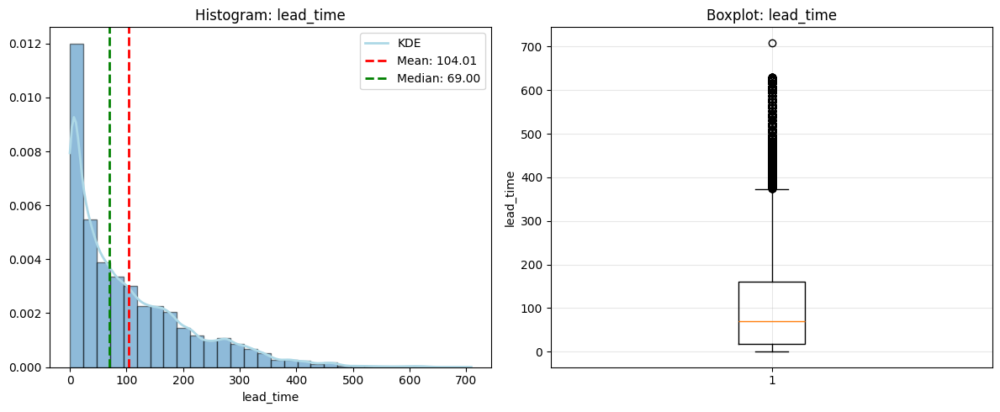

In [ ]:
# Calling function
hist_box(df['lead_time'])

### **6.1.2 Outlier treatment for 'stays_in_weekend_nights'**

In [ ]:
# Count the number of outliers
outliers = ((df['stays_in_weekend_nights'] < 0) | (df['stays_in_weekend_nights'] > 20)).sum()
print(f'Outlier count: {outliers}')

# Calculate percent of outliers
percent_outliers = (outliers / len(df)) * 100
print(f'Outlier percentage: {percent_outliers:.2f}%')

Outlier count: 0
Outlier percentage: 0.00%


No outliers were found in this feature; therefore, no treatment is required.

### **6.1.3 Outlier treatment for 'stays_in_week_nights'**

In [ ]:
# Count the number of outliers
outliers = ((df['stays_in_week_nights'] < 0) | (df['stays_in_week_nights'] > 50)).sum()
print(f'Outlier count: {outliers}')

# Calculate percent of outliers
percent_outliers = (outliers / len(df)) * 100
print(f'Outlier percentage: {percent_outliers:.2f}%')

Outlier count: 0
Outlier percentage: 0.00%


No outliers were found in this feature; therefore, no treatment is required.

### **6.1.4 Outlier treatment for 'adults'**

In [ ]:
# Count the number of outliers
outliers = ((df['adults'] < 1) | (df['adults'] > 4)).sum()
print(f'Outlier count: {outliers}')

# Calculate percent of outliers
percent_outliers = (outliers / len(df)) * 100
print(f'Outlier percentage: {percent_outliers:.2f}%')

Outlier count: 419
Outlier percentage: 0.35%


In this feature, outliers accounted for only about 0.35% of the entire dataset. Given their small proportion, they were removed to prevent bias and preserve data quality, and their exclusion did not compromise the overall integrity of the dataset.

In [ ]:
# Remove these outlier rows
df = df[df['adults'].between(1, 4, inclusive='both') | df['adults'].isna()]

**Visualizing distribution after outlier treatment**

The distribution has improved after the outlier treatment. There is still a tail, but it is moderate and remains within the feasible range; hence, it is acceptable.

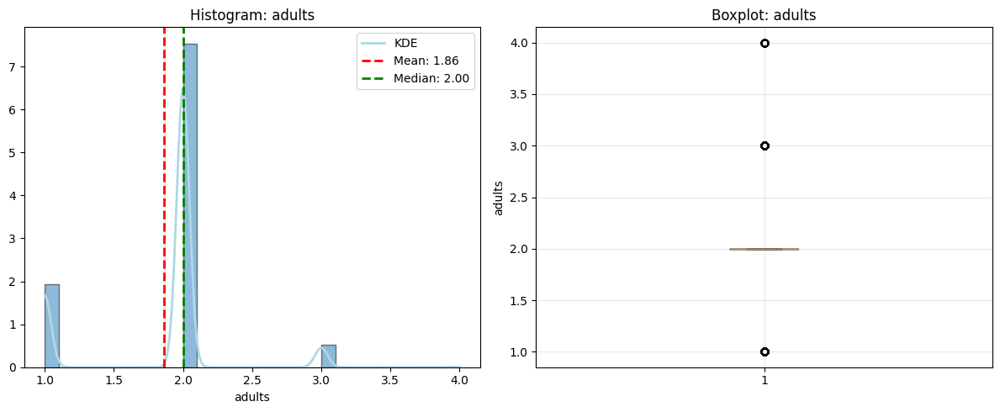

In [ ]:
# Calling function
hist_box(df['adults'])

### **6.1.5 Outlier treatment for 'children'**

In [ ]:
# Count the number of outliers
outliers = ((df['children'] < 0) | (df['children'] > 3)).sum()
print(f'Outlier count: {outliers}')

# Calculate percent of outliers
percent_outliers = (outliers / len(df)) * 100
print(f'Outlier percentage: {percent_outliers:.2f}%')

Outlier count: 1
Outlier percentage: 0.00%


In this feature, outliers accounted for only about 0.00% of the entire dataset. Given their small proportion, they were removed to prevent bias and preserve data quality, and their exclusion did not compromise the overall integrity of the dataset.

In [ ]:
# Remove these outlier rows
df = df[df['children'].between(0, 3, inclusive='both') | df['children'].isna()]

**Visualizing distribution after outlier treatment**

The distribution has improved after the outlier treatment. There is still a tail, but it is moderate and remains within the feasible range; hence, it is acceptable.

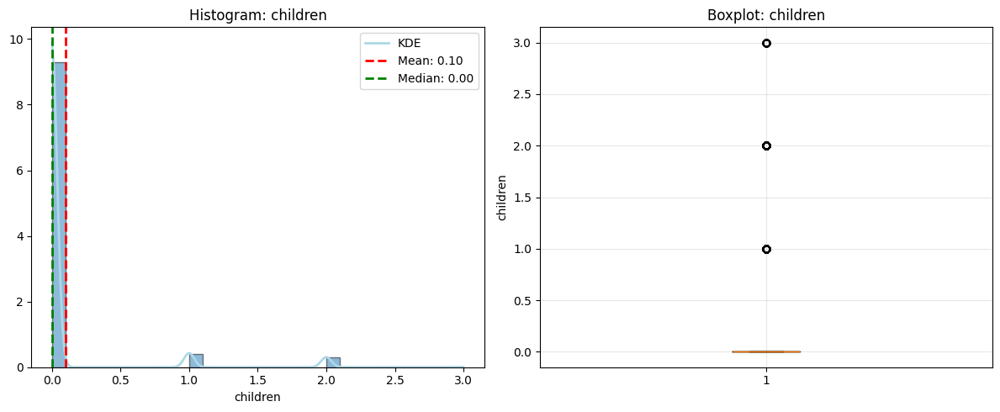

In [ ]:
# Calling function
hist_box(df['children'])

### **6.1.6 Outlier treatment for 'babies'**

In [ ]:
# Count the number of outliers
outliers = ((df['babies'] < 0) | (df['babies'] > 3)).sum()
print(f'Outlier count: {outliers}')

# Calculate percent of outliers
percent_outliers = (outliers / len(df)) * 100
print(f'Outlier percentage: {percent_outliers:.2f}%')

Outlier count: 2
Outlier percentage: 0.00%


In this feature, outliers accounted for only about 0.00% of the entire dataset. Given their small proportion, they were removed to prevent bias and preserve data quality, and their exclusion did not compromise the overall integrity of the dataset.

In [ ]:
# Remove these outlier rows
df = df[df['babies'].between(0, 3, inclusive='both') | df['babies'].isna()]

**Visualizing distribution after outlier treatment**

The distribution has improved after the outlier treatment. There is still a tail, but it is moderate and remains within the feasible range; hence, it is acceptable.

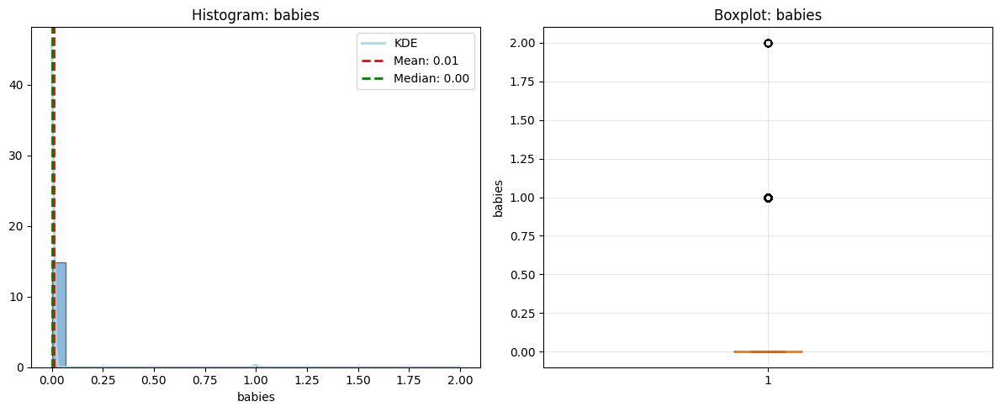

In [ ]:
# Calling function
hist_box(df['babies'])

### **6.1.7 Outlier treatment for 'previous_cancellations'**

In [ ]:
# Count the number of outliers
outliers = ((df['previous_cancellations'] < 0) | (df['previous_cancellations'] > 30)).sum()
print(f'Outlier count: {outliers}')

# Calculate percent of outliers
percent_outliers = (outliers / len(df)) * 100
print(f'Outlier percentage: {percent_outliers:.2f}%')

Outlier count: 0
Outlier percentage: 0.00%


No outliers were found in this feature; therefore, no treatment is required.

### **6.1.8 Outlier treatment for 'previous_bookings_not_canceled'**

In [ ]:
# Count the number of outliers
outliers = ((df['previous_bookings_not_canceled'] < 0) | (df['previous_bookings_not_canceled'] > 100)).sum()
print(f'Outlier count: {outliers}')

# Calculate percent of outliers
percent_outliers = (outliers / len(df)) * 100
print(f'Outlier percentage: {percent_outliers:.2f}%')

Outlier count: 0
Outlier percentage: 0.00%


No outliers were found in this feature; therefore, no treatment is required.

### **6.1.9 Outlier treatment for 'booking_changes'**

In [ ]:
# Count the number of outliers
outliers = ((df['booking_changes'] < 0) | (df['booking_changes'] > 10)).sum()
print(f'Outlier count: {outliers}')

# Calculate percent of outliers
percent_outliers = (outliers / len(df)) * 100
print(f'Outlier percentage: {percent_outliers:.2f}%')

Outlier count: 18
Outlier percentage: 0.02%


In this feature, outliers accounted for only about 0.02% of the entire dataset. Given their small proportion, they were removed to prevent bias and preserve data quality, and their exclusion did not compromise the overall integrity of the dataset.

In [ ]:
# Remove these outlier rows
df = df[df['booking_changes'].between(0, 10, inclusive='both') | df['booking_changes'].isna()]

**Visualizing distribution after outlier treatment**

The distribution has improved after the outlier treatment. There is still a tail, but it is moderate and remains within the feasible range; hence, it is acceptable.

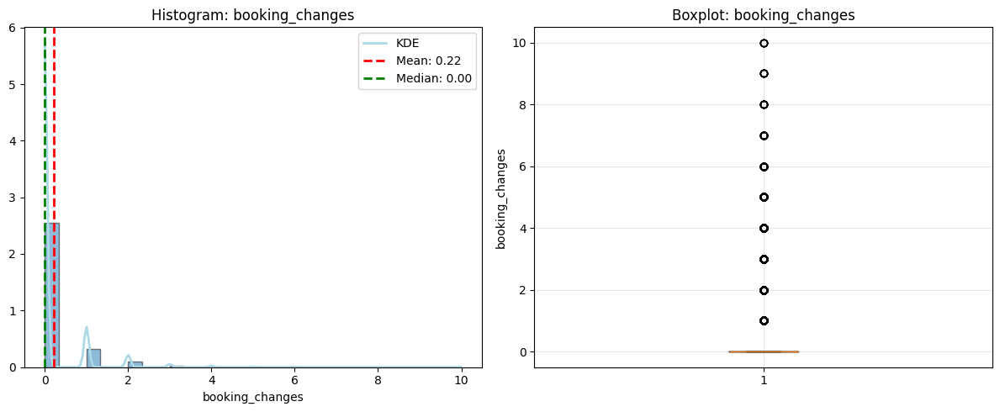

In [ ]:
# Calling function
hist_box(df['booking_changes'])

### **6.1.10 Outlier treatment for 'days_in_waiting_list'**

In [ ]:
# Count the number of outliers
outliers = ((df['days_in_waiting_list'] < 0) | (df['days_in_waiting_list'] > 730)).sum()
print(f'Outlier count: {outliers}')

# Calculate percent of outliers
percent_outliers = (outliers / len(df)) * 100
print(f'Outlier percentage: {percent_outliers:.2f}%')

Outlier count: 0
Outlier percentage: 0.00%


No outliers were found in this feature; therefore, no treatment is required.

### **6.1.11 Outlier treatment for 'adr'**

In [ ]:
# Count the number of outliers
outliers = ((df['adr'] < 0) | (df['adr'] > 1000)).sum()
print(f'Outlier count: {outliers}')

# Calculate percent of outliers
percent_outliers = (outliers / len(df)) * 100
print(f'Outlier percentage: {percent_outliers:.2f}%')

Outlier count: 2
Outlier percentage: 0.00%


In this feature, outliers accounted for only about 0.00% of the entire dataset. Given their small proportion, they were removed to prevent bias and preserve data quality, and their exclusion did not compromise the overall integrity of the dataset.

In [ ]:
# Remove these outlier rows
df = df[df['adr'].between(0, 1000, inclusive='both') | df['adr'].isna()]

**Visualizing distribution after outlier treatment**

The distribution has improved after the outlier treatment. There is still a tail, but it is moderate and remains within the feasible range; hence, it is acceptable.

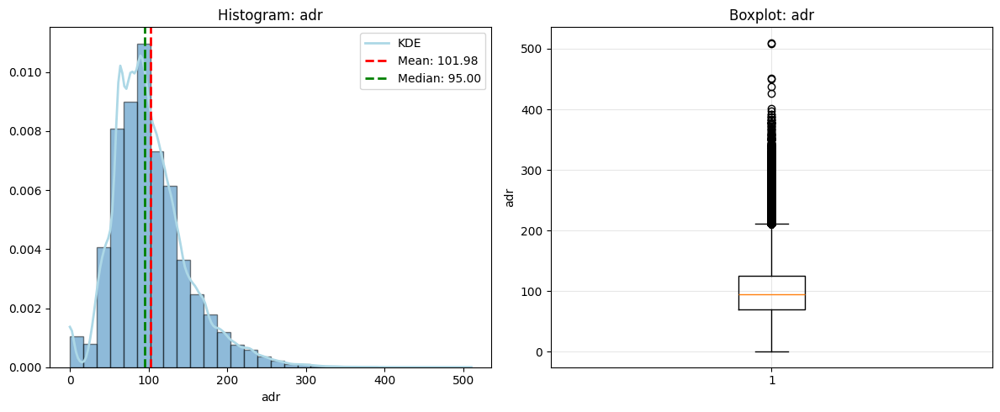

In [ ]:
# Calling function
hist_box(df['adr'])

### **6.1.12 Outlier treatment for 'required_car_parking_spaces'**

In [ ]:
# Count the number of outliers
outliers = ((df['required_car_parking_spaces'] < 0) | (df['required_car_parking_spaces'] > 4)).sum()
print(f'Outlier count: {outliers}')

# Calculate percent of outliers
percent_outliers = (outliers / len(df)) * 100
print(f'Outlier percentage: {percent_outliers:.2f}%')

Outlier count: 2
Outlier percentage: 0.00%


In this feature, outliers accounted for only about 0.00% of the entire dataset. Given their small proportion, they were removed to prevent bias and preserve data quality, and their exclusion did not compromise the overall integrity of the dataset.

In [ ]:
# Remove these outlier rows
df = df[df['required_car_parking_spaces'].between(0, 4, inclusive='both') | df['required_car_parking_spaces'].isna()]

**Visualizing distribution after outlier treatment**

The distribution has improved after the outlier treatment. There is still a tail, but it is moderate and remains within the feasible range; hence, it is acceptable.

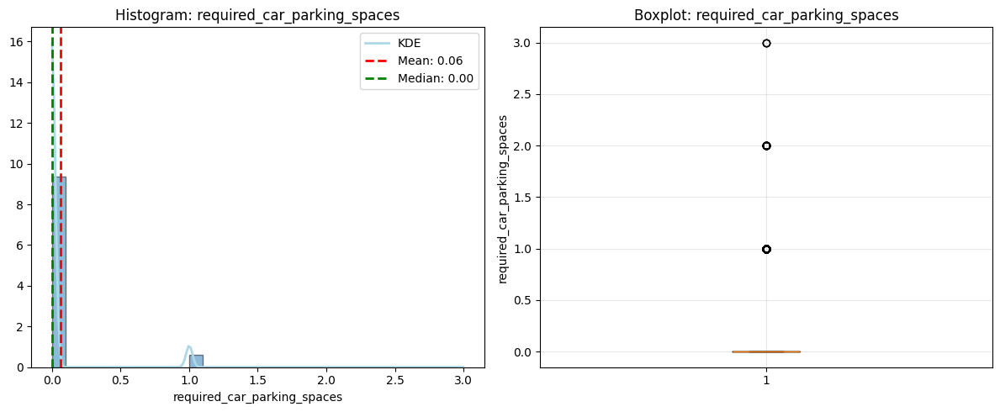

In [ ]:
# Calling function
hist_box(df['required_car_parking_spaces'])

### **6.1.13 Outlier treatment for 'total_of_special_requests'**

In [ ]:
# Count the number of outliers
outliers = ((df['total_of_special_requests'] < 0) | (df['total_of_special_requests'] > 5)).sum()
print(f'Outlier count: {outliers}')

# Calculate percent of outliers
percent_outliers = (outliers / len(df)) * 100
print(f'Outlier percentage: {percent_outliers:.2f}%')

Outlier count: 0
Outlier percentage: 0.00%


No outliers were found in this feature; therefore, no treatment is required.

## **6.2 Rare Categories in Categorical Feature**

For the categorical features, rare categories will be identified to reduce bias and improve the model’s performance.

In [ ]:
# Define Categorical Columns (including high-cardinality ones for full analysis)
categorical_cols = [
    'hotel', 'arrival_date_month', 'arrival_date_week_number', 'arrival_date_day_of_month',
    'meal', 'country', 'market_segment', 'distribution_channel', 'is_repeated_guest',
    'reserved_room_type', 'assigned_room_type', 'deposit_type', 'customer_type', 'city', 'agent', 'company'
]

# Define the threshold for Rare Categories (less than 1%)
RARE_THRESHOLD = 0.01

# Function to find and report rare categories
def find_rare_categories(df, cols, threshold):
    rare_category_report = {}

    for col in cols:
        # Calculate frequency percentage, including missing values (NaN)
        # normalize=True gives proportions
        frequency_series = df[col].value_counts(dropna=False, normalize=True)

        # Filter categories that are below the threshold
        rare_categories = frequency_series[frequency_series < threshold]

        if not rare_categories.empty:
            # Convert proportions to percentages
            rare_categories_percent = (rare_categories * 100).sort_values(ascending=False)
            rare_category_report[col] = rare_categories_percent

    return rare_category_report

# Execute the function
rare_report = find_rare_categories(df, categorical_cols, RARE_THRESHOLD)

# Display the results
print(f"รายงานหมวดหมู่หายาก (Rare Categories) - ความถี่น้อยกว่า {RARE_THRESHOLD*100:.0f}% ของข้อมูลทั้งหมด")
print("-" * 80)

if not rare_report:
    print("ไม่พบ Rare Categories ใน Feature หมวดหมู่ที่ตรวจสอบตามเกณฑ์ที่กำหนด")
else:
    for col, categories in rare_report.items():
        # Calculate the total percentage accounted for by these rare categories
        total_rare_percent = categories.sum()

        print(f"\nFeature: {col} (รวม {total_rare_percent:.2f}% ของข้อมูลทั้งหมด)")
        print("--------------------------------")

        # Print the rare categories and their percentages
        for category, percent in categories.items():
            # Handle NaN display
            category_label = 'Missing/NaN' if pd.isna(category) else str(category)
            print(f"  - {category_label}: {percent:.3f}%")

        # Add a placeholder for brevity for columns with too many rare categories
        if len(categories) > 50:
            print(f"  ... และอื่นๆ อีก {len(categories) - 50} หมวดหมู่")

print("\n" + "-" * 80)

รายงานหมวดหมู่หายาก (Rare Categories) - ความถี่น้อยกว่า 1% ของข้อมูลทั้งหมด
--------------------------------------------------------------------------------

Feature: meal (รวม 1.65% ของข้อมูลทั้งหมด)
--------------------------------
  - Undefined: 0.983%
  - FB: 0.671%

Feature: country (รวม 10.21% ของข้อมูลทั้งหมด)
--------------------------------
  - SWE: 0.855%
  - CHN: 0.839%
  - POL: 0.769%
  - ISR: 0.562%
  - RUS: 0.526%
  - NOR: 0.506%
  - ROU: 0.418%
  - Missing/NaN: 0.402%
  - FIN: 0.373%
  - DNK: 0.362%
  - AUS: 0.358%
  - AGO: 0.304%
  - LUX: 0.240%
  - MAR: 0.215%
  - TUR: 0.208%
  - HUN: 0.192%
  - ARG: 0.179%
  - JPN: 0.166%
  - CZE: 0.144%
  - IND: 0.126%
  - KOR: 0.111%
  - GRC: 0.108%
  - DZA: 0.087%
  - SRB: 0.085%
  - HRV: 0.084%
  - MEX: 0.071%
  - EST: 0.070%
  - IRN: 0.069%
  - LTU: 0.068%
  - ZAF: 0.066%
  - BGR: 0.063%
  - NZL: 0.062%
  - COL: 0.060%
  - UKR: 0.057%
  - MOZ: 0.056%
  - SVK: 0.055%
  - CHL: 0.054%
  - THA: 0.049%
  - ISL: 0.048%
  - SVN: 0.047%


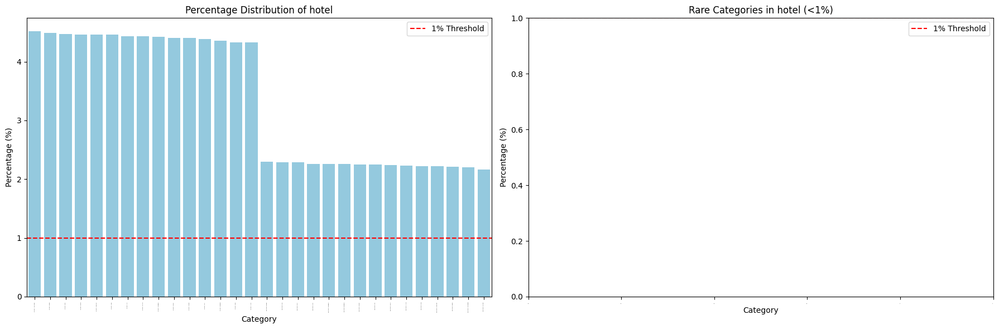

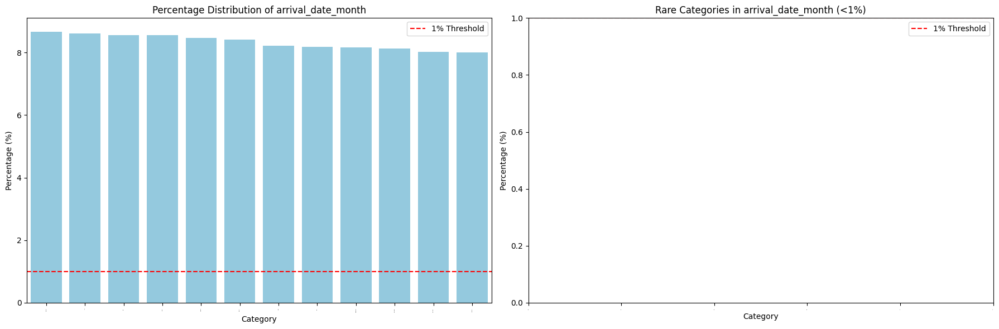

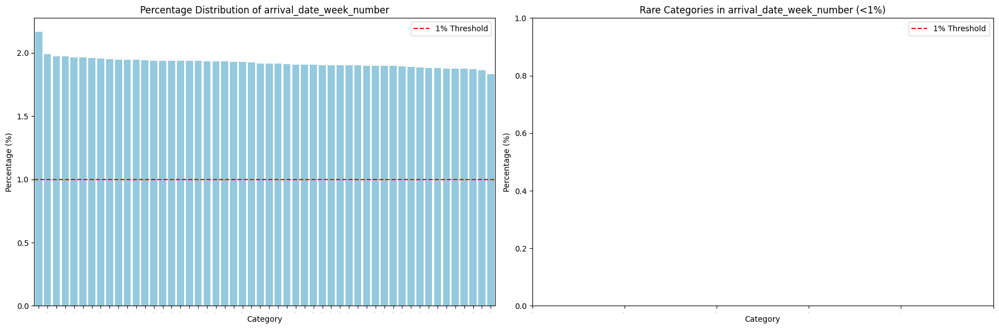

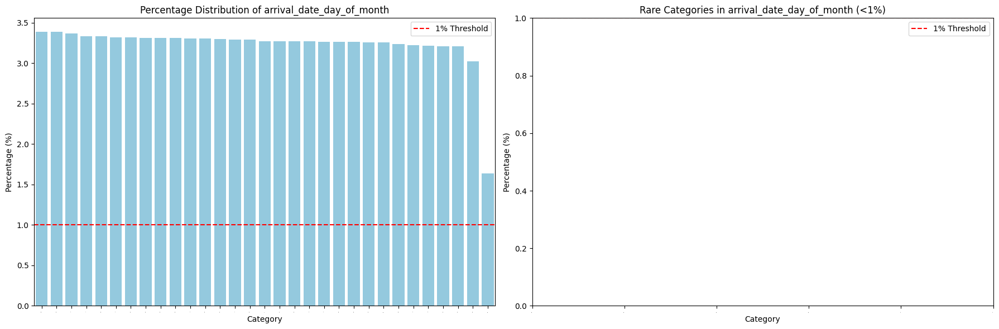

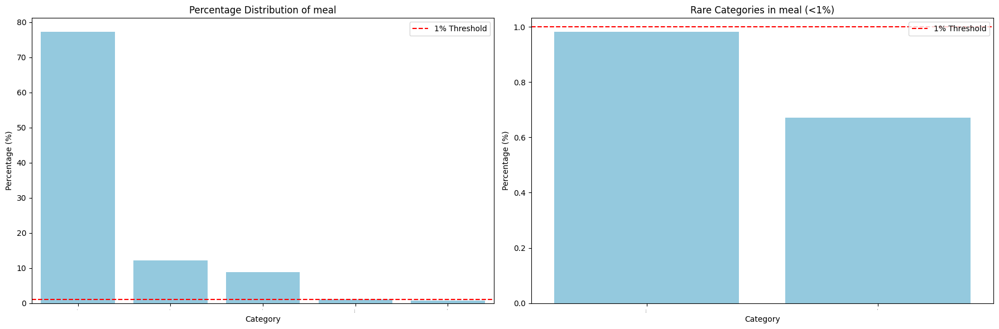

...

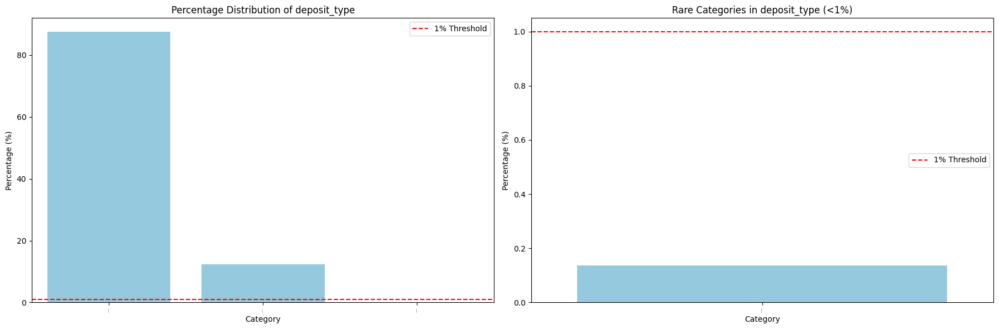

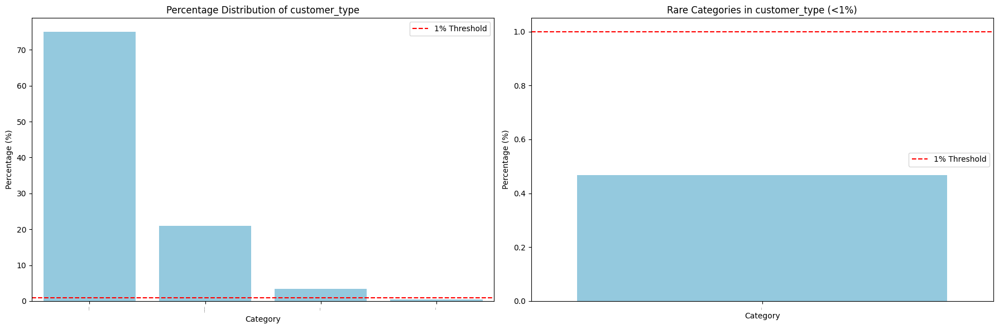

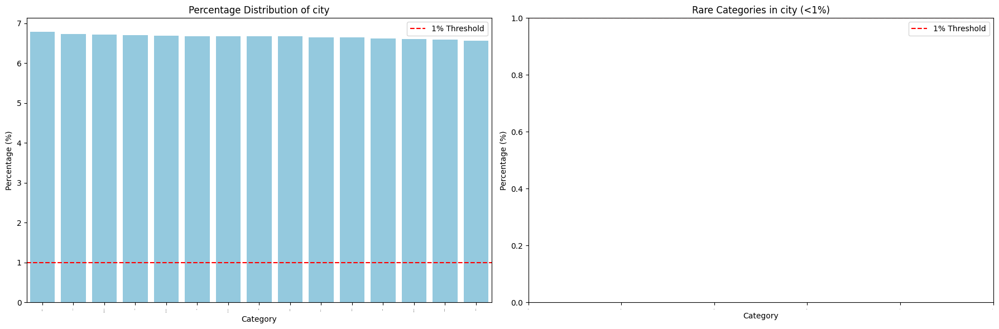

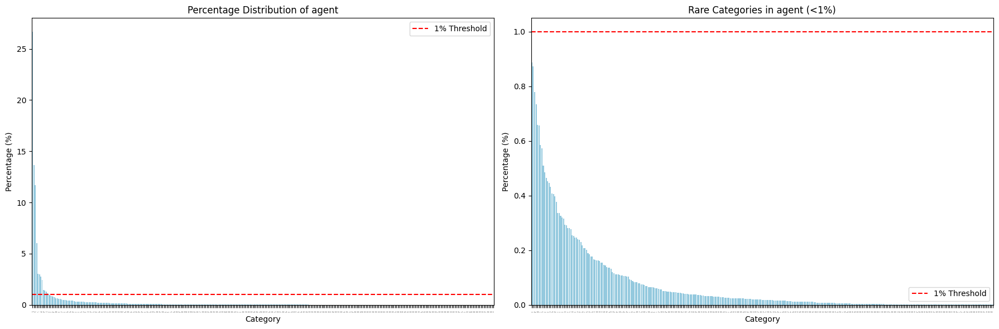

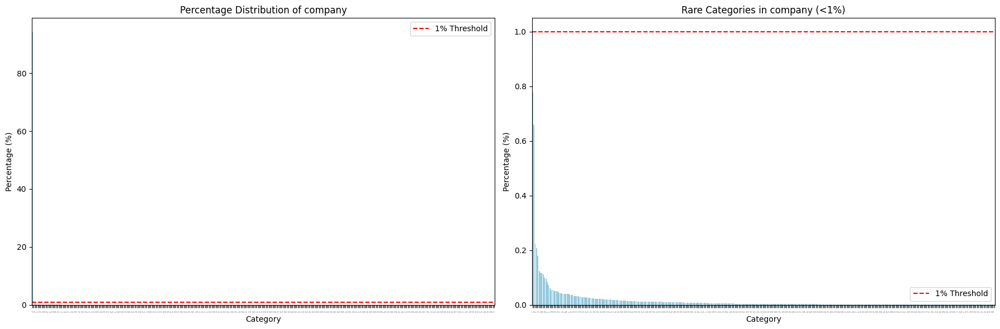

In [ ]:
threshold = 0.01   # 1%

for col in categorical_cols:
    full_counts = df[col].value_counts(dropna=False)
    full_pct = full_counts / len(df) * 100

    rare_pct = full_pct[full_pct < threshold * 100]
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))

    # Plot Full Distribution (%)
    sns.barplot(
        x=full_pct.index.astype(str),
        y=full_pct.values,
        ax=axes[0],
        color='skyblue'
    )

    axes[0].set_title(f'Percentage Distribution of {col}')
    axes[0].set_xlabel('Category')
    axes[0].set_ylabel('Percentage (%)')
    axes[0].axhline(y=threshold * 100, color='red', linestyle='--', label='1% Threshold')
    axes[0].legend()
    axes[0].tick_params(axis='x', rotation=90, labelsize=1)

    # Plot Rare Categories Only (%)
    sns.barplot(
        x=rare_pct.index.astype(str),
        y=rare_pct.values,
        ax=axes[1],
        color='skyblue'
    )

    axes[1].set_title(f'Rare Categories in {col} (<1%)')
    axes[1].set_xlabel('Category')
    axes[1].set_ylabel('Percentage (%)')
    axes[1].axhline(y=threshold * 100, color='red', linestyle='--', label='1% Threshold')
    axes[1].legend()
    axes[1].tick_params(axis='x', rotation=90, labelsize=1)

    plt.tight_layout()
    plt.show()

**Summary of Categorical Data Treatment**
1. Features Requiring Aggregation
  - These features exhibit extremely high cardinality and numerous Rare Categories (low-frequency classes). Aggregation is necessary to reduce the dimensionality of the data and mitigate the risk of overfitting.
  | Feature     | Problem (Total % Rare) | Justification                                                                                                                                   |
| ----------- | ---------------------- | ----------------------------------------------------------------------------------------------------------------------------------------------- |
| **country** | 10.21% rare            | The top 10–20 countries cover most predictive value; keeping hundreds of unique codes adds noise and unnecessary complexity.                    |
| **agent**   | 24.47% rare            | Nearly one-quarter of Agent IDs are rare, indicating extremely high cardinality that can dilute model performance if left ungrouped.            |
| **company** | 5.69% rare             | Company IDs are highly concentrated; remaining low-frequency IDs aggregated to reduce cardinality. |

2. Features Retained as Individual Categories (Keep as Is)
  - These features have few unique values, and the rare categories they do possess are often highly predictive of behavior, thus holding significant Domain Knowledge value.
  | Feature                               | Rare Examples                | Justification                                             |
| ------------------------------------- | ---------------------------- | --------------------------------------------------------- |
| meal                                  | FB (0.67%), Undefined        | Distinct meal plans affecting pricing and guest profiles. |
| deposit_type                          | Refundable (0.14%)           | Strong signal for cancellation risk.                      |
| customer_type                         | Group (0.47%)                | Unique behavior affecting pricing/cancellation.           |
| market_segment / distribution_channel | Complementary, Aviation, GDS | Important niche markets worth preserving.                 |
| **reserved_room_type** | C, B, H, L (2.05%)        | Room type codes carry implicit ordinal meaning and reflect pricing and customer expectations. Merging them would remove meaningful distinctions.        |
| **assigned_room_type** | H, I, K, L (1.06%)        | The actual room assigned strongly affects guest satisfaction. Grouping rare room codes would obscure important differences between assigned room types. |

**Summary :** All features will be retained, but some may require additional treatment.



# **7. Missing values treatment**

Treating missing values is crucial for maintaining model accuracy and data quality. Unaddressed missing data can lead to biased results and errors. Identifying the pattern of missing values helps decide whether to impute or remove them, ensuring the dataset is ready for training without impacting model performance.

Project Missing Values Handling Pipeline
1. **Initial Check**
  - Goal: Check the quantity and location of missing data to understand the situation.
2. **Identify the Cause**
  - Goal: Determine whether data is missing due to Error or a specific Pattern.
  - Techniques used:
      - msno.matrix: Show the distribution of missing data.
      - msno.heatmap: Show the correlation between missingness and other variables.
  - Identify missingness type:
    - MCAR (Missing Completely At Random): Missing data is random, with no relationship to any variables.
    - MAR (Missing At Random): Missing data is related to other observed variables
    - MNAR (Missing Not At Random): Missing data is related to its own value (e.g., data deliberately hidden or omitted).
3. **Treatment Strategy**
  - Goal: Select the appropriate handling method based on the type of variable and the amount of missing data.
  
  1. Target Variable:
    
    - Solution: Remove Row
    - Reasoning: Model cannot learn without true labels. If the target variable's missing data is imputed incorrectly, the model will learn from incorrect information.

  2. Feature Variable:

    - Case 1: High missing (> 30%):
       - If it's MCAR: Drop Column because if data is randomly missing, dropping the column prevents wasting time on unnecessary processing.
       **- If it's MAR: Feature Engineering (e.g., create a new variable such as is_agent_missing (0/1) or replace missing values with "None", "Direct", or "Unknown").**

    - Case 2: Low missing (< 30%): Imputation (filling missing values)
      - Numerical Data
      - Categorical Data

In [ ]:
print(df)

                            hotel  is_canceled  lead_time arrival_date_month  \
0       Resort Hotel - Chandigarh            0        342               July   
2            Resort Hotel - Delhi            0          7          September   
3          Resort Hotel - Kolkata            0         13             August   
4          Resort Hotel - Lucknow            0         14          September   
5            Resort Hotel - Delhi            0         14            October   
...                           ...          ...        ...                ...   
119385          City Hotel - Pune            0         23          September   
119386        City Hotel - Mumbai            0        102           November   
119387       City Hotel - Lucknow            0         34              April   
119388     City Hotel - Ahmedabad            0        109            October   
119389        City Hotel - Bhopal            0        205           December   

        arrival_date_week_number  arriv

In [ ]:
# Finding how many missing values are there for each column
missing_table = pd.DataFrame({
    'Missing Count': df.isnull().sum(),
    'Missing Percent': (df.isnull().sum() / len(df)) * 100}).round(2)

missing_table

,Missing Count,Missing Percent
hotel,0,0.00
is_canceled,0,0.00
lead_time,0,0.00
arrival_date_month,0,0.00
arrival_date_week_number,0,0.00
arrival_date_day_of_month,0,0.00
stays_in_weekend_nights,0,0.00
stays_in_week_nights,0,0.00
adults,0,0.00
children,4,0.00


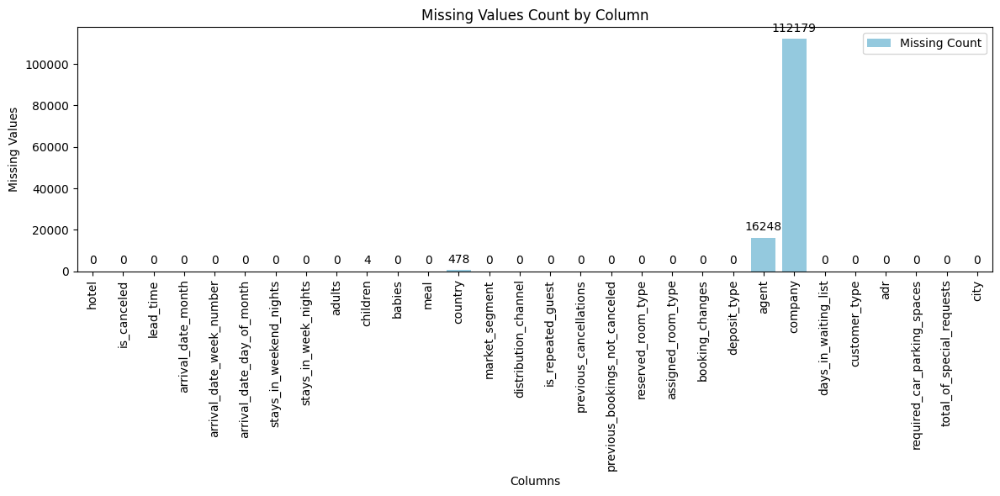

In [ ]:
def visualize_missing_values(df):
    # Calculate the count and percentage of missing values for each column
    missing_table = pd.DataFrame({
        'Missing Count': df.isnull().sum(),
        'Missing Percent': (df.isnull().sum() / len(df)) * 100
    }).round(2)

    # Set figure size for the plot
    plt.figure(figsize=(12, 6))

    # Create a bar plot for the count of missing values
    bar_plot = sns.barplot(x=missing_table.index, y='Missing Count', data=missing_table, color='skyblue', label='Missing Count')

    # Graph settings
    plt.title('Missing Values Count by Column')
    plt.xticks(rotation=90)  # Rotate column names to display them properly
    plt.xlabel('Columns')
    plt.ylabel('Missing Values')

    # Display the missing count on top of each bar plot (as numbers, not percentages)
    for i, p in enumerate(bar_plot.patches):
        height = p.get_height()
        count = missing_table['Missing Count'].iloc[i]
        # Display missing count at the top of each bar
        bar_plot.annotate(f'{count}',
                          (p.get_x() + p.get_width() / 2., height),
                          ha='center', va='center',
                          fontsize=10, color='black',
                          xytext=(0, 9), textcoords='offset points')

    # Show the plot
    plt.tight_layout()
    plt.show()

visualize_missing_values(df)

The next step is to examine the Missing Data Mechanisms to analyze whether the missing data follows any specific pattern or cause. The types of missing data are divided into three main categories: MCAR (Missing Completely At Random), MAR (Missing At Random), and MNAR (Missing Not At Random).

For this analysis, we can use tools from the missingno library to help visualize the data through Visual Exploratory Data Analysiซ

1. Matrix of Nullity: Used to visualize the distribution of missing data across the dataset.
2. Correlation Heatmap: Used to check the correlation between variables and determine if there’s a relationship between missing data and other variables.

However, observing raw data manually may not reveal abnormalities since the missing data might be scattered (unsorted). Therefore, we need to apply sorting techniques to assist in the analysis. For example, we can try sorting the data based on a specific variable and then observe the Nullity Matrix again. If the missing data begins to cluster meaningfully, this indicates a possible MAR relationship.

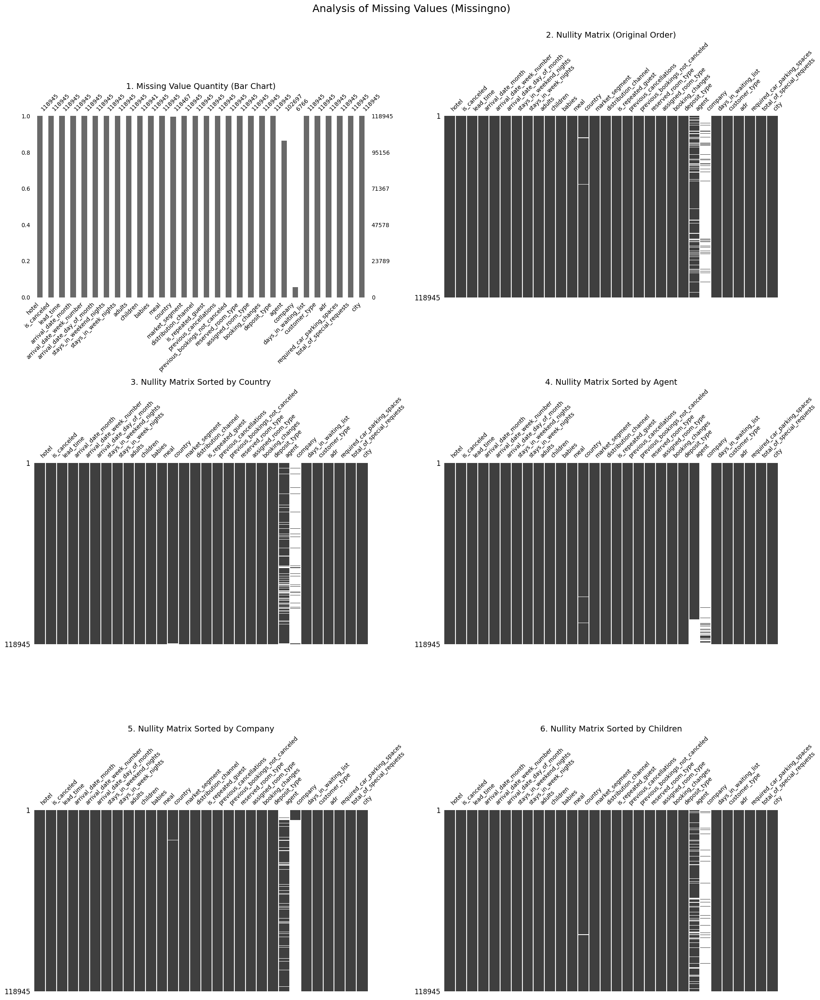

In [ ]:
# import misssingno package for visaul ช่วยแสดงปริมาณและความสัมพันธ์ของข้อมูลที่หายไปในรูปแบบของ barchart และ matrix
import missingno as msno

# Sort Feature
sorted1 = df.sort_values('country', ascending=True)
sorted2 = df.sort_values('agent', ascending=True)
sorted3 = df.sort_values('company', ascending=True)
sorted4 = df.sort_values('children', ascending=True)

# Create Graph
fig, axes = plt.subplots(3, 2, figsize=(20, 24))
axes = axes.flatten()

# --- Plot 1: Bar Chart (แสดงปริมาณ Missing Value) ---
msno.bar(df, ax=axes[0], fontsize=10)
axes[0].set_title('1. Missing Value Quantity (Bar Chart)', fontsize=14)

# --- Plot 2: Original Data Matrix ---
msno.matrix(df, ax=axes[1], sparkline=False, fontsize=10)
axes[1].set_title('2. Nullity Matrix (Original Order)', fontsize=14)

# --- Plot 3-6: Sorted Matrices ---
# Plot 3: Sort by Country
msno.matrix(sorted1, ax=axes[2], sparkline=False, fontsize=10)
axes[2].set_title('3. Nullity Matrix Sorted by Country', fontsize=14)

# Plot 4: Sort by Agent
msno.matrix(sorted2, ax=axes[3], sparkline=False, fontsize=10)
axes[3].set_title('4. Nullity Matrix Sorted by Agent', fontsize=14)

# Plot 5: Sort by Company
msno.matrix(sorted3, ax=axes[4], sparkline=False, fontsize=10)
axes[4].set_title('5. Nullity Matrix Sorted by Company', fontsize=14)

# Plot 6: Sort by Children (Index 5)
msno.matrix(sorted4, ax=axes[5], sparkline=False, fontsize=10)
axes[5].set_title('6. Nullity Matrix Sorted by Children', fontsize=14)

# Adjust layout
plt.suptitle('Analysis of Missing Values (Missingno)', fontsize=18, y=1.005)
plt.tight_layout()
plt.show()

<Axes: >

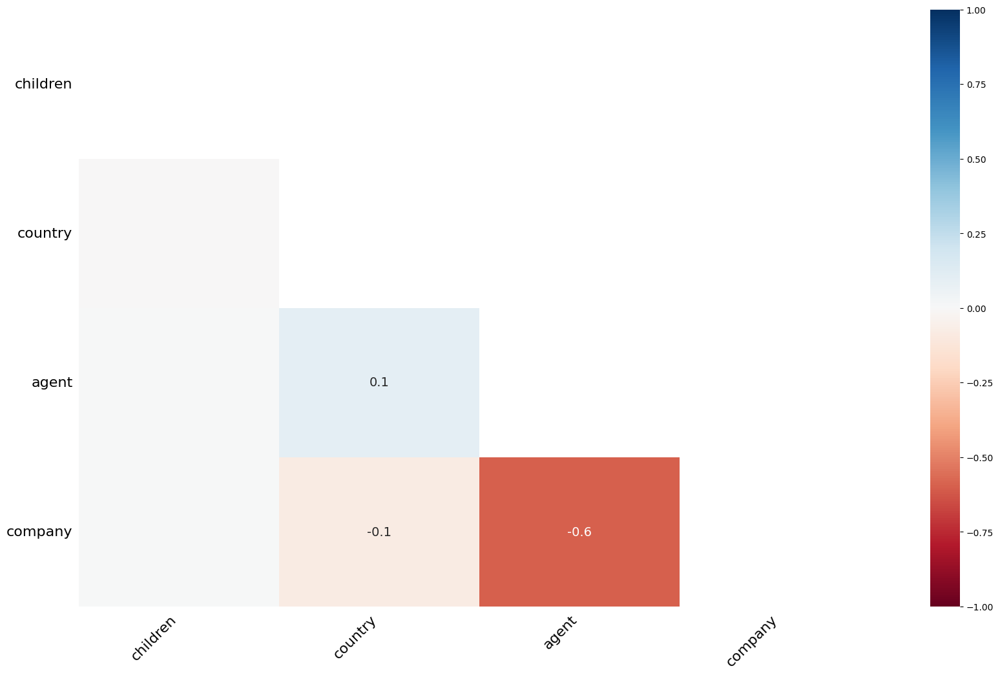

In [ ]:
msno.heatmap(df)

From the matrix and heatmap graphs, when analyzing and grouping the data based on the severity of missing values, we can clearly see the overall picture and how to handle the data as follows:

1. Group 1 Major Missing Variables: Variables in this group have a high amount of missing data, making the white area clearly visible, and they have significant business implications.
- agent (Tour company ID)
  - Status: Data is missing extensively (wide white area).
  - Cause: Missing data is MAR (Missing At Random), which is inversely correlated with company (Correlation -0.6).
      - Heatmap: Correlation = -0.6 indicates a "mutually exclusive" relationship. When agent is present, company tends to be absent.
      - Matrix: When sorted, the presence of agent data fills the gaps left by company, confirming they alternate.
  - Analysis: The data isn't lost; it signifies that the customer did not book through an agent (likely a direct booking or corporate booking).
  - **How to Handle:** Create New Category. Replace the NaN values with 0 (to indicate whether the booking was made directly or through an agency).

- company (Client company ID)
  - Status: Data is missing the most (almost entirely white area).
  - Cause: Missing data is also MAR (Missing At Random) because most customers did not come from a company.
      - Matrix: The sparse black lines (data present) mostly appear in rows where agent is white (missing), reinforcing the inverse relationship observed in the Heatmap.
  - Analysis: Similar to agent, a missing value here simply means the customer is 'Private' or 'Non-Corporate'.
  - **How to Handle:** Create New Category. Replace the NaN values with 0 (to indicate private customers).

2. Group 2: Minor Missing Variables: In this group, only a small amount of data is missing, and the white areas are minimal or barely visible.
  - country
    - Status: Data is missing slightly (a thin white line in the matrix).
    - Cause: Data is missing MCAR (Missing Completely At Random) or could be due to input errors.
        - Matrix: The missing lines are scattered randomly without forming a distinct block or pattern.
        - Heatmap: The correlation with other variables is very low (= 0). This proves the missingness is independent of agent, company or children status.
    - **How to Handle:** Create a new category by replacing the NaN values with 'UNK' (Unknown), since imputing with the mode may introduce bias toward the most frequent country.
  - children
    - Status: Data is missing slightly (a thin white line in the matrix).
    - Cause: Data is missing MCAR (Missing Completely At Random) or could be due to input errors.
        - Matrix: The missing lines are scattered randomly without forming a distinct block or pattern.
        - Heatmap: The correlation with other variables is very low (= 0). This proves the missingness is independent of agent, company or country status.
    - **How to Handle:** Drop the rows, as there are only four rows with missing values, which is a very small amount. Since these missing values are not related to other features, removing them is a simple and non-disruptive approach that does not affect the overall dataset.

In [ ]:
# สำหรับ Agent ID (ใช้ 0 แทน Unknown/Missing Agent)
df['agent'] = df['agent'].fillna(0)

# สำหรับ Company ID (ใช้ 0 แทน Unknown/Private Company)
df['company'] = df['company'].fillna(0)

# สำหรับ country (ใช้ UNK แทน Unknown/Missing Country)
df['country'] = df['country'].fillna('UNK')

# สำหรับ children (ตัดแถวที่มี missing value ออก)
df = df.dropna(subset=['children'])

Check again to confirm that there are no variables with missing values.

In [ ]:
# Recheck if there are any missing values left
df.isnull().sum()

,0
hotel,0
is_canceled,0
lead_time,0
arrival_date_month,0
arrival_date_week_number,0
arrival_date_day_of_month,0
stays_in_weekend_nights,0
stays_in_week_nights,0
adults,0
children,0


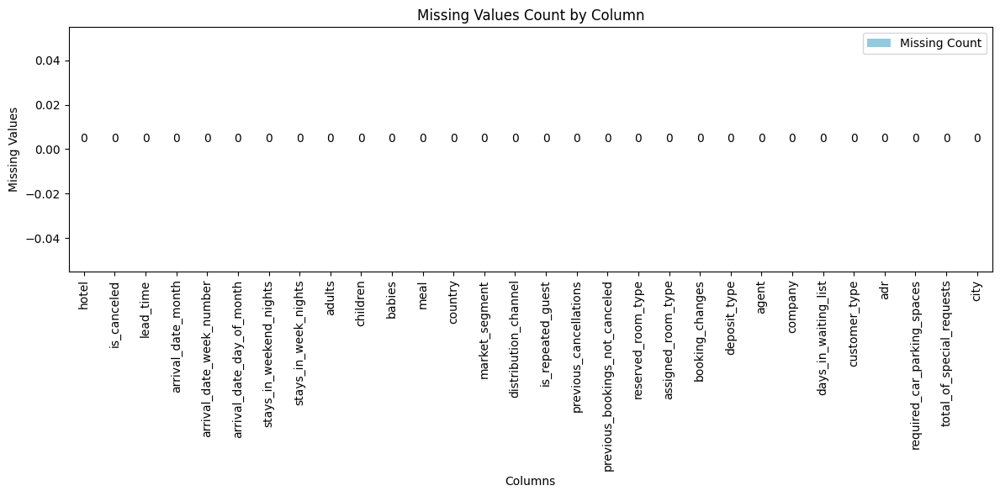

In [ ]:
# Visulize with Bar Plot for check again
visualize_missing_values(df)

After checking the dataset size, there are 118,941 samples and 30 columns (29 features and 1 target) remaining, compared to 118,945 samples and 30 columns (29 features and 1 target) before performing the missing values treatment.

In [ ]:
# Check the number of row
df.shape

(118941, 30)

## **Summary after treatment by Outlier and Missing value**

After performing outlier treatment, the distributions were checked again to assess the effects of this processes.

== Category Variables ==
Before: Categorical Bar Charts


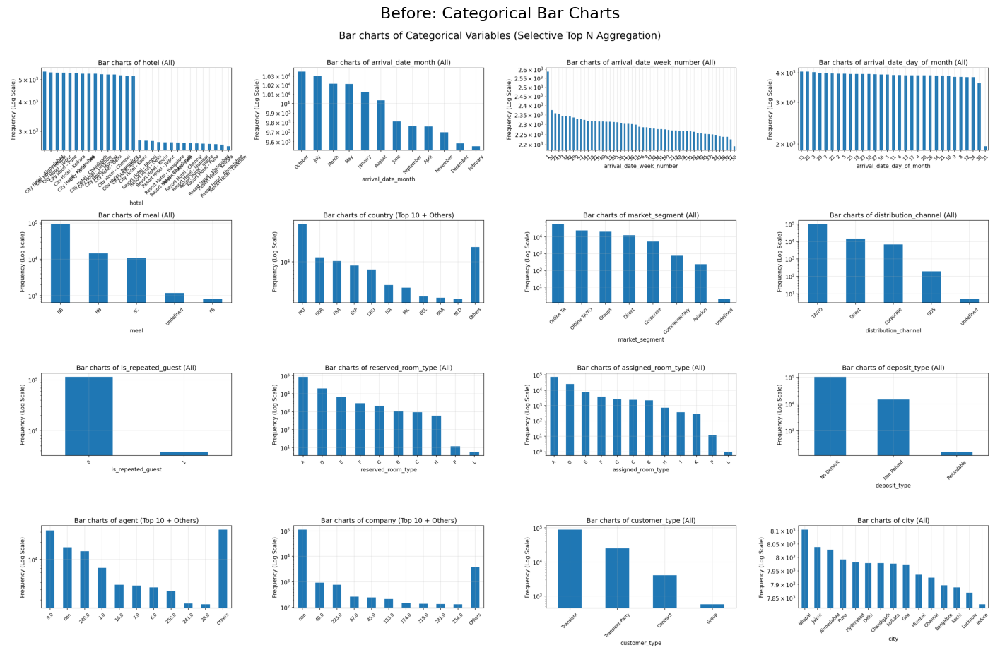

After:  Categorical Bar Charts


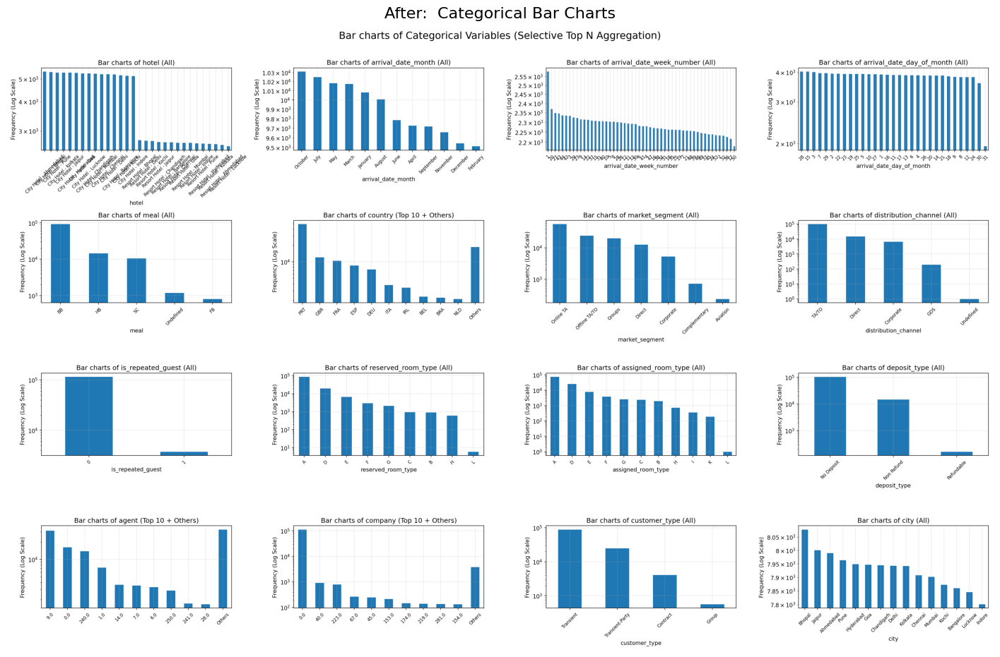


== Continuous Variables — Histograms ==
Before: Continuous Histograms


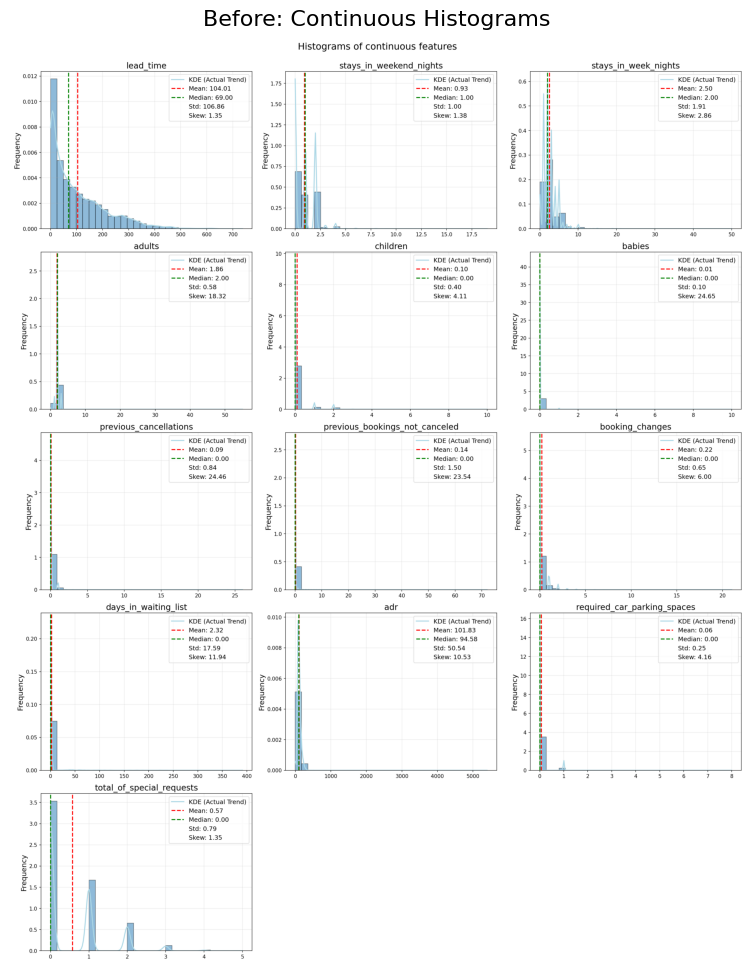

After:  Continuous Histograms


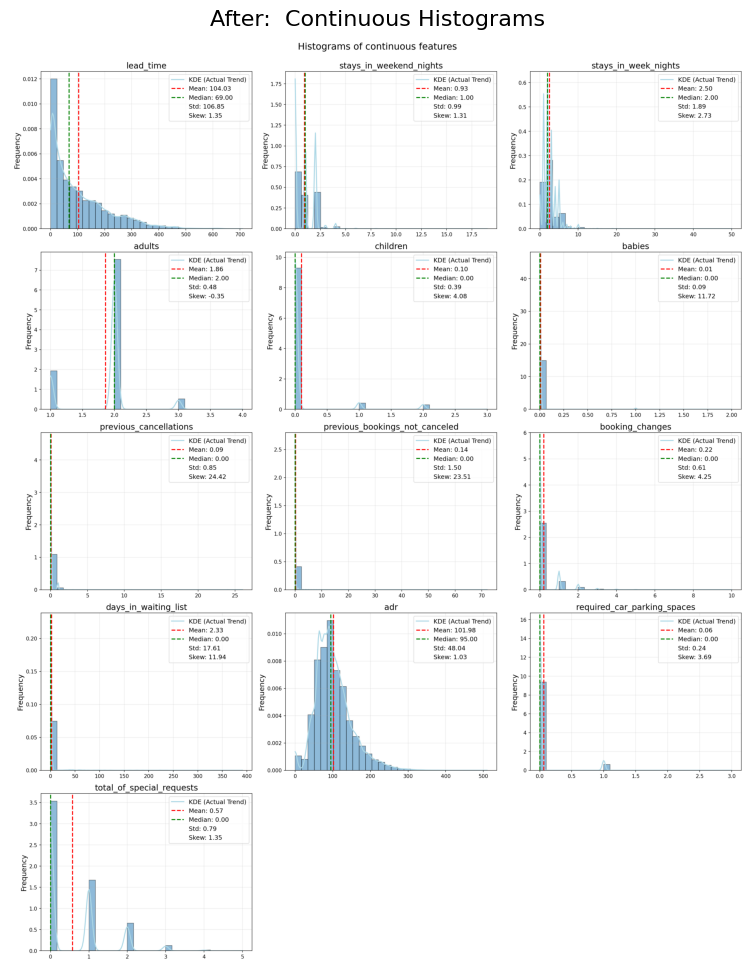


== Continuous Variables — Boxplots ==
Before: Boxplots


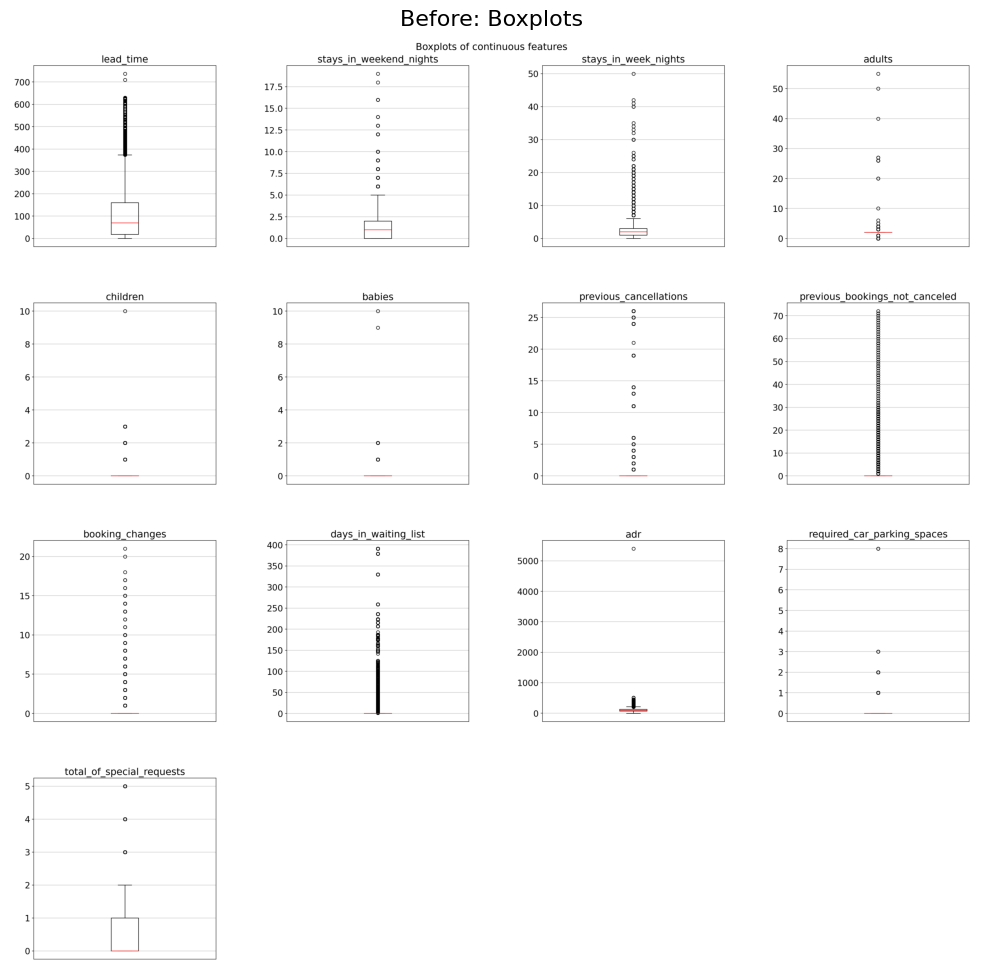

After:  Boxplots


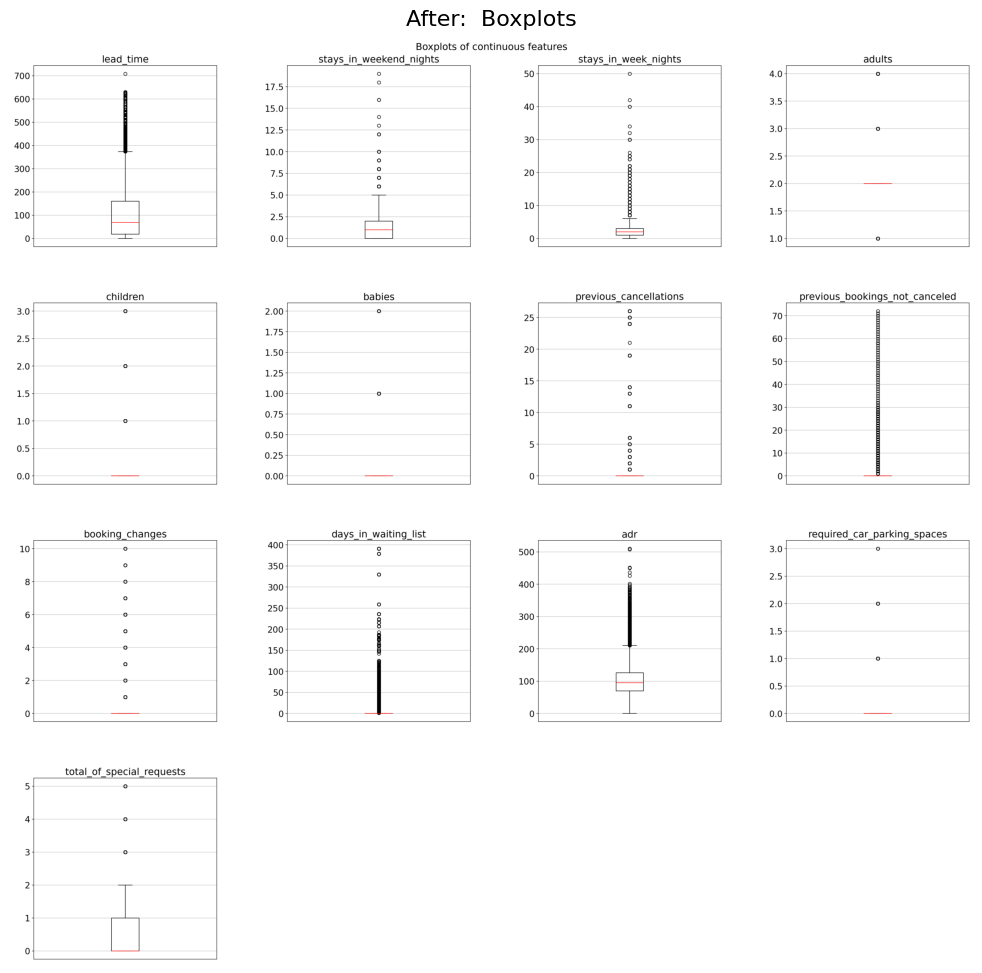

In [ ]:
# ==== Columns ====
cat_cols = ['hotel', 'arrival_date_month', 'arrival_date_week_number','arrival_date_day_of_month',
            'meal', 'country', 'market_segment', 'distribution_channel','is_repeated_guest',
            'reserved_room_type', 'assigned_room_type', 'deposit_type','agent', 'company', 'customer_type', 'city']

continuous_cols= ['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies',
                  'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes',
                  'days_in_waiting_list', 'adr', 'required_car_parking_spaces', 'total_of_special_requests']

from io import BytesIO
from contextlib import contextmanager

# ==== Helper: ปิดการแสดงผลระหว่างสร้างภาพ ====
@contextmanager
def suppress_mpl_display():
    prev_show = plt.show
    def _nop(*a, **k):
        pass
    plt.show = _nop
    try:
        with plt.ioff():
            yield
    finally:plt.show = prev_show

# ==== Helper: แปลง Figure -> ndarray (RGB) ====
def fig_to_img(fig=None, dpi=150, close=False, fallback_current=True):
    if fig is None and fallback_current:
        fig = plt.gcf()
    buf = BytesIO()
    fig.savefig(buf, format="png", dpi=dpi, bbox_inches="tight")
    if close:plt.close(fig)
    buf.seek(0)
    return np.array(Image.open(buf).convert("RGB"))

# ==== Helper: เรียกฟังก์ชันพล็อต -> ได้ img ไม่ว่าฟังก์ชันจะ return fig หรือไม่ ====
def run_plot_to_img(plot_callable, dpi=150):
    with plt.ioff():
        before = set(plt.get_fignums())
        maybe_fig = plot_callable()   # อาจคืน fig หรือ None
        after = set(plt.get_fignums())
        new_nums = sorted(after - before)
        if maybe_fig is not None: fig = maybe_fig
        elif new_nums: fig = plt.figure(new_nums[-1])
        else: fig = plt.gcf()
        return fig_to_img(fig, dpi=dpi, close=True, fallback_current=True)

# ==== Helper: แสดงภาพพร้อมหัวข้อ (ข้ามถ้า None) ====
def _to_ndarray(img):
    if img is None: return None
    if isinstance(img, Image.Image): return np.array(img.convert("RGB"))
    return img

def show_one_with_title(title, img, figsize=(18, 12)):
    print(f"{title}")
    plt.figure(figsize=figsize)
    plt.imshow(_to_ndarray(img))
    plt.title(title, fontsize=16, pad=10)
    plt.axis('off')
    plt.show()

# ==== สร้างภาพ After ทั้งหมด  ====
with suppress_mpl_display():
    AfterCat_img    = run_plot_to_img(lambda: PlotBarCharts_SelectiveTopN(inpData=df, colsToPlot=cat_cols, ncols=4, figsize=(20, 18)), dpi=150)
    AfterConHis_img = run_plot_to_img(lambda: PlotHistChart(continuous_cols, ncols=3), dpi=150)
    AfterConBox_img = run_plot_to_img(lambda: plot_multiple_boxplots(df, continuous_cols, ncols=4), dpi=150)

# ==== รูป Before จาก environment ====
BeforeCat_img    = BeforeCat_img    if 'BeforeCat_img'    in globals() else None
BeforeConHis_img = BeforeConHis_img if 'BeforeConHis_img' in globals() else None
BeforeConBox_img = BeforeConBox_img if 'BeforeConBox_img' in globals() else None

# ==== แสดงผลตามลำดับที่กำหนด พร้อมชื่อ ====
print("== Category Variables ==")
show_one_with_title("Before: Categorical Bar Charts", BeforeCat_img)
show_one_with_title("After:  Categorical Bar Charts",  AfterCat_img)

print("\n== Continuous Variables — Histograms ==")
show_one_with_title("Before: Continuous Histograms", BeforeConHis_img)
show_one_with_title("After:  Continuous Histograms",  AfterConHis_img)

print("\n== Continuous Variables — Boxplots ==")
show_one_with_title("Before: Boxplots", BeforeConBox_img)
show_one_with_title("After:  Boxplots",  AfterConBox_img)

- Distribution of Categorical Variables after Missing Value Treatment:
  - The categorical distributions remain the same as before the treatment.
  - No classes were lost, and no significant changes in proportions were observed.
  - The missing value treatment did not affect class balance.
  
  In summary, the missing value treatment for categorical variables did not introduce any bias or distortion to the original data structure.

- Distribution of Continuous Variables after Outlier and Missing Value Treatment:
  - Outliers were noticeably reduced without destroying the original data patterns.
  - The distribution shapes tend to move closer to a normal distribution.
  - The mean and standard deviation indicate reduced skewness.

  In summary, the outlier treatment and missing value handling helped the continuous variables align more closely with a normal distribution and reduced the impact of outliers.

# **8. Cardinality Reduction (Aggregation)**

Because the 'country', 'agent', and 'company' features have high cardinality (a large number of unique values) and contain many rare categories, aggregation is a necessary preprocessing step.

The main objectives of performing aggregation are:
- **Dimensionality Reduction:** To prevent the creation of hundreds or even thousands of features from one-hot encoding, which would slow down model training and consume unnecessary computational resources.
- **Reducing the Risk of Overfitting:** Grouping rare categories into an “Others” class helps prevent the model from memorizing patterns that appear only once or twice. This improves the model’s ability to generalize when encountering unseen data in the test set.

In [ ]:
HIGH_CARDINALITY_COLS = ['country', 'agent', 'company']
TOP_N_COUNT = 10

def aggregate_rare_categories(series, top_n):
    # ค้นหา Top N ที่มีความถี่สูงสุด และแทนที่ค่าที่เหลือด้วย 'Others'
    # 1. คำนวณความถี่และเลือก Top N
    top_values = series.value_counts().head(top_n).index.tolist()

    # 2. ทำการ Map: หากอยู่ใน Top N ให้คงไว้ หากไม่ให้เป็น 'Others'
    series_aggregated = series.apply(lambda x: x if x in top_values else 'Others')

    return series_aggregated

# ก่อน Aggregation
print("Unique Counts ก่อน Aggregation:")
print(df[HIGH_CARDINALITY_COLS].nunique())

for col in HIGH_CARDINALITY_COLS:
    df[col] = aggregate_rare_categories(df[col], TOP_N_COUNT)

# หลัง Aggregation (ยืนยันว่าเหลือแค่ 11 unique values: Top 10 + Others)
print("\nUnique Counts หลัง Aggregation:")
print(df[HIGH_CARDINALITY_COLS].nunique())

Unique Counts ก่อน Aggregation:
country    178
agent      334
company    349
dtype: int64

Unique Counts หลัง Aggregation:
country    11
agent      11
company    11
dtype: int64


# **9. Split data for Train (80%) & Test (20%)**

In [ ]:
# Split the data into training and testing set
y = df['is_canceled']
X = df.drop(columns=['is_canceled'])

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)  # stratify >> รักษาสัดส่วน class ให้เท่ากัน

In [ ]:
# Sanity check for the sampled data
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(95152, 29)
(95152,)
(23789, 29)
(23789,)


Check if the training and test datasets have the same target class distribution (y) after the split to ensure class balance.

Train Count: [59879 35273]
Test Count: [14971  8818]
Train Ratio: [0.62929839 0.37070161]
Test Ratio: [0.62932448 0.37067552]


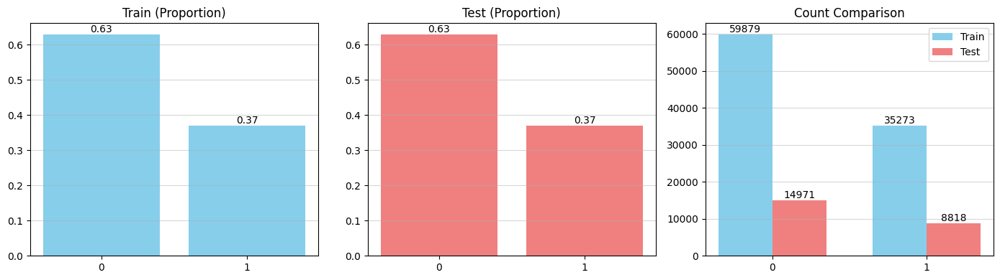

In [ ]:
# Print
print("Train Count:", y_train.value_counts().sort_index().values)
print("Test Count:", y_test.value_counts().sort_index().values)
print("Train Ratio:", y_train.value_counts(normalize=True).sort_index().values)
print("Test Ratio:", y_test.value_counts(normalize=True).sort_index().values)

# Prepare data
train_prop = y_train.value_counts(normalize=True).sort_index()
test_prop = y_test.value_counts(normalize=True).sort_index()
train_count = y_train.value_counts().sort_index()
test_count = y_test.value_counts().sort_index()
x = [0, 1]
width = 0.35

# Plot
fig, axes = plt.subplots(1, 3, figsize=(14, 4))

# Train - Proportion
axes[0].bar(train_prop.index, train_prop.values, color=['skyblue'])
axes[0].set_title('Train (Proportion)')
axes[0].set_xticks(train_prop.index)
axes[0].grid(True, axis='y', alpha=0.5)
for idx, val in train_prop.items():
    axes[0].text(idx, val, f'{val:.2f}', ha='center', va='bottom')

# Test - Proportion
axes[1].bar(test_prop.index, test_prop.values, color=['lightcoral'])
axes[1].set_title('Test (Proportion)')
axes[1].set_xticks(test_prop.index)
axes[1].grid(True, axis='y', alpha=0.5)
for idx, val in test_prop.items():
    axes[1].text(idx, val, f'{val:.2f}', ha='center', va='bottom')

# Compare - Count
axes[2].bar([i - width/2 for i in x], train_count.values, width, label='Train', color='skyblue')
axes[2].bar([i + width/2 for i in x], test_count.values, width, label='Test', color='lightcoral')
axes[2].set_title('Count Comparison')
axes[2].legend()
axes[2].set_xticks(x)
axes[2].grid(True, axis='y', alpha=0.5)
for i, v in enumerate(train_count.values):
    axes[2].text(x[i] - width/2, v, f'{v}', ha='center', va='bottom')
for i, v in enumerate(test_count.values):
    axes[2].text(x[i] + width/2, v, f'{v}', ha='center', va='bottom')

plt.tight_layout()
plt.show()

# **10. Feature Selection by Visual and Statistical Measurement**

**Objective:** To identify and select features that have a statistically significant relationship with the target variable through visual exploration and statistical feature selection.

## **10.1 Relationship exploration: Categorical vs Categorical**




### **10.1.1 Visual exploration**

**Objective:** To conduct an initial analysis to identify which categorical features are related to the target variable using bar plots and stacked bar chart for feature selection.

Since both the target and the predictor variables are categorical, bar plots were chosen to explore their relationships. These plots illustrate the category-pair distribution, allowing us to observe differences in proportions across groups and identify features that are likely to influence the target.

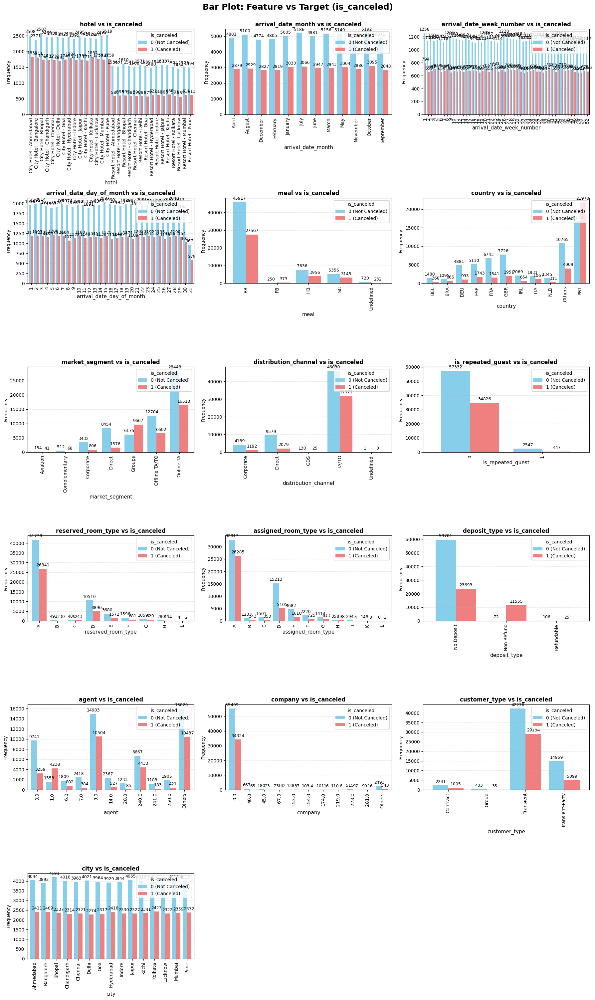

In [ ]:
CategoricalCols = ['hotel', 'arrival_date_month', 'arrival_date_week_number','arrival_date_day_of_month',
                  'meal', 'country', 'market_segment', 'distribution_channel','is_repeated_guest',
                  'reserved_room_type', 'assigned_room_type', 'deposit_type','agent', 'company', 'customer_type', 'city']
Target = 'is_canceled'

data_train = pd.concat([X_train, y_train], axis=1)

valid_cols = []
for col in CategoricalCols:
    ct = pd.crosstab(data_train[col], data_train[Target])
    if ct.shape[0] >= 2 and ct.shape[1] >= 2:
        valid_cols.append(col)

n_cols = len(valid_cols)
n_rows = (n_cols + 2) // 3
fig, axes = plt.subplots(n_rows, 3, figsize=(18, 5*n_rows))
axes = axes.flatten()

for idx, col in enumerate(valid_cols):
    ct = pd.crosstab(data_train[col], data_train[Target])

    ct.plot(kind='bar', stacked=False, ax=axes[idx],
            color=['skyblue', 'lightcoral'], width=0.8)

    axes[idx].set_xlabel(col, fontsize=11)
    axes[idx].set_title(f'{col} vs {Target}', fontsize=12, fontweight='bold')
    axes[idx].legend( title=f"{Target}", labels=['0 (Not Canceled)', '1 (Canceled)'], loc='upper right')
    axes[idx].tick_params(axis='x', rotation=90)
    axes[idx].set_ylabel('Frequency')
    axes[idx].grid(axis='y', alpha=0.3, linestyle='--')

    for container in axes[idx].containers:
        axes[idx].bar_label(container, fmt='%d', padding=3, fontsize=9)

for idx in range(len(valid_cols), len(axes)):
    axes[idx].axis('off')

plt.suptitle('Bar Plot: Feature vs Target (is_canceled)', fontsize=18, fontweight='bold', y=1)
plt.tight_layout()
plt.show()

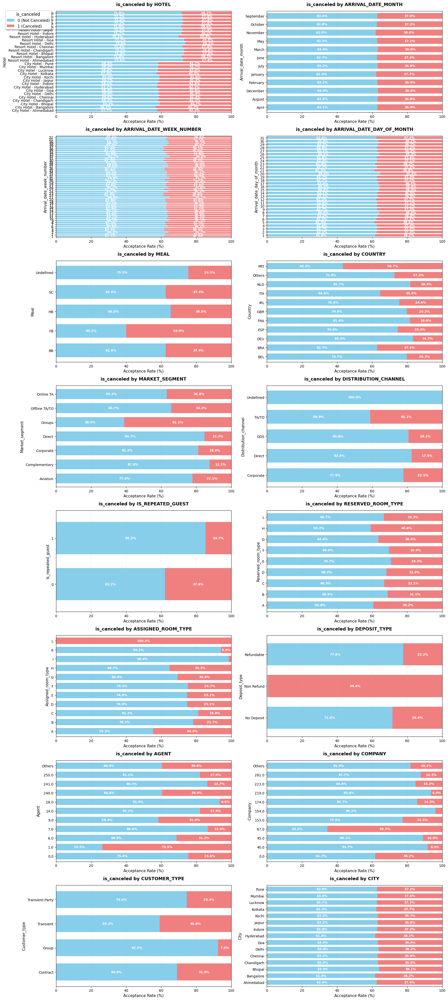

In [ ]:
# Stacked Bar Chart Function
TARGET_COLUMN = 'is_canceled'
feature_columns = ['hotel', 'arrival_date_month', 'arrival_date_week_number','arrival_date_day_of_month',
                  'meal', 'country', 'market_segment', 'distribution_channel','is_repeated_guest',
                  'reserved_room_type', 'assigned_room_type', 'deposit_type','agent', 'company', 'customer_type', 'city']

def create_stacked_bar_plots(dataframe, features, target):
    n_features = len(features)
    n_cols = 2
    n_rows = (n_features + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5 * n_rows))
    axes = axes.flatten() if n_features > 1 else [axes]

    for idx, feature in enumerate(features):
        ax = axes[idx]

        # % Calculation
        cross_tab = pd.crosstab(dataframe[feature], dataframe[target])
        df_percent = cross_tab.div(cross_tab.sum(axis=1), axis=0).mul(100).round(1)

        # Plot stacked bar chart
        df_percent.plot(
            kind='barh',
            stacked=True,
            ax=ax,
            color=['skyblue', 'lightcoral'],
            legend=False,
            width=0.7
        )

        ax.set_title(
            f'is_canceled by {feature.upper()}',
            fontsize=13,
            fontweight='bold',
            pad=15
        )
        ax.set_xlabel('Acceptance Rate (%)', fontsize=11)
        ax.set_ylabel(feature.capitalize(), fontsize=11)
        ax.set_xlim(0, 100)
        ax.grid(axis='x', alpha=0.3, linestyle='--')

        for container in ax.containers:
            labels = [f'{v:.1f}%' if v > 5 else '' for v in container.datavalues]
            ax.bar_label(
                container,
                labels=labels,
                label_type='center',
                fontsize=9,
                fontweight='bold',
                color='white'
            )

    for idx in range(n_features, len(axes)):
        axes[idx].axis('off')

    # Legend
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles,
        ['0 (Not Canceled)', '1 (Canceled)'],
        title='is_canceled',
        loc='upper left',
        bbox_to_anchor=(0.01, 0.99),
        fontsize=11,
        title_fontsize=12,
        frameon=True,
        shadow=True
    )

    plt.tight_layout(rect=[0, 0, 1, 1])
    plt.show()

# Calling function
create_stacked_bar_plots(df, feature_columns, TARGET_COLUMN)

#### **Bar Plot Interpretation**

**Interpretation**

**Selected Categorical Variables:**

- **hotel :** Selected. City Hotel has a much higher total number of bookings (including cancellations and non-cancellations) than Resort Hotel, and also exhibits a higher number of cancellations.
- **arrival_date_month :** Selected. The total number of bookings is fairly consistent across all months, and the cancellation rate remains stable within a narrow range of approximately 30–40% throughout the year. This suggests that the month of arrival is not a prominent factor in predicting cancellations. **(Doubt)**
- **arrival_date_week_number :** Selected. The total number of bookings is fairly consistent across all 53 weeks, and the cancellation rate remains stable within a narrow range of approximately 30–40% throughout the year. This suggests that the week of arrival is not a prominent factor in predicting cancellations. **(Doubt)**
- **arrival_date_day_of_month :** Selected. The total number of bookings is fairly uniform across all 31 days, and the cancellation rate is stable each day. This indicates that the day of arrival within a month is not a significant predictor of cancellations. **(Doubt)**
- **meal :** Selected. FB (Full Board) has the highest cancellation rate at 59.9%, followed by HB (Half Board) and BB (Bed & Breakfast), both at 37.4%.
- **country :** Selected. The country with the highest cancellation rate is PRT (Portugal) at 56.7%. Countries with low cancellation rates include DEU (Germany – 16.7%) and NLD (Netherlands – 18.3%).
- **market_segment :** Selected. Online TA has the highest total bookings, but Groups have a very high proportion of cancellations relative to total bookings (as observed in the stacked bar chart), making this feature highly impactful.
- **distribution_channel :** Selected. TA/TO has the highest total bookings and the highest number of cancellations, while Corporate and Direct channels have much lower cancellation numbers.
- **is_repeated_guest :** Selected. New customers (0) have a much higher number of bookings and cancellations than returning customers (1). This feature is very important, indicating that repeated guests are much less likely to cancel.
- **reserved_room_type :** Selected. Room Type A has the highest total bookings and cancellations, indicating that rooms reserved or allocated as Type A are at higher risk of cancellation than other types.
- **assigned_room_type :** Selected. Room Type A has the highest total bookings and cancellations, showing that assigned rooms of Type A have a higher risk of cancellation compared to other types.
- **deposit_type :** Selected. "No Deposit" has the highest total bookings and the highest number of non-cancellations, while "Non Refund" has fewer total bookings but nearly all bookings are canceled. This indicates a very strong relationship with the target.
- **agent :** Selected. Agent ID 0.0 (unknown agent) and agents with a high number of bookings contribute significantly to cancellations.
- **company :** Selected. Company ID 0.0 (unspecified company) has the highest total bookings and cancellations, while most other company IDs have very few cancellations.
- **customer_type :** Selected. Selected. Transient customers have the highest total bookings and cancellations, while Groups have the lowest numbers of bookings and cancellations.
- **city :** Selected. The cancellation rate is relatively stable across different cities, suggesting that city is not a prominent factor in predicting cancellations. **(Doubt)**

### **10.1.2 Statistical Feature Selection by Chi-square**

**Objective:** To select categorical features that have a statistical relationship with the target variable using the Chi-square test, with a significance threshold of 0.05.

| Variables with P-value < 0.05 | Variables with P-value ≥ 0.05 |
| ----------------------------- | ----------------------------- |
| มีความสัมพันธ์ต่อกัน | ไม่มีความสัมพันธ์ต่อกัน |

In [ ]:
# Chi-square Test: Feature ↔ Target
CategoricalCols = ['hotel', 'arrival_date_month', 'arrival_date_week_number','arrival_date_day_of_month',
                  'meal', 'country', 'market_segment', 'distribution_channel','is_repeated_guest',
                  'reserved_room_type', 'assigned_room_type', 'deposit_type','agent', 'company', 'customer_type', 'city']

from scipy.stats import chi2_contingency
rows = []
for col in CategoricalCols:
    ct = pd.crosstab(data_train[col], data_train[Target])
    if ct.shape[0] < 2 or ct.shape[1] < 2:
        continue
    chi2, p, dof, _ = chi2_contingency(ct)
    rows.append([col,p,
        'Yes/Associated with Target' if p < 0.05 else 'No/No clear association'])

chi_df = (
    pd.DataFrame(rows, columns=['Feature', 'p_value', 'Significant (p<0.05)'])
      .sort_values('p_value')
      .reset_index(drop=True)
)

print(chi_df.to_string(index=False))

                  Feature  p_value       Significant (p<0.05)
                    hotel   0.0000 Yes/Associated with Target
     distribution_channel   0.0000 Yes/Associated with Target
           market_segment   0.0000 Yes/Associated with Target
                  country   0.0000 Yes/Associated with Target
                    agent   0.0000 Yes/Associated with Target
            customer_type   0.0000 Yes/Associated with Target
       assigned_room_type   0.0000 Yes/Associated with Target
             deposit_type   0.0000 Yes/Associated with Target
                  company   0.0000 Yes/Associated with Target
        is_repeated_guest   0.0000 Yes/Associated with Target
       reserved_room_type   0.0000 Yes/Associated with Target
                     meal   0.0000 Yes/Associated with Target
                     city   0.1727    No/No clear association
arrival_date_day_of_month   0.6306    No/No clear association
       arrival_date_month   0.8545    No/No clear association
 arrival

#### **Chi-square Interpretation**

**Interpretation**

**Selected Categorical Variables:**

- **hotel :** Selected. Related to target (is_canceled). (p-value < 0.05)
- **meal :** Selected. Related to target (is_canceled). (p-value < 0.05)
- **country :** Selected. Related to target (is_canceled). (p-value < 0.05)
- **market_segment :** Selected. Related to target (is_canceled). (p-value < 0.05)
- **distribution_channel :** Selected. Related to target (is_canceled). (p-value < 0.05)
- **is_repeated_guest :** Selected. Related to target (is_canceled). (p-value < 0.05)
- **reserved_room_type :** Selected. Related to target (is_canceled). (p-value < 0.05)
- **assigned_room_type :** Selected. Related to target (is_canceled). (p-value < 0.05)
- **deposit_type :** Selected. Related to target (is_canceled). (p-value < 0.05)
- **agent :** Selected. Related to target (is_canceled). (p-value < 0.05)
- **company :** Selected. Related to target (is_canceled). (p-value < 0.05)
- **customer_type :** Selected. Related to target (is_canceled). (p-value < 0.05)

**Unselected Categorical Variables:**
- **arrival_date_month :** Unselected. Not related to target (is_canceled). (p-value > 0.05)
- **arrival_date_week_number :** Unselected. Not related to target (is_canceled). (p-value > 0.05)
- **arrival_date_day_of_month :** Unselected. Not related to target (is_canceled). (p-value > 0.05)
- **city :** Unselected. Not related to target (is_canceled). (p-value > 0.05)

### **10.1.3 Statistical Feature Selection by Mutual Information**

**Objective:** Used to quantify the strength of the relationship (predictive power), capturing both linear and non-linear dependencies. Features with MI scores approaching 0.0 are considered to provide minimal predictive information.

--- Mutual Information Scores (Categorical Features vs Target) ---
                      Feature  MI_Score
0                deposit_type    0.1314
1                     country    0.0618
2                       agent    0.0377
3              market_segment    0.0369
4          assigned_room_type    0.0216
5        distribution_channel    0.0172
6               customer_type    0.0100
7                       hotel    0.0098
8                     company    0.0073
9           is_repeated_guest    0.0040
10         reserved_room_type    0.0027
11                       meal    0.0013
12   arrival_date_week_number    0.0002
13  arrival_date_day_of_month    0.0001
14                       city    0.0001
15         arrival_date_month    0.0000


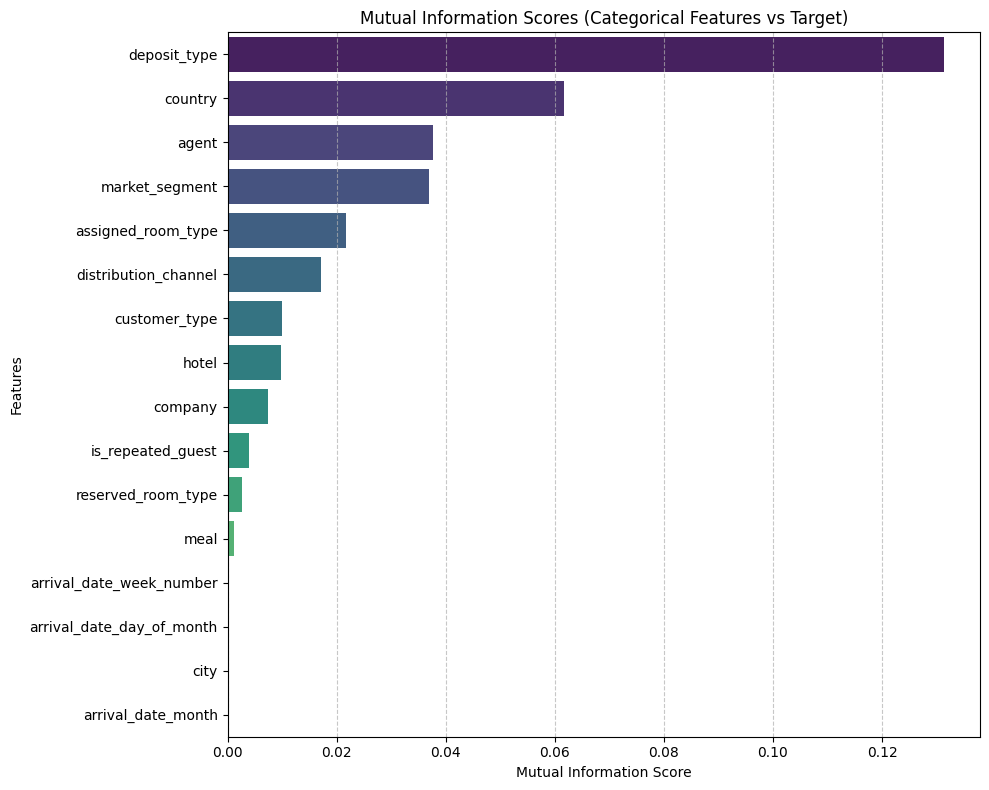

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import LabelEncoder

# Categorical Features
continuous_cols = ['hotel', 'arrival_date_month', 'arrival_date_week_number','arrival_date_day_of_month',
                  'meal', 'country', 'market_segment', 'distribution_channel','is_repeated_guest',
                  'reserved_room_type', 'assigned_room_type', 'deposit_type','agent', 'company', 'customer_type', 'city']

X = df[continuous_cols].copy()
y = df['is_canceled']

# การเข้ารหัสข้อมูล (Label Encoding for Categorical Features)
# ต้องแปลงค่าข้อความ/ตัวเลขที่เป็น Categorical ให้เป็นตัวเลข Ordinal
X_encoded = pd.DataFrame()
for col in X.columns:
    le = LabelEncoder()
    # ตรวจสอบ dtype ก่อนแปลง เพื่อป้องกันข้อผิดพลาด
    # ใช้ .astype(str) ในกรณีที่ข้อมูลเป็นตัวเลขแต่ต้องการเข้ารหัสเป็นกลุ่ม (เช่น Agent ID)
    X_encoded[col] = le.fit_transform(X[col].astype(str))


# การคำนวณ Mutual Information
# discrete_features=True: บอกฟังก์ชันให้จัดการกับ Input X เป็นตัวแปรเชิงกลุ่ม
# เพื่อให้การคำนวณ MI สำหรับ Categorical Features เป็นไปอย่างถูกต้อง
mi_scores = mutual_info_classif(X_encoded, y, discrete_features=True, random_state=42)

# สร้างตารางสรุปผล
mi_results = pd.DataFrame({
    'Feature': X.columns,
    'MI_Score': mi_scores
})

# เรียงลำดับจากมากไปน้อย
mi_results = mi_results.sort_values(by='MI_Score', ascending=False).reset_index(drop=True)

print("--- Mutual Information Scores (Categorical Features vs Target) ---")
print(mi_results)

plt.figure(figsize=(10, 8)) # เพิ่มขนาดตามจำนวน Features

sns.barplot(
    x='MI_Score',
    y='Feature',
    data=mi_results,
    palette='viridis',
    hue='Feature',
    legend=False
)

plt.title('Mutual Information Scores (Categorical Features vs Target)')
plt.xlabel('Mutual Information Score')
plt.ylabel('Features')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()

#### **Mutual Information Interpretation**

1. High Predictive Power (Recommended to Keep)

    These features demonstrate strong statistical association (p-value about 0) and provide the highest amount of predictive information (High MI Scores). These are the most critical variables for the model.
    
    | Rank (MI) | Feature         | MI Score   | Chi-square (p-value) | Decision |
    |-----------|------------------|------------|------------------------|----------|
    | 1         | deposit_type     | 0.131391   | 0.00×100               | Keep     |
    | 2         | country          | 0.061767   | 0.00×100               | Keep     |
    | 3         | agent            | 0.037671   | 0.00×100               | Keep     |
    | 4         | market_segment   | 0.036920   | 0.00×100               | Keep     |


    
2. Statistically Significant but Lower Predictive Power (Tentatively Keep)

    These features meet the statistical significance threshold but have MI scores below 0.01. While their individual predictive contribution is lower, their confirmed statistical association suggests they should be retained to avoid loss of potentially non-linear information.

    | Rank (MI) | Feature              | MI Score   | Chi-square (p-value) | Decision |
    |-----------|-----------------------|------------|------------------------|----------|
    | 5         | assigned_room_type    | 0.021631   | 0.00×100               | Keep     |
    | 6         | distribution_channel  | 0.017190   | 0.00×100               | Keep     |
    | 7         | customer_type         | 0.010030   | 0.00×100               | Keep     |
    | 8         | hotel                 | 0.009799   | 0.00×100               | Keep     |
    | 9         | company               | 0.007337   | 1.10×10−252            | Keep     |
    | 10        | is_repeated_guest     | 0.004018   | 4.53×10−143            | Keep     |
    | 11        | reserved_room_type    | 0.002727   | 1.11×10−100            | Keep     |
    | 12        | meal                  | 0.001270   | 9.18×10−54             | Keep     |

3. No Statistical Association (Recommended for Exclusion)

    These features failed the Chi-square test (p-value $> 0.05$) and registered MI scores close to zero (all below 0.0003). This dual confirmation strongly suggests that they provide negligible predictive value and introduce noise.

    | Rank (MI) | Feature                    | MI Score   | Chi-square (p-value) | Decision |
    |-----------|-----------------------------|------------|------------------------|----------|
    | 13        | arrival_date_week_number    | 0.000226   | 0.9107                 | Exclude  |
    | 14        | arrival_date_day_of_month   | 0.000135   | 0.6306                 | Exclude  |
    | 15        | city                        | 0.000079   | 0.1727                 | Exclude  |
    | 16        | arrival_date_month          | 0.000035   | 0.8545                 | Exclude  |

**Summary:** 'city', 'arrival_date_day_of_month', 'arrival_date_month', and 'arrival_date_week_number' will be removed

### **10.1.4 Multicollinearity Check among Categorical Features**

**Objective:** We will use Cramer's V to identify redundant categorical features that may contribute to multicollinearity.

**Key Purposes:**
1. Measuring Association Strength: Cramer's V is an effect size measure that scales the Chi-square statistic to a value between 0 and 1. This provides a clear, standardized measure of dependency, where:
    - V = 0 indicates no association (perfect independence).
    - V = 1 indicates a perfect association
2. Multicollinearity Detection: In the context of building a predictive model (e.g., Logistic Regression), Cramer's V is critical for detecting problematic multicollinearity among the categorical independent variables. By calculating the pairwise Cramer's V for all feature pairs, we can identify highly redundant features.

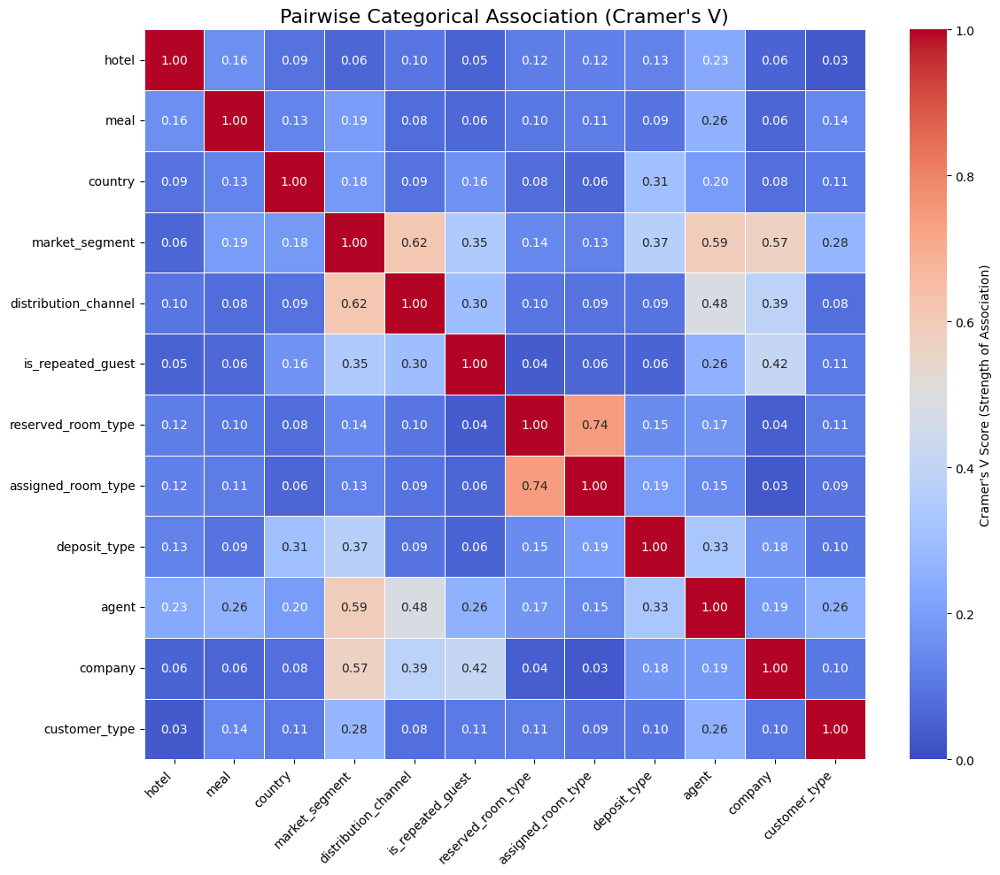

In [ ]:
# Pairwise Chi-square Test
import pandas as pd
import numpy as np
import itertools
from scipy.stats import chi2_contingency
import seaborn as sns
import matplotlib.pyplot as plt

cols = ['hotel', 'meal', 'country', 'market_segment', 'distribution_channel','is_repeated_guest',
        'reserved_room_type', 'assigned_room_type', 'deposit_type','agent', 'company', 'customer_type']

# --- ฟังก์ชันคำนวณ Cramer's V ---
def cramers_v(contingency_table):
    chi2 = chi2_contingency(contingency_table)[0]
    n = contingency_table.sum().sum()
    r, k = contingency_table.shape
    v = np.sqrt(chi2 / (n * min(k - 1, r - 1)))
    return v

# --- สร้าง Cramer's V Matrix ---
n = len(cols)
cramers_v_matrix = np.zeros((n, n))

for i, var1 in enumerate(cols):
    for j, var2 in enumerate(cols):
        if i == j:
            cramers_v_matrix[i, j] = 1.0 # ความสัมพันธ์กับตัวเองต้องเป็น 1
        elif i < j: # คำนวณเฉพาะครึ่งบนเพื่อประหยัดเวลา
            contingency_table = pd.crosstab(df[var1], df[var2])
            v_score = cramers_v(contingency_table)
            cramers_v_matrix[i, j] = v_score
            cramers_v_matrix[j, i] = v_score # สมมาตร

cramers_v_df = pd.DataFrame(cramers_v_matrix, index=cols, columns=cols)

# --- Heatmap: Cramer's V Scores ---

# กำหนดเกณฑ์: Cramer's V > 0.5 หรือ 0.6 บ่งชี้ Multicollinearity ที่รุนแรง
plt.figure(figsize=(12, 10))
sns.heatmap(cramers_v_df, annot=True, fmt='.2f', cmap='coolwarm',
            vmin=0, vmax=1.0, center=0.5, # Vmin/Vmax 0 ถึง 1.0
            cbar_kws={'label': "Cramer's V Score (Strength of Association)"}, linewidths=0.5)

plt.title("Pairwise Categorical Association (Cramer's V)", fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

#### **Summary of Multicollinearity Analysis (Cramer's V)**

Based on the Cramer's V heatmap, four pairs of categorical features show high levels of association. These relationships indicate potential multicollinearity, which may negatively affect model performance if not addressed. The key findings and decisions are summarized below.

1. High-Risk Pair: 'reserved_room_type' vs. 'assigned_room_type'

    **Cramer's V:** 0.74 (very high correlation)

    **Interpretation:**

    The room type that a guest reserves and the room type eventually assigned are highly correlated. In most cases, these two values are identical or very similar. Keeping both variables would introduce redundant information into the model.

    **Decision:** Remove 'reserved_room_type'

    **Justification:**
    - The two variables share 74% overlapping information.
    - MI comparison shows that 'assigned_room_type' (0.021) provides substantially more predictive information than 'reserved_room_type' (0.002).
    - Therefore, 'assigned_room_type' is retained as the more informative variable.

2. High-Correlation Pair: 'market_segment' vs. 'distribution_channel'

    **Cramer's V:** 0.62 (high correlation)

    **Interpretation:**

    Market segments often rely on specific distribution channels. For example, corporate bookings commonly use corporate channels, and TA/TO segments use travel agency channels. This creates substantial overlap between the two features.

    **Decision:** Remove 'distribution_channel'

    **Justification:**
    - Cramer's V exceeds the threshold of concern (>0.60).
    - MI Score of 'market_segment' (0.037) is more than twice that of 'distribution_channel' (0.017).
    - 'market_segment' provides broader and more informative behavioral insights.

3. Moderate-High Correlation Pair: 'market_segment' vs. 'agent'

    **Cramer's V:** 0.59 (moderately high)

    **Interpretation:**

    Certain agents consistently serve specific market segments. This naturally creates correlation between the two variables.

    **Decision:** Retain both features (with caution).

    **Justification:**
    - Although the correlation approaches the threshold, both features rank highly in MI (Rank 3 and 4).
    - The agent feature captures granular, agent-specific behavior that cannot be substituted by market_segment.
    - Both variables provide meaningful and complementary information.

4. Correlated Pair: 'company' vs. 'market_segment'

    **Cramer's V:** 0.57 (moderate-high correlation)

    **Interpretation:**

    Bookings under the Corporate segment typically include a valid company identifier. Bookings under Online TA, Direct, or similar segments usually do not include a company ID (often recorded as 0 or NULL). Thus, market_segment indirectly determines whether a company value exists, creating redundancy.

    **Decision:** Remove 'company'

    **Justification:**
    - Redundancy: Most of the information captured by company is already implied by market_segment.
    - Lower predictive value: MI Score of company is significantly lower.
    - High cardinality risk: Keeping company introduces unnecessary categorical complexity and increases risk of overfitting to company-specific IDs.

**Summary:** 'reserved_room_type', 'distribution_channel' and 'company' will be removed.

**Final selected Category columns from Feature Selection and Multicollinearity Check:** 'hotel', 'meal', 'country', 'market_segment', 'is_repeated_guest', 'assigned_room_type', 'deposit_type', 'agent', 'customer_type'


## **10.2 Relationship exploration: Categorical Vs Continuous**


### **10.2.1 Visual exploration**

**Objective:** To analyze the relationship between the categorical target and continuous features using boxplots. This visualization displays the distribution of continuous variables across each target class, including the median, interquartile range (IQR), and outliers. This approach highlights differences in medians between classes and allows for a preliminary assessment of which continuous features are most strongly associated with the target.

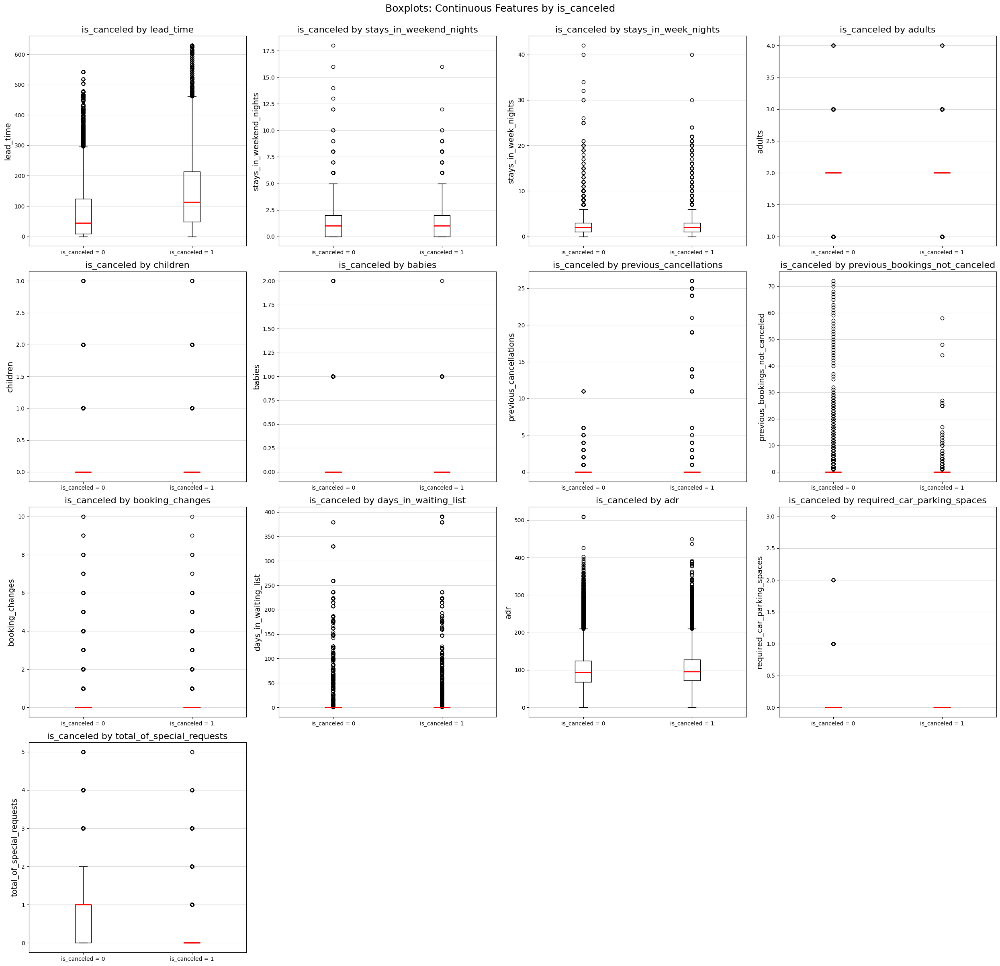

In [ ]:
# Box plots for Categorical Target Variable "is_canceled" and Continuous predictors
ContinuousCols = ['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies',
                  'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes',
                  'days_in_waiting_list', 'adr', 'required_car_parking_spaces', 'total_of_special_requests']
target_col = 'is_canceled'

# ตั้งค่ากราฟ
n = len(ContinuousCols)
ncols = 4
n_rows = int(np.ceil(n / ncols))

fig, axes = plt.subplots(n_rows, ncols, figsize=(25, 6*n_rows))
fig.suptitle(f'Boxplots: Continuous Features by {target_col}', fontsize=18, y=1)
axes = axes.flatten()

# วาด boxplot แต่ละตัว
for i, col in enumerate(ContinuousCols):
    group0 = data_train[data_train[target_col] == 0][col].dropna()
    group1 = data_train[data_train[target_col] == 1][col].dropna()

    # วาด boxplot
    axes[i].boxplot([group0, group1],
                    tick_labels=['is_canceled = 0', 'is_canceled = 1'],
                    medianprops=dict(color='red', linewidth=2))
    axes[i].set_title(f'is_canceled by {col}', fontsize=16)
    axes[i].set_ylabel(col, fontsize=14)
    axes[i].grid(axis='y', alpha=0.5)

for i in range(n, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

####**Box Plots interpretation**

**Interpretation**

**Selected Continuous Variables:**

- **lead_time :** Selected. The median for canceled bookings (1) is significantly higher than for non-canceled bookings (0), and the spread (IQR) is much wider. This indicates that bookings made far in advance are much more likely to be canceled.
- **stays_in_weekend_nights :** Selected (Weak). Very similar distributions with heavy overlap. Hard to distinguish based on median alone, though canceled bookings have slightly higher spread.
- **stays_in_week_nights :** Selected (Weak). The median for canceled bookings is slightly higher, suggesting longer stays might be slightly more prone to cancellation, but the overlap is significant.
- **adults :** Selected. Medians and IQRs are identical (centered at 2). The boxplot shows almost no difference between the two groups, suggesting low discriminative power in its raw form. **(Doubt)**
- **children :** Selected. Medians are identical at 0 with very similar outlier patterns. Does not visually separate the classes well. **(Doubt)**
- **babies :** Selected. Medians are identical at 0. The feature is too sparse to show a clear relationship in a boxplot. **(Doubt)**
- **previous_cancellations :** Selected. Although medians are 0, the canceled group (1) has many more high-value outliers compared to the non-canceled group. Past cancellations correlate with future cancellations.
- **previous_bookings_not_canceled :** Selected. The non-canceled group shows a long tail of outliers (history of staying), while the canceled group is compressed near 0. Loyal customers with past history rarely cancel.
- **booking_changes :** Selected. The non-canceled group shows more variance and outliers than the canceled group. Guests who modify their bookings (rather than ignoring them) are more likely to stay.
- **days_in_waiting_list :** Selected. Both distributions are dominated by 0 with some outliers in both. No clear visual distinction between the groups. **(Doubt)**
- **adr :** Selected. The median price for canceled bookings is slightly higher than for non-canceled ones. This suggests that higher-priced bookings carry a higher risk of cancellation.
- **required_car_parking_spaces :** Selected. While medians are both 0, the non-canceled group has distinct outliers (people requesting spots), whereas the canceled group has almost none. Requesting parking is a strong signal of intent to stay.
- **total_of_special_requests :** Selected. There is a clear separation in medians; non-canceled bookings (0) have a median of 1, while canceled bookings (1) have a median of 0. People who make requests are less likely to cancel (showing engagement).

### **10.2.2 Statistical Feature Selection By ANOVA**

**Objective:** To analyze the relationship between continuous features and the categorical target using Analysis of Variance (ANOVA). This method compares the means of continuous variables across different target classes to determine if there are statistically significant differences.

Hypotheses:
- $H_0$ (Null Hypothesis): There is no relationship between the two variables (the means of the continuous variable are equal across all target classes).
- $H_1$ (Alternative Hypothesis): There is a relationship between the two variables (the mean of the continuous variable in at least one target class differs from the others).

Based on these hypotheses, ANOVA utilizes the p-value to quantify the probability of the observed differences in means. This value serves as the basis for determining whether there is sufficient evidence to reject the Null Hypothesis ($H_0$), according to the criteria outlined in the following table.
| Condition |Interpretation |
| ----------------------------- | ----------------------------- |
| ANOVA p-value < 0.05 | Reject H₀: มีความแตกต่างอย่างมีนัยสำคัญทางสถิติ |
| ANOVA p-value ≥ 0.05 | Fail to Reject H₀: ยังไม่พบความแตกต่างอย่างมีนัยสำคัญทางสถิติ |

In [ ]:
def FunctionAnova(inpData, TargetVariable, ContinuousPredictorList, use_welch=True):
    from scipy.stats import f_oneway, ttest_ind

    classes = pd.Series(inpData[TargetVariable].dropna().unique()).tolist()
    c0, c1 = sorted(classes)

    SelectedPredictors = []
    print('##### ANOVA Results ##### \n')

    for predictor in ContinuousPredictorList:
        if predictor not in inpData.columns:
            print(f"{predictor} skipped (column not found)")
            continue

        # ดึงข้อมูลแต่ละกลุ่ม
        x0 = inpData.loc[inpData[TargetVariable] == c0, predictor].dropna().values
        x1 = inpData.loc[inpData[TargetVariable] == c1, predictor].dropna().values

        # ต้องมีข้อมูลอย่างน้อย 2 จุดต่อกลุ่ม
        if len(x0) < 2 or len(x1) < 2:
            print(f"{predictor} skipped (insufficient data: n0={len(x0)}, n1={len(x1)})")
            continue

        # เลือกสถิติ
        if use_welch:
            stat, pval = ttest_ind(x0, x1, equal_var=False)
        else:
            # ANOVA 2 กลุ่ม (เชิงนัยสำคัญเทียบเท่า t-test)
            stat, pval = f_oneway(x0, x1)

        if pval < 0.05:
            print(f"{predictor} is correlated with {TargetVariable} | P-Value: {pval}")
            SelectedPredictors.append(predictor)
        else:
            print(f"{predictor} is NOT correlated with {TargetVariable} | P-Value: {pval}")

    return SelectedPredictors

In [ ]:
# Calling the function to check which continuous variables are correlated with target
ContinuousCols = ['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies',
                  'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes',
                  'days_in_waiting_list', 'adr', 'required_car_parking_spaces', 'total_of_special_requests']

selected = FunctionAnova(data_train, 'is_canceled', ContinuousCols)
print(selected)

##### ANOVA Results ##### 

lead_time is correlated with is_canceled | P-Value: 0.0
stays_in_weekend_nights is NOT correlated with is_canceled | P-Value: 0.6917876030529095
stays_in_week_nights is correlated with is_canceled | P-Value: 2.4727443501223997e-17
adults is correlated with is_canceled | P-Value: 5.432659150743752e-88
children is NOT correlated with is_canceled | P-Value: 0.12817186424412125
babies is correlated with is_canceled | P-Value: 1.5015731761622709e-36
previous_cancellations is correlated with is_canceled | P-Value: 7.6825892853656e-156
previous_bookings_not_canceled is correlated with is_canceled | P-Value: 1.3031207172397784e-102
booking_changes is correlated with is_canceled | P-Value: 0.0
days_in_waiting_list is correlated with is_canceled | P-Value: 1.0259864905815102e-51
adr is correlated with is_canceled | P-Value: 1.3164341983914888e-46
required_car_parking_spaces is correlated with is_canceled | P-Value: 0.0
total_of_special_requests is correlated with is_c

####**ANOVA interpretation**

**Selected Continuous Variables:**

- **lead_time :** Selected. Correlated with is_canceled. (p-value < 0.05)
- **stays_in_week_nights :** Selected. Correlated with is_canceled. (p-value < 0.05)
- **adults :** Selected. Correlated with is_canceled. (p-value < 0.05)
- **babies :** Selected. Correlated with is_canceled. (p-value < 0.05)
- **previous_cancellations :** Selected. Correlated with is_canceled. (p-value < 0.05)
- **previous_bookings_not_canceled :** Selected. Correlated with is_canceled. (p-value < 0.05)
- **booking_changes :** Selected. Correlated with is_canceled. (p-value < 0.05)
- **days_in_waiting_list :** Selected. Correlated with is_canceled. (p-value < 0.05)
- **adr :** Selected. Correlated with is_canceled. (p-value < 0.05)
- **required_car_parking_spaces :** Selected. Correlated with is_canceled. (p-value < 0.05)
- **total_of_special_requests :** Selected. Correlated with is_canceled. (p-value < 0.05)

**Unselected Continuous Variables:**

- **stays_in_weekend_nights :** Unselected. Not correlated with is_canceled. (p-value ≥ 0.05)
- **children :** Unselected. Not correlated with is_canceled. (p-value ≥ 0.05)

### **10.2.3 Statistical Feature Selection By Mutual Information**

**Objective:** To quantify the mutual dependence between the continuous features and the categorical target by measuring the reduction in uncertainty (entropy) of the target variable given the knowledge of a feature.

This method was selected for its capability to detect non-linear relationships that linear methods often fail to capture. Since it utilizes k-nearest neighbor distances for continuous data, it provides a robust and model-agnostic metric for evaluating feature relevance without assuming a specific data distribution.

--- Mutual Information Scores ---
                           Feature  MI_Score
0                        lead_time    0.0835
1                              adr    0.0798
2           previous_cancellations    0.0434
3        total_of_special_requests    0.0401
4      required_car_parking_spaces    0.0313
5                  booking_changes    0.0192
6                           adults    0.0164
7             days_in_waiting_list    0.0148
8             stays_in_week_nights    0.0108
9   previous_bookings_not_canceled    0.0086
10         stays_in_weekend_nights    0.0038
11                          babies    0.0019
12                        children    0.0014


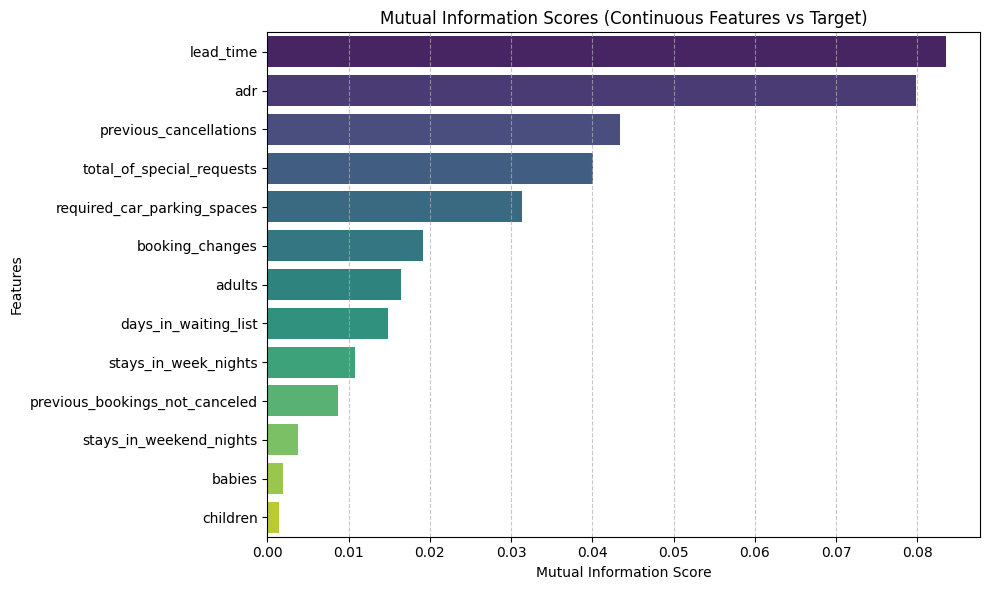

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import mutual_info_classif

continuous_cols = ['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies',
                  'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes',
                  'days_in_waiting_list', 'adr', 'required_car_parking_spaces', 'total_of_special_requests']

X = df[continuous_cols].copy()
y = df['is_canceled']

# คำนวณ Mutual Information
# discrete_features=False: บังคับให้มองว่าเป็น Continuous (ใช้ k-NN estimation)
# random_state: เพื่อให้ผลลัพธ์นิ่งเวลาลองรันใหม่
mi_scores = mutual_info_classif(X, y, discrete_features=False, random_state=42)

# สร้างตารางสรุปผล
mi_results = pd.DataFrame({
    'Feature': X.columns,
    'MI_Score': mi_scores
})

# เรียงลำดับจากมากไปน้อย
mi_results = mi_results.sort_values(by='MI_Score', ascending=False).reset_index(drop=True)

print("--- Mutual Information Scores ---")
print(mi_results)

plt.figure(figsize=(10, 6))

sns.barplot(
    x='MI_Score',
    y='Feature',
    data=mi_results,
    palette='viridis',
    hue='Feature',
    legend=False
)

plt.title('Mutual Information Scores (Continuous Features vs Target)')
plt.xlabel('Mutual Information Score')
plt.ylabel('Features')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()

####**Mutual Information interpretation**

**Selected Continuous Variables:**

High Predictive Power:
- **lead_time :** Exhibited the highest MI score. Boxplots confirm a strong distinction, where longer lead times correlate significantly with higher cancellation rates.
- **adr :** Ranked second in MI scoring. Visual analysis indicates that price sensitivity (higher ADR) is a key factor in cancellations.
- **previous_cancellations :** Despite being zero-inflated, outliers in this feature are highly indicative of cancellation risk.
- **total_of_special_requests, required_car_parking_spaces :** Both features show clear distributional differences; specifically, the presence of special requests or parking needs serves as a strong signal of booking commitment (non-cancellation).

Moderate Predictive Power:
- **booking_changes, adults, days_in_waiting_list, stays_in_week_nights, previous_bookings_not_canceled :** These features displayed moderate MI scores. While less dominant than the top predictors, they contribute valuable information regarding booking characteristics and guest history.

**Unselected Continuous Variables:**

- **children & babies :** Both features yielded the lowest MI scores. The data is heavily zero-inflated with insufficient variance to effectively distinguish between canceled and non-canceled bookings.
- **stays_in_weekend_nights :** Excluded due to a low MI score and significant distributional overlap between target classes in the boxplots, indicating it provides redundant or non-discriminative information compared to stays_in_week_nights.

**Summary :** 'stays_in_weekend_nights', 'children' and 'babies' will be removed.


### **10.2.4 Multicollinearity Analysis among Continuous Features**

**Objective:** To investigate multicollinearity among continuous variables, which can introduce redundancy into the model learning process.

Consequently, two complementary methods were selected: the Pearson Correlation Matrix and the Variance Inflation Factor (VIF). These techniques were chosen for their ability to effectively detect multicollinearity from distinct perspectives.

- Pearson Correlation Matrix
  - Purpose: To calculate the correlation coefficient ($r$) between pairs of variables in order to identify high linear correlations, which are primary indicators of data redundancy.
  - Reason for Selection: This method was selected for its ability to clearly visualize pairwise correlations. It enables the identification of variables with strong linear relationships, facilitating the initial screening of redundant features.

- Variance Inflation Factor (VIF)
  - Purpose: To assess the degree of feature redundancy by quantifying how much a variable's variance can be explained by other variables in the dataset.
  - Reason for Selection: This method was selected to evaluate redundancy in the context of multivariate correlation. It confirms the extent to which a variable is explained by a combination of others, providing a deeper and more comprehensive assessment of multicollinearity than pairwise comparisons alone.

**1. Pearson Correlation Matrix**

A correlation threshold was set at |r| > 0.8. Values exceeding this limit are considered highly correlated, which may lead to multicollinearity issues within the model.



In [ ]:
ContinuousCols=['lead_time', 'stays_in_week_nights', 'adults','previous_cancellations',
                'previous_bookings_not_canceled', 'booking_changes', 'days_in_waiting_list',
                'adr', 'required_car_parking_spaces', 'total_of_special_requests']

# Creating the correlation matrix
CorrelationData=data_train[ContinuousCols].corr()
CorrelationData

,lead_time,stays_in_week_nights,adults,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
lead_time,1.0000,0.1660,0.1268,0.0866,-0.0733,-0.0005,0.1692,-0.0692,-0.1162,-0.0958
stays_in_week_nights,0.1660,1.0000,0.1106,-0.0148,-0.0472,0.0769,-0.0025,0.0696,-0.0254,0.0666
adults,0.1268,0.1106,1.0000,-0.0087,-0.1314,-0.0492,-0.0101,0.2945,0.0169,0.1597
previous_cancellations,0.0866,-0.0148,-0.0087,1.0000,0.1520,-0.0282,0.0062,-0.0706,-0.0183,-0.0482
previous_bookings_not_canceled,-0.0733,-0.0472,-0.1314,0.1520,1.0000,0.0133,-0.0097,-0.0745,0.0452,0.0372
booking_changes,-0.0005,0.0769,-0.0492,-0.0282,0.0133,1.0000,-0.0128,0.0289,0.0672,0.0526
days_in_waiting_list,0.1692,-0.0025,-0.0101,0.0062,-0.0097,-0.0128,1.0000,-0.0424,-0.0326,-0.0835
adr,-0.0692,0.0696,0.2945,-0.0706,-0.0745,0.0289,-0.0424,1.0000,0.0597,0.1819
required_car_parking_spaces,-0.1162,-0.0254,0.0169,-0.0183,0.0452,0.0672,-0.0326,0.0597,1.0000,0.0847
total_of_special_requests,-0.0958,0.0666,0.1597,-0.0482,0.0372,0.0526,-0.0835,0.1819,0.0847,1.0000


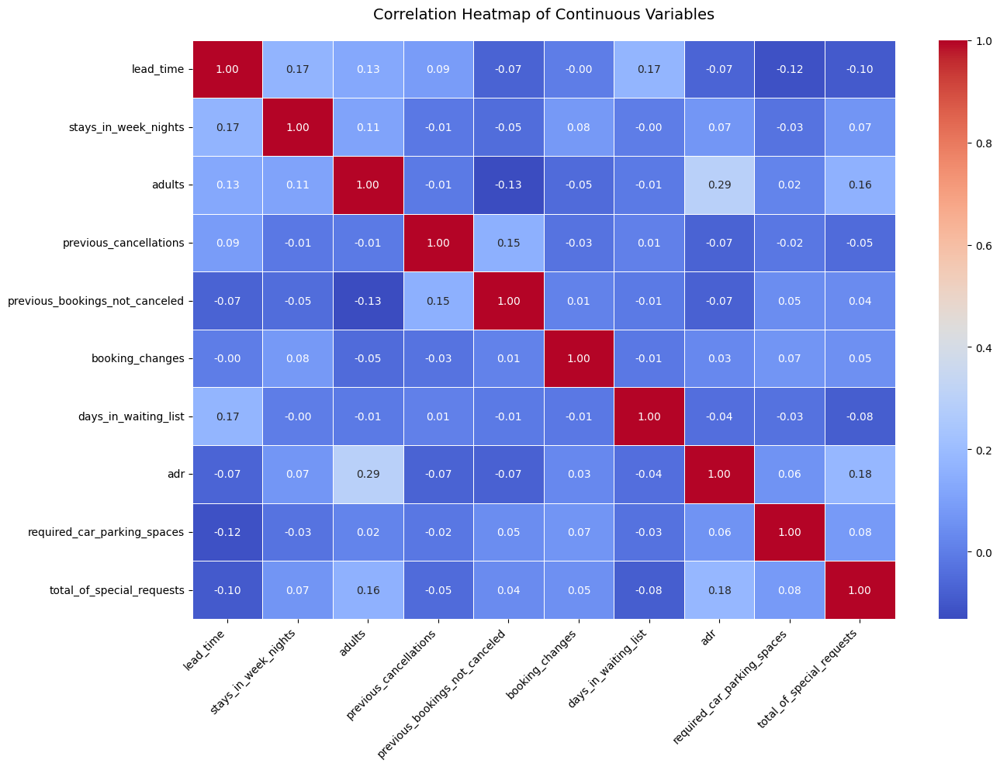

In [ ]:
# Heatmap correlation matrix
plt.figure(figsize=(14, 10))
sns.heatmap(CorrelationData,
            annot=True,
            cmap='coolwarm',
            fmt=".2f",
            linewidths=0.5)

plt.title('Correlation Heatmap of Continuous Variables', fontsize=14, pad=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

Analysis of the Pearson Correlation Matrix revealed no feature pairs with a correlation coefficient (|r|) greater than 0.5. Therefore, all features were retained.

**2. Variance Inflation Factor (VIF)**

The table below displays the VIF thresholds used to evaluate the levels of multicollinearity within the model.

| VIF value |	Interpretation |
|-----|----------------|
| VIF = 1 | No multicollinearity |
| 1 < VIF ≤ 5 | Low to moderate multicollinearity |
| 5 < VIF ≤ 10 | Moderate to high multicollinearity |
| VIF > 10 | Severe multicollinearity |

In [ ]:
# VIF
features = ['lead_time', 'stays_in_week_nights', 'adults','previous_cancellations',
            'previous_bookings_not_canceled', 'booking_changes', 'days_in_waiting_list',
            'adr', 'required_car_parking_spaces', 'total_of_special_requests']

from statsmodels.stats.outliers_influence import variance_inflation_factor

def vif_elim(df, cols, thr=10.0):
    keep = cols[:]
    removed = []
    while len(keep) > 1:
        X = df[keep].dropna()
        vifs = [variance_inflation_factor(X.values, i) for i in range(len(keep))]
        vif_df = pd.DataFrame({"Feature": keep, "VIF": vifs}).sort_values("VIF", ascending=False)
        vmax, fmax = vif_df.iloc[0]["VIF"], vif_df.iloc[0]["Feature"]

        # แสดงตารางของรอบนี้
        print("=== VIF (current) ===")
        print(vif_df.to_string(index=False, formatters={"VIF": "{:.3f}".format}))

        if vmax < thr:        # หยุดถ้าทุกตัวต่ำกว่าเกณฑ์
            break
        print(f">> remove: {fmax} (VIF={vmax:.3f})")
        keep.remove(fmax)
        removed.append(fmax)

    # ตารางรอบสุดท้าย
    Xf = df[keep].dropna()
    final_vif = [variance_inflation_factor(Xf.values, i) for i in range(len(keep))]
    final_df = pd.DataFrame({"Feature": keep, "VIF": final_vif}).sort_values("VIF", ascending=False)

    print("\n=== Final VIF ===")
    print(final_df.to_string(index=False, formatters={"VIF": "{:.3f}".format}))
    print("Keep:", keep)
    print("Removed:", removed)
    return keep, removed, final_df

keep, removed, vif_last = vif_elim(df, features, thr=10.0)

=== VIF (current) ===
                       Feature   VIF
                        adults 8.108
                           adr 5.912
          stays_in_week_nights 2.801
                     lead_time 2.163
     total_of_special_requests 1.638
               booking_changes 1.136
   required_car_parking_spaces 1.095
          days_in_waiting_list 1.053
        previous_cancellations 1.051
previous_bookings_not_canceled 1.039

=== Final VIF ===
                       Feature   VIF
                        adults 8.108
                           adr 5.912
          stays_in_week_nights 2.801
                     lead_time 2.163
     total_of_special_requests 1.638
               booking_changes 1.136
   required_car_parking_spaces 1.095
          days_in_waiting_list 1.053
        previous_cancellations 1.051
previous_bookings_not_canceled 1.039
Keep: ['lead_time', 'stays_in_week_nights', 'adults', 'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'days_in_wai

The stepwise VIF analysis resulted in no variables being removed, as all features possessed VIF values below the threshold of 10.

####**Correlation and VIF Analysis interpretation**

**Selected Continuous Variables:**

- **lead_time :** Selected.
- **stays_in_week_nights :** Selected.
- **adults :** Selected.
- **previous_cancellations :** Selected.
- **previous_bookings_not_canceled :** Selected.
- **booking_changes :** Selected.
- **days_in_waiting_list :** Selected.
- **adr :** Selected.
- **required_car_parking_spaces :** Selected.
- **total_of_special_requests :** Selected.

**Final selected Continuous columns from Feature Selection and Multicollinearity Check:** 'lead_time', 'stays_in_week_nights', 'adults', 'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'days_in_waiting_list', 'adr', 'required_car_parking_spaces', 'total_of_special_requests'

## **10.3 Multicollinearity Check Between Categorical Features and Continuous Features**

**Objective:** To check for redundancy between the categorical and continuous variables. We want to ensure that our categorical features are not just repeating the information already found in our continuous features, which could confuse the model.

**Methodology:** Since we cannot use standard correlation for mixed data types, we used the Correlation Ratio (Eta).
- Metric: We calculated the Eta score, which measures how well a categorical feature can predict the value of a continuous feature.
- Visualization: We created a heatmap to easily spot high correlations.
- Criteria: Darker colors (higher scores) on the heatmap indicate high overlap. If a pair shows a very high score (e.g., > 0.7), it suggests that these two features provide nearly the same information.

--- Correlation Ratio Matrix (Cat vs Cont) ---


,lead_time,stays_in_week_nights,adults,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
hotel,0.0776,0.2366,0.0149,0.0165,0.0121,0.0822,0.0742,0.1040,0.2206,0.0468
meal,0.1599,0.1395,0.0573,0.1468,0.0421,0.0723,0.0540,0.1444,0.0529,0.0923
country,0.2050,0.2255,0.1660,0.1069,0.0917,0.0741,0.0880,0.2054,0.0999,0.2189
market_segment,0.4425,0.1554,0.3335,0.1138,0.2980,0.1087,0.1711,0.3988,0.1844,0.4276
is_repeated_guest,0.1233,0.0956,0.1701,0.0828,0.4207,0.0140,0.0224,0.1373,0.0756,0.0132
assigned_room_type,0.1824,0.1317,0.2234,0.0646,0.0121,0.1291,0.0743,0.3514,0.1805,0.1443
deposit_type,0.3816,0.0805,0.0379,0.1433,0.0318,0.1260,0.1215,0.0987,0.0963,0.2694
agent,0.4377,0.2141,0.2950,0.1028,0.1889,0.1417,0.1698,0.3818,0.2463,0.4169
customer_type,0.1840,0.1457,0.1377,0.0360,0.0403,0.1127,0.1181,0.1861,0.0696,0.1596


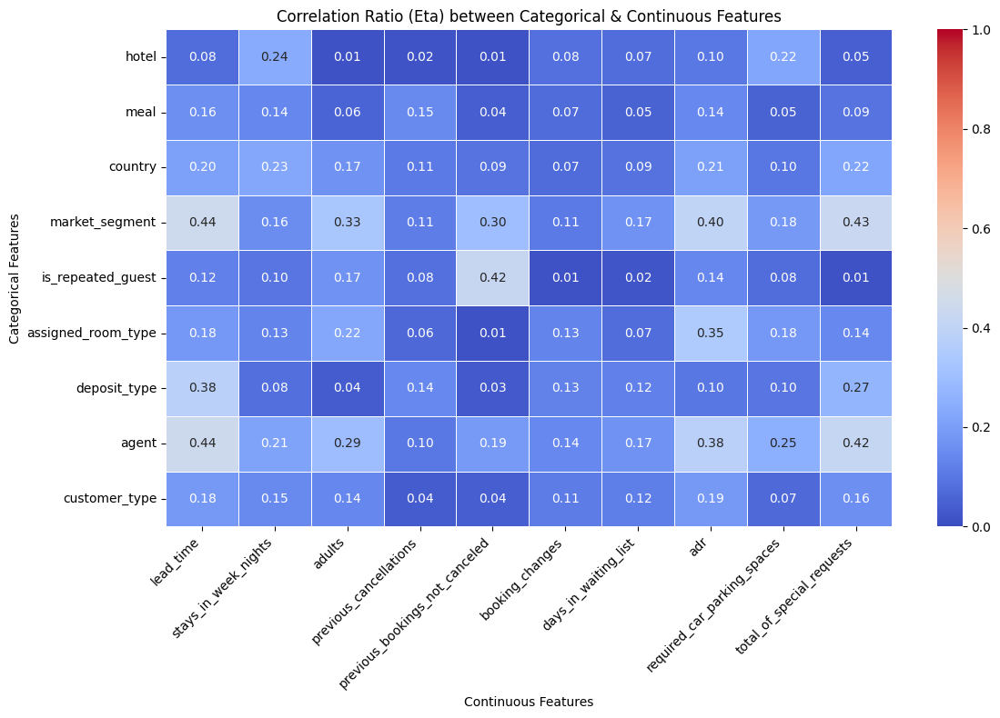

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

continuous_cols = [
    'lead_time', 'stays_in_week_nights', 'adults',
    'previous_cancellations', 'previous_bookings_not_canceled',
    'booking_changes', 'days_in_waiting_list', 'adr',
    'required_car_parking_spaces', 'total_of_special_requests'
]

categorical_cols = [
    'hotel', 'meal', 'country', 'market_segment',
    'is_repeated_guest', 'assigned_room_type',
    'deposit_type', 'agent', 'customer_type'
]

# ฟังก์ชันคำนวณ Correlation Ratio (Eta)
def correlation_ratio(categories, measurements):
    """
    คำนวณค่า Eta (ความสามารถของ Categorical feature ในการอธิบาย Continuous feature)
    Return: ค่าระหว่าง 0 ถึง 1
    """
    categories = np.array(categories)
    measurements = np.array(measurements)

    fcat, _ = pd.factorize(categories)
    cat_num = np.max(fcat) + 1
    y_avg_array = np.zeros(cat_num)
    n_array = np.zeros(cat_num)

    # คำนวณ Mean และ Count ของแต่ละกลุ่ม
    for i in range(0, cat_num):
        cat_measures = measurements[np.argwhere(fcat == i).flatten()]
        # ป้องกันกรณีกลุ่มว่าง
        if len(cat_measures) > 0:
            n_array[i] = len(cat_measures)
            y_avg_array[i] = np.average(cat_measures)
        else:
            n_array[i] = 0
            y_avg_array[i] = 0

    # คำนวณ Weighted Average รวม
    y_total_avg = np.sum(np.multiply(y_avg_array, n_array)) / np.sum(n_array)

    # คำนวณ Numerator (SS_between) และ Denominator (SS_total)
    numerator = np.sum(np.multiply(n_array, np.power(np.subtract(y_avg_array, y_total_avg), 2)))
    denominator = np.sum(np.power(np.subtract(measurements, y_total_avg), 2))

    if numerator == 0:
        return 0.0
    else:
        # ผลลัพธ์คือ Square Root ของ Eta-Squared
        return np.sqrt(numerator / denominator)

# สร้าง DataFrame ว่างๆ เพื่อเก็บผลลัพธ์
corr_matrix = pd.DataFrame(index=categorical_cols, columns=continuous_cols)

# วนลูปคำนวณทีละคู่
for cat in categorical_cols:
    for cont in continuous_cols:
        # จัดการ Missing Values ชั่วคราวเพื่อให้คำนวณได้
        clean_data = df[[cat, cont]].dropna()
        eta = correlation_ratio(clean_data[cat], clean_data[cont])
        corr_matrix.loc[cat, cont] = eta

# แปลงข้อมูลเป็น float เพื่อให้ Plot ได้
corr_matrix = corr_matrix.astype(float)

print("--- Correlation Ratio Matrix (Cat vs Cont) ---")
display(corr_matrix)

plt.figure(figsize=(12, 8))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    vmin=0,
    vmax=1,
    linewidths=.5
)
plt.title('Correlation Ratio (Eta) between Categorical & Continuous Features')
plt.xlabel('Continuous Features')
plt.ylabel('Categorical Features')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### **Summary of Categorical-Continuous Multicollinearity Check**

Based on the Correlation Ratio (Eta) heatmap analysis, we decided to keep all selected features. The rationale is as follows:

- Low Redundancy : The analysis revealed no strong multicollinearity between the categorical and continuous variables. All Eta ($\eta$) scores remained significantly below the concern threshold of 0.7.
- Maximum Correlation Observed : The highest correlation ratio observed was 0.44 (between market_segment and lead_time, as well as agent and lead_time). This indicates a moderate association, which is expected logically but does not constitute data redundancy.
- Conclusion : The categorical features provide distinct information that is not fully captured by the continuous features. Therefore, keeping both sets of variables will enrich the model's learning capability without introducing collinearity issues.

## **10.4 Selecting final predictors for Machine Learning summary**

Based on the above tests, selecting the final columns for machine learning

In [ ]:
SelectedColumns=['lead_time', 'stays_in_week_nights', 'adults', 'previous_cancellations',
                 'previous_bookings_not_canceled', 'booking_changes', 'days_in_waiting_list',
                 'adr', 'required_car_parking_spaces', 'total_of_special_requests',
                 'hotel', 'meal', 'country', 'market_segment', 'is_repeated_guest',
                 'assigned_room_type','deposit_type', 'agent', 'customer_type']

X_train = X_train[SelectedColumns]
X_test = X_test[SelectedColumns]

In [ ]:
# Selecting final columns
X_train[SelectedColumns].head()

,lead_time,stays_in_week_nights,adults,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests,hotel,meal,country,market_segment,is_repeated_guest,assigned_room_type,deposit_type,agent,customer_type
10719,192,5,2,0,0,0,0,47.1400,0,0,Resort Hotel - Chandigarh,BB,PRT,Online TA,0,A,No Deposit,Others,Transient
50295,295,2,2,0,0,0,0,62.0000,0,0,City Hotel - Hyderabad,BB,PRT,Groups,0,A,Non Refund,1.0000,Transient
27941,28,2,2,0,0,0,0,115.2000,1,0,Resort Hotel - Bangalore,BB,Others,Online TA,0,A,No Deposit,Others,Transient
39155,31,6,2,0,0,0,0,426.2500,0,2,Resort Hotel - Bhopal,Undefined,PRT,Direct,0,G,No Deposit,250.0000,Transient
63919,134,1,1,0,0,0,0,75.0000,0,0,City Hotel - Ahmedabad,BB,PRT,Groups,0,A,No Deposit,Others,Transient-Party


# **11. Data Pre-processing for Machine Learning**



## **11.1 Converting the binary nominal variable to numeric using 1/0 mapping**

In this dataset, there is only one binary nominal variables : 'is_repeated_guest'. Since it is already stored as an integer, no additional transformation or encoding is required for this variable.

In [ ]:
print("----- X_train (binary_features) -----")
print(X_train['is_repeated_guest'].head())
print(X_train['is_repeated_guest'].dtypes, "\n")

print("----- X_test (binary_features) -----")
print(X_test['is_repeated_guest'].head())
print(X_test['is_repeated_guest'].dtypes)

----- X_train (binary_features) -----
10719    0
50295    0
27941    0
39155    0
63919    0
Name: is_repeated_guest, dtype: int64
int64 

----- X_test (binary_features) -----
58207    0
81744    0
85607    0
95283    0
36900    0
Name: is_repeated_guest, dtype: int64
int64


## **11.2 Converting the nominal variable to numeric using get_dummies()**
In this dataset, there are 8 nominal categorical variable : 'hotel', 'meal', 'country', 'market_segment', 'assigned_room_type', 'deposit_type', 'agent', 'customer_type'. These variables will be converted into one-hot encoded variables using the get_dummies() method.

In [ ]:
cat_cols = ['hotel', 'meal', 'country', 'market_segment', 'assigned_room_type', 'deposit_type', 'agent', 'customer_type']

# --- TRAIN ---
# one-hot เฉพาะคอลัมน์หมวดหมู่
dummies_train = pd.get_dummies(
    X_train[cat_cols],
    prefix=cat_cols,
    prefix_sep='__',
    drop_first=False,
    dtype='int8'
)

# ดรอปคอลัมน์หมวดหมู่จาก X_train แล้วค่อยต่อกับ dummies
X_train_encode = pd.concat(
    [X_train.drop(columns=cat_cols).reset_index(drop=True),
     dummies_train.reset_index(drop=True)],
    axis=1
)

# --- TEST ---
dummies_test = pd.get_dummies(
     X_test[cat_cols],
    prefix=cat_cols,
    prefix_sep='__',
    drop_first=False,
    dtype='int8'
)

# จัดคอลัมน์ของ test ให้ตรงกับ train (ที่ขาดให้เติม 0)
dummies_test = dummies_test.reindex(columns=dummies_train.columns, fill_value=0)

X_test_encode = pd.concat(
    [X_test.drop(columns=cat_cols).reset_index(drop=True),
     dummies_test.reset_index(drop=True)],
    axis=1
)

In [ ]:
X_train_encode.head()

,lead_time,stays_in_week_nights,adults,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests,...,agent__14.0,agent__28.0,agent__240.0,agent__241.0,agent__250.0,agent__Others,customer_type__Contract,customer_type__Group,customer_type__Transient,customer_type__Transient-Party
0,192,5,2,0,0,0,0,47.1400,0,0,...,0,0,0,0,0,1,0,0,1,0
1,295,2,2,0,0,0,0,62.0000,0,0,...,0,0,0,0,0,0,0,0,1,0
2,28,2,2,0,0,0,0,115.2000,1,0,...,0,0,0,0,0,1,0,0,1,0
3,31,6,2,0,0,0,0,426.2500,0,2,...,0,0,0,0,1,0,0,0,1,0
4,134,1,1,0,0,0,0,75.0000,0,0,...,0,0,0,0,0,1,0,0,0,1


In [ ]:
X_test_encode.head()

,lead_time,stays_in_week_nights,adults,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests,...,agent__14.0,agent__28.0,agent__240.0,agent__241.0,agent__250.0,agent__Others,customer_type__Contract,customer_type__Group,customer_type__Transient,customer_type__Transient-Party
0,2,1,2,0,0,0,0,185.0000,0,0,...,0,0,0,0,0,0,0,0,1,0
1,113,3,2,6,0,0,44,75.0000,0,0,...,0,0,0,0,0,1,0,0,1,0
2,0,2,1,0,0,0,0,31.0000,0,0,...,0,0,0,0,0,1,0,0,0,1
3,143,2,2,0,0,0,0,114.3000,0,1,...,0,0,0,0,0,0,0,0,1,0
4,164,2,2,0,0,0,0,58.7000,0,1,...,0,0,0,0,0,1,0,0,1,0


## **11.3 Feature Scaling**
**Selected Method:** Standardization (Z-score Normalization) via StandardScaler.

**Rationale:** The continuous features in the dataset, such as lead_time, adr (Average Daily Rate), and age, exhibit vastly different ranges and units. Without scaling, algorithms that rely on distance calculations (e.g. K-Nearest Neighbors) or gradient descent optimization (e.g. Logistic Regression) would be biased toward features with larger numerical values. Standardization transforms all continuous features to have a mean of 0 and a standard deviation of 1, ensuring each feature contributes equally to the model's decision boundary.

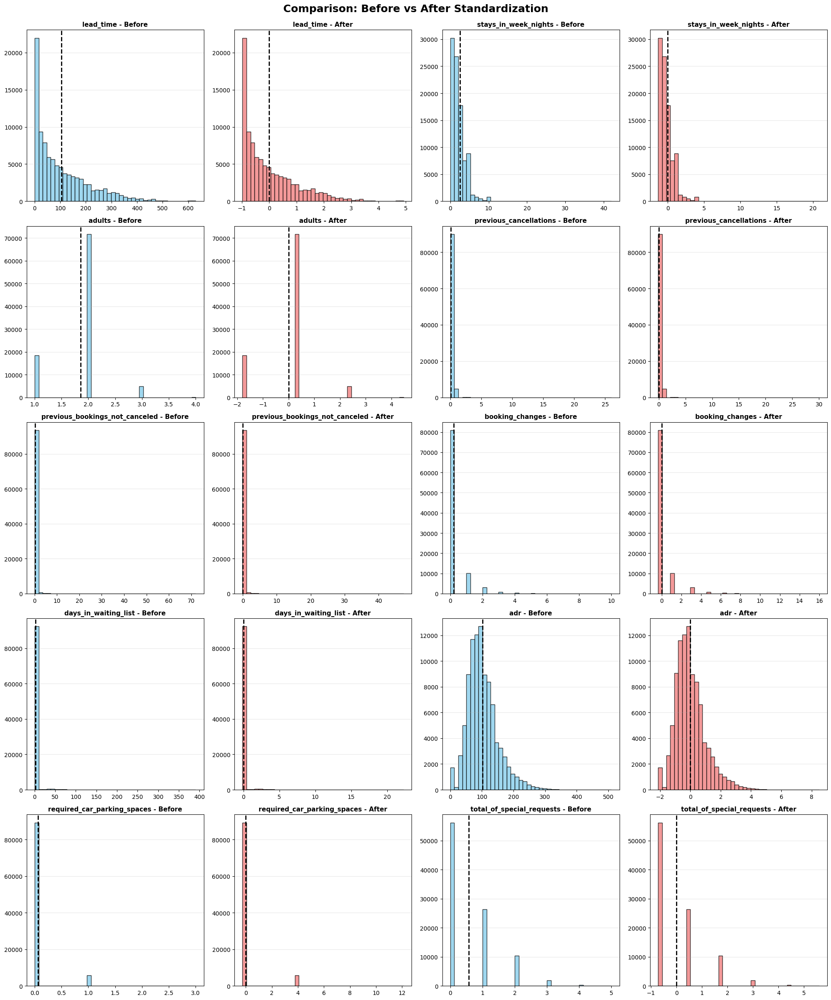

In [ ]:
from sklearn.preprocessing import StandardScaler

selected_continuous_cols = ['lead_time', 'stays_in_week_nights', 'adults',
    'previous_cancellations', 'previous_bookings_not_canceled',
    'booking_changes', 'days_in_waiting_list', 'adr',
    'required_car_parking_spaces', 'total_of_special_requests']

# Scaling
X_train_before = X_train_encode[selected_continuous_cols].copy()

scaler = StandardScaler()
X_train_after = scaler.fit_transform(X_train_encode[selected_continuous_cols])
X_train_after = pd.DataFrame(X_train_after, columns=selected_continuous_cols, index=X_train_encode.index)

X_test_encode[selected_continuous_cols] = scaler.transform(X_test_encode[selected_continuous_cols])

# Graph
fig, axes = plt.subplots(5, 4, figsize=(20, 24))  # เพิ่มความสูง
axes = axes.flatten()
fig.suptitle('Comparison: Before vs After Standardization', fontsize=18, fontweight='bold', y=0.995)

for idx, col in enumerate(selected_continuous_cols):
    # 2 subplot / 1 feature (Before/After)
    ax_before = axes[idx*2]
    ax_after = axes[idx*2 + 1]

    # Plot before scaling
    ax_before.hist(X_train_before[col].dropna(), bins=40, color='skyblue', edgecolor='black', alpha=0.8)
    ax_before.set_title(f'{col} - Before', fontsize=11, fontweight='bold')
    ax_before.grid(axis='y', alpha=0.3)
    # Present mean and std
    mean_b = X_train_before[col].mean()
    std_b = X_train_before[col].std()
    ax_before.axvline(mean_b, color='black', linestyle='--', linewidth=2)

    # Plot after scaling
    ax_after.hist(X_train_after[col].dropna(), bins=40, color='lightcoral', edgecolor='black', alpha=0.8)
    ax_after.set_title(f'{col} - After', fontsize=11, fontweight='bold')
    ax_after.grid(axis='y', alpha=0.3)
    # Present mean and std
    mean_a = X_train_after[col].mean()
    std_a = X_train_after[col].std()
    ax_after.axvline(mean_a, color='black', linestyle='--', linewidth=2)

for idx in range(len(selected_continuous_cols)*2, len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# Statics table
print("\nStatistics Comparison: Before VS After Standardization")
print("="*100)
comparison_df = pd.DataFrame({'Feature': selected_continuous_cols, 'Mean_Before': X_train_before.mean().values, 'Std_Before': X_train_before.std().values,
    'Min_Before': X_train_before.min().values, 'Max_Before': X_train_before.max().values, 'Mean_After': X_train_after.mean().values,
    'Std_After': X_train_after.std().values, 'Min_After': X_train_after.min().values, 'Max_After': X_train_after.max().values})
pd.options.display.float_format = '{:.4f}'.format
print(comparison_df.to_string(index=False))
print("="*100)


Statistics Comparison: Before VS After Standardization
                       Feature  Mean_Before  Std_Before  Min_Before  Max_Before  Mean_After  Std_After  Min_After  Max_After
                     lead_time     104.0517    106.8436      0.0000    629.0000     -0.0000     1.0000    -0.9739     4.9133
          stays_in_week_nights       2.4993      1.8947      0.0000     42.0000     -0.0000     1.0000    -1.3191    20.8485
                        adults       1.8599      0.4781      1.0000      4.0000      0.0000     1.0000    -1.7986     4.4766
        previous_cancellations       0.0888      0.8629      0.0000     26.0000     -0.0000     1.0000    -0.1029    30.0292
previous_bookings_not_canceled       0.1373      1.5173      0.0000     72.0000     -0.0000     1.0000    -0.0905    47.3614
               booking_changes       0.2151      0.6119      0.0000     10.0000      0.0000     1.0000    -0.3516    15.9923
          days_in_waiting_list       2.3050     17.4448      0.0000  

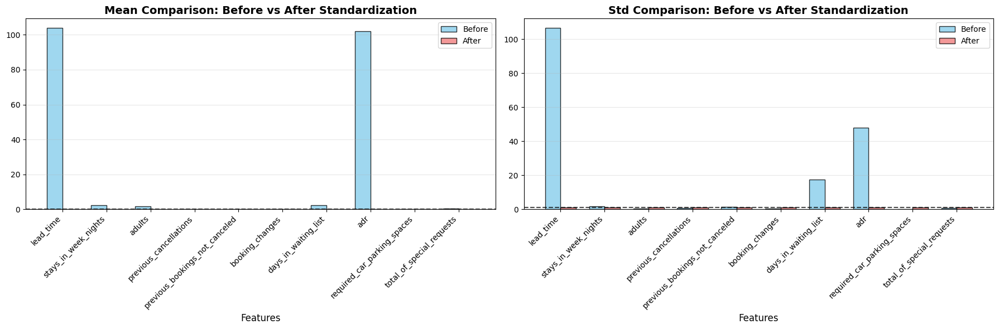

Final Validation
Mean of scaled features: 0.0000
Std of scaled features: 1.0000


In [ ]:
# Graph: Mean and Std
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
x_pos = np.arange(len(selected_continuous_cols))
width = 0.35

# Mean comparison
bars1 = ax1.bar(x_pos - width/2, comparison_df['Mean_Before'], width,
                label='Before', alpha=0.8, color='skyblue', edgecolor='black')
bars2 = ax1.bar(x_pos + width/2, comparison_df['Mean_After'], width,
                label='After', alpha=0.8, color='lightcoral', edgecolor='black')
ax1.set_xlabel('Features', fontsize=12)
ax1.set_title('Mean Comparison: Before vs After Standardization', fontweight='bold', fontsize=14)
ax1.set_xticks(x_pos)
ax1.set_xticklabels(selected_continuous_cols, rotation=45, ha='right')
ax1.legend(fontsize=10)
ax1.grid(axis='y', alpha=0.3)
ax1.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.7, label='Target Mean=0')

# Std comparison
bars3 = ax2.bar(x_pos - width/2, comparison_df['Std_Before'], width,
                label='Before', alpha=0.8, color='skyblue', edgecolor='black')
bars4 = ax2.bar(x_pos + width/2, comparison_df['Std_After'], width,
                label='After', alpha=0.8, color='lightcoral', edgecolor='black')
ax2.set_xlabel('Features', fontsize=12)
ax2.set_title('Std Comparison: Before vs After Standardization', fontweight='bold', fontsize=14)
ax2.set_xticks(x_pos)
ax2.set_xticklabels(selected_continuous_cols, rotation=45, ha='right')
ax2.legend(fontsize=10)
ax2.grid(axis='y', alpha=0.3)
ax2.axhline(y=1, color='black', linestyle='--', linewidth=1.5, alpha=0.7, label='Target Std=1')

plt.tight_layout()
plt.show()

# Check correct scaling
print("Final Validation")
print(f"Mean of scaled features: {X_train_after.mean().mean():.4f}")
print(f"Std of scaled features: {X_train_after.std().mean():.4f}")

# Update X_train_encode with scaled values
X_train_encode[selected_continuous_cols] = X_train_after

# **12. Model construction**

We will build four models: Logistic Regression, Random Forest, K-Nearest Neighbor, and Neural Network.



## **12.1 Logistic Regression**

In [ ]:
# let's print the shape of train and test
print("X_train shape", X_train_encode.shape)
print("y_train shape", y_train.shape)
print("X_test shape", X_test_encode.shape)
print("y_test shape", y_test.shape)

X_train shape (95152, 93)
y_train shape (95152,)
X_test shape (23789, 93)
y_test shape (23789,)


In [ ]:
# Separate Target Variable and Predictor Variables
TargetVariable = 'is_canceled'
Predictors = list(X_train_encode.columns)

In [ ]:
# Multiple Linear Regression
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42)

# Printing all the parameters of Linear regression
print(logreg)

LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)


In [ ]:
# Creating the model on Training Data
logreg.fit(X_train_encode, y_train)

LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)

In [ ]:
print("Model training completed")
print(f"Number of features: {logreg.n_features_in_}")
print(f"Number of iterations: {logreg.n_iter_}")
print(f"Coefficient: {logreg.coef_}")
print(f"intercept: {logreg.intercept_}")

Model training completed
Number of features: 93
Number of iterations: [73]
Coefficient: [[ 0.55904018  0.22569812  0.08599416  1.84858085 -0.48711349 -0.22108426
  -0.06340942  0.21905444 -2.94722589 -0.62426184 -1.03068559  0.05768398
   0.13404543  0.06807482  0.01289747  0.0551488  -0.01356231  0.03913213
   0.1033098   0.05781055  0.05657441  0.00828085  0.13730141  0.0483714
   0.06356983  0.04939114 -0.16493671 -0.12670066 -0.07810965 -0.22506276
  -0.08752058 -0.08593804 -0.13965418 -0.02616983 -0.1133961  -0.19469328
   0.01324719 -0.1932159  -0.1366938  -0.11045778 -0.06636784 -0.09055861
   0.20962937 -0.20292125 -0.03710011 -0.73668963 -0.71013647  0.43057514
  -0.82170045  0.15086124 -0.51635471 -0.38667191 -0.38792902  0.25773867
  -0.64255579 -0.07076549  1.83929855  0.28184085 -0.37668591 -0.31589306
  -0.55278413  0.26530214 -0.25361278  0.09419265  0.6627669   0.21655193
   0.21513257  0.2665617   0.46148568  0.18629028  0.33221675  0.1908922
  -2.12647473 -1.32565836 

In [ ]:
# Printing some sample values of prediction
print("Training result prediction of Model")
TrainingPrediction1 = logreg.predict(X_train_encode)
TrainingPredictionProba1 = logreg.predict_proba(X_train_encode)[:, 1]

TrainingDataResults1 = pd.DataFrame(data=X_train_encode, columns=Predictors)
TrainingDataResults1[TargetVariable] = y_train.values
TrainingDataResults1[('Predicted' + TargetVariable)] = TrainingPrediction1
TrainingDataResults1[('Probability')] = TrainingPredictionProba1

# Printing sample prediction values
print(TrainingDataResults1.head())

Training result prediction of Model
   lead_time  stays_in_week_nights  adults  previous_cancellations  \
0     0.8232                1.3199  0.2931                 -0.1029   
1     1.7872               -0.2635  0.2931                 -0.1029   
2    -0.7118               -0.2635  0.2931                 -0.1029   
3    -0.6837                1.8477  0.2931                 -0.1029   
4     0.2803               -0.7913 -1.7986                 -0.1029   

   previous_bookings_not_canceled  booking_changes  days_in_waiting_list  \
0                         -0.0905          -0.3516               -0.1321   
1                         -0.0905          -0.3516               -0.1321   
2                         -0.0905          -0.3516               -0.1321   
3                         -0.0905          -0.3516               -0.1321   
4                         -0.0905          -0.3516               -0.1321   

      adr  required_car_parking_spaces  total_of_special_requests  ...  \
0 -1.1425   

In [ ]:
# Printing some sample values of prediction
print("Testing result prediction of Model")
TestingPrediction1 = logreg.predict(X_test_encode)
TestingPredictionProba1 = logreg.predict_proba(X_test_encode)[:, 1]

TestingDataResults1 = pd.DataFrame(data=X_test_encode, columns=Predictors)
TestingDataResults1[TargetVariable] = y_test.values
TestingDataResults1[('Predicted' + TargetVariable)] = TestingPrediction1
TestingDataResults1[('Probability')] = TestingPredictionProba1

# Printing sample prediction values
print(TestingDataResults1.head())

Testing result prediction of Model
   lead_time  stays_in_week_nights  adults  previous_cancellations  \
0    -0.9552               -0.7913  0.2931                 -0.1029   
1     0.0838                0.2643  0.2931                  6.8506   
2    -0.9739               -0.2635 -1.7986                 -0.1029   
3     0.3645               -0.2635  0.2931                 -0.1029   
4     0.5611               -0.2635  0.2931                 -0.1029   

   previous_bookings_not_canceled  booking_changes  days_in_waiting_list  \
0                         -0.0905          -0.3516               -0.1321   
1                         -0.0905          -0.3516                2.3901   
2                         -0.0905          -0.3516               -0.1321   
3                         -0.0905          -0.3516               -0.1321   
4                         -0.0905          -0.3516               -0.1321   

      adr  required_car_parking_spaces  total_of_special_requests  ...  \
0  1.7295    

In [ ]:
# Evaluation Metrics
from sklearn import metrics

# Classification Metrics for Training data
print('=== Training Data Metrics ===')
print('Accuracy Score:', metrics.accuracy_score(y_train, TrainingPrediction1))
print('Precision Score:', metrics.precision_score(y_train, TrainingPrediction1))
print('Recall Score:', metrics.recall_score(y_train, TrainingPrediction1))
print('F1 Score:', metrics.f1_score(y_train, TrainingPrediction1))
print('ROC AUC Score:', metrics.roc_auc_score(y_train, TrainingPredictionProba1))

=== Training Data Metrics ===
Accuracy Score: 0.813824197074155
Precision Score: 0.7270705085096477
Recall Score: 0.7969268278853514
F1 Score: 0.7603976465814567
ROC AUC Score: 0.9006885575777811


In [ ]:
# Confusion Matrix for Training data
print('Confusion Matrix (Training):')
print(metrics.confusion_matrix(y_train, TrainingPrediction1))

# Classification Report for Training data
print('\nClassification Report (Training):')
print(metrics.classification_report(y_train, TrainingPrediction1))

Confusion Matrix (Training):
[[49327 10552]
 [ 7163 28110]]

Classification Report (Training):
              precision    recall  f1-score   support

           0       0.87      0.82      0.85     59879
           1       0.73      0.80      0.76     35273

    accuracy                           0.81     95152
   macro avg       0.80      0.81      0.80     95152
weighted avg       0.82      0.81      0.82     95152



In [ ]:
# Classification Metrics for Testing data
print('=== Testing Data Metrics ===')
print('Accuracy Score:', metrics.accuracy_score(y_test, TestingPrediction1))
print('Precision Score:', metrics.precision_score(y_test, TestingPrediction1))
print('Recall Score:', metrics.recall_score(y_test, TestingPrediction1))
print('F1 Score:', metrics.f1_score(y_test, TestingPrediction1))
print('ROC AUC Score:', metrics.roc_auc_score(y_test, TestingPredictionProba1))

=== Testing Data Metrics ===
Accuracy Score: 0.8144520576737148
Precision Score: 0.7279503105590062
Recall Score: 0.7974597414379678
F1 Score: 0.7611213334776491
ROC AUC Score: 0.9031540247487473


In [ ]:
# Confusion Matrix for Testing data
print('Confusion Matrix (Testing):')
print(metrics.confusion_matrix(y_test, TestingPrediction1))

# Classification Report for Testing data
print('\nClassification Report (Testing):')
print(metrics.classification_report(y_test, TestingPrediction1))

Confusion Matrix (Testing):
[[12343  2628]
 [ 1786  7032]]

Classification Report (Testing):
              precision    recall  f1-score   support

           0       0.87      0.82      0.85     14971
           1       0.73      0.80      0.76      8818

    accuracy                           0.81     23789
   macro avg       0.80      0.81      0.80     23789
weighted avg       0.82      0.81      0.82     23789



In [ ]:
# Print coefficients with feature names
print('=== Model Coefficients ===')
print("Intercept:", logreg.intercept_[0])
for i, predictor in enumerate(Predictors):
    print(f"Coefficient for {predictor}: {logreg.coef_[0][i]:.4f}")

=== Model Coefficients ===
Intercept: -0.9150126049907118
Coefficient for lead_time: 0.5590
Coefficient for stays_in_week_nights: 0.2257
Coefficient for adults: 0.0860
Coefficient for previous_cancellations: 1.8486
Coefficient for previous_bookings_not_canceled: -0.4871
Coefficient for booking_changes: -0.2211
Coefficient for days_in_waiting_list: -0.0634
Coefficient for adr: 0.2191
Coefficient for required_car_parking_spaces: -2.9472
Coefficient for total_of_special_requests: -0.6243
Coefficient for is_repeated_guest: -1.0307
Coefficient for hotel__City Hotel - Ahmedabad: 0.0577
Coefficient for hotel__City Hotel - Bangalore: 0.1340
Coefficient for hotel__City Hotel - Bhopal: 0.0681
Coefficient for hotel__City Hotel - Chandigarh: 0.0129
Coefficient for hotel__City Hotel - Chennai: 0.0551
Coefficient for hotel__City Hotel - Delhi: -0.0136
Coefficient for hotel__City Hotel - Goa: 0.0391
Coefficient for hotel__City Hotel - Hyderabad: 0.1033
Coefficient for hotel__City Hotel - Indore: 0.05

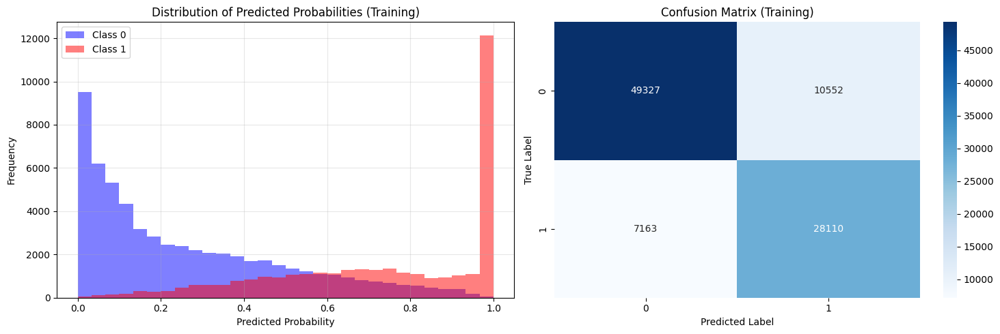

In [ ]:
# Visualize Training Results
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Predicted Probabilities Distribution
axes[0].hist(TrainingDataResults1[TrainingDataResults1[TargetVariable] == 0]['Probability'],
             bins=30, alpha=0.5, label='Class 0', color='blue')
axes[0].hist(TrainingDataResults1[TrainingDataResults1[TargetVariable] == 1]['Probability'],
             bins=30, alpha=0.5, label='Class 1', color='red')
axes[0].set_xlabel('Predicted Probability')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Predicted Probabilities (Training)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Confusion Matrix Heatmap
cm_train = metrics.confusion_matrix(y_train, TrainingPrediction1)
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', ax=axes[1])
axes[1].set_xlabel('Predicted Label')
axes[1].set_ylabel('True Label')
axes[1].set_title('Confusion Matrix (Training)')

plt.tight_layout()
plt.show()

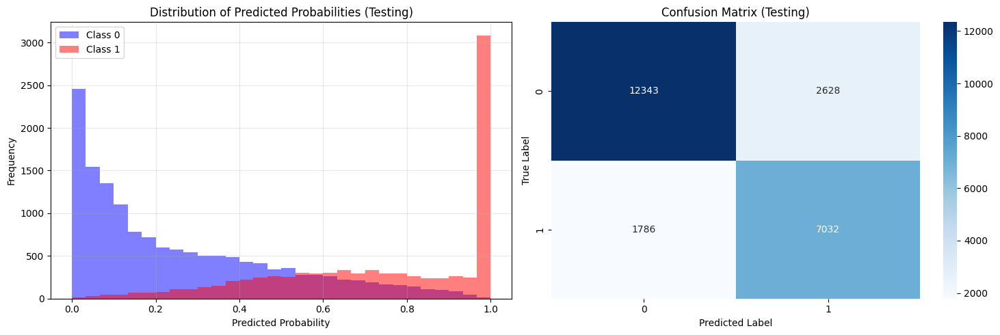

In [ ]:
# Visualize Testing Results
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Predicted Probabilities Distribution
axes[0].hist(TestingDataResults1[TestingDataResults1[TargetVariable] == 0]['Probability'],
             bins=30, alpha=0.5, label='Class 0', color='blue')
axes[0].hist(TestingDataResults1[TestingDataResults1[TargetVariable] == 1]['Probability'],
             bins=30, alpha=0.5, label='Class 1', color='red')
axes[0].set_xlabel('Predicted Probability')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Predicted Probabilities (Testing)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Confusion Matrix Heatmap
cm_test = metrics.confusion_matrix(y_test, TestingPrediction1)
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', ax=axes[1])
axes[1].set_xlabel('Predicted Label')
axes[1].set_ylabel('True Label')
axes[1].set_title('Confusion Matrix (Testing)')

plt.tight_layout()
plt.show()

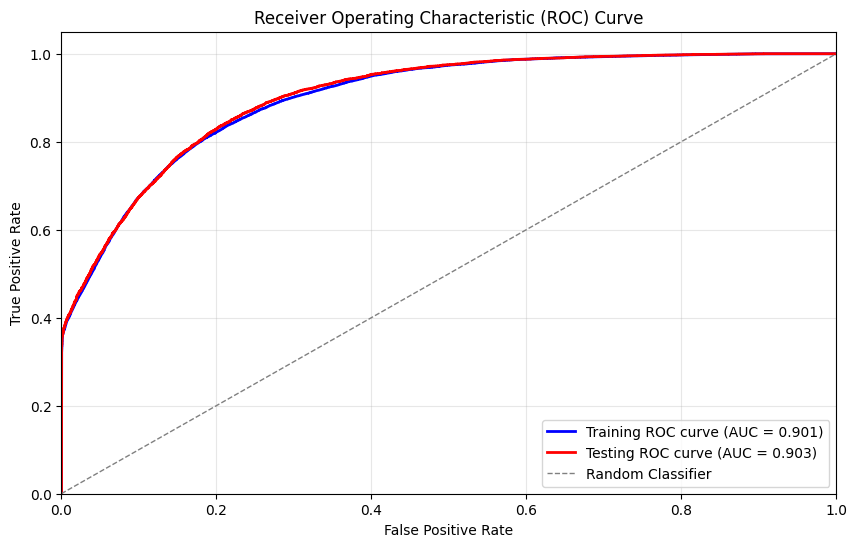

In [ ]:
# ROC Curve
from sklearn.metrics import roc_curve, auc

# Calculate ROC curve for Training data
fpr_train, tpr_train, _ = roc_curve(y_train, TrainingPredictionProba1)
roc_auc_train = auc(fpr_train, tpr_train)

# Calculate ROC curve for Testing data
fpr_test, tpr_test, _ = roc_curve(y_test, TestingPredictionProba1)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curves
plt.figure(figsize=(10, 6))
plt.plot(fpr_train, tpr_train, color='blue', lw=2,
         label=f'Training ROC curve (AUC = {roc_auc_train:.3f})')
plt.plot(fpr_test, tpr_test, color='red', lw=2,
         label=f'Testing ROC curve (AUC = {roc_auc_test:.3f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--', label='Random Classifier')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

Baseline Accuracy: 0.8145



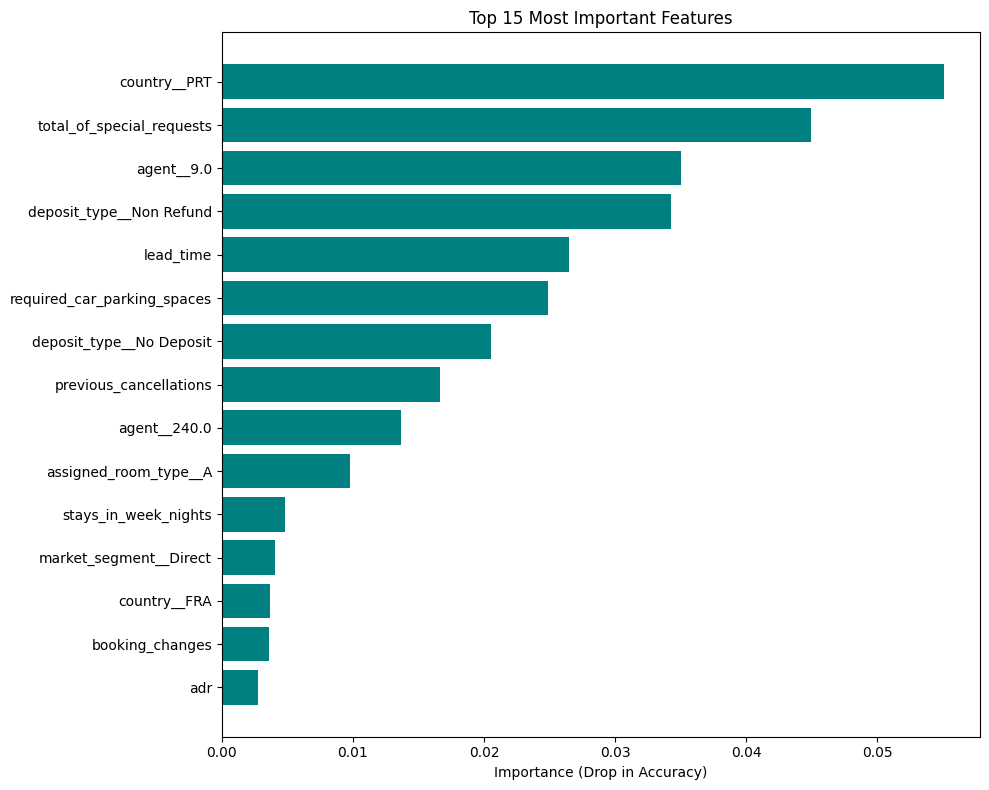

                        Feature  Importance
56                 country__PRT      0.0551
9     total_of_special_requests      0.0449
82                   agent__9.0      0.0350
76     deposit_type__Non Refund      0.0342
0                     lead_time      0.0265
8   required_car_parking_spaces      0.0248
75     deposit_type__No Deposit      0.0205
3        previous_cancellations      0.0166
85                 agent__240.0      0.0137
64        assigned_room_type__A      0.0098


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# ฟังก์ชันคำนวณ Permutation Importance แบบ manual (เวอร์ชันแก้แล้ว)
def get_permutation_importance(model, X, y, feature_names):

    # ใช้ DataFrame ตรง ๆ เพื่อให้ feature names ไม่หาย
    if isinstance(X, pd.DataFrame):
        X_val = X.copy()
    else:
        X_val = pd.DataFrame(X, columns=feature_names)

    y_val = np.array(y)

    # 1) ทำนาย baseline accuracy
    initial_preds = model.predict(X_val)
    baseline_acc = accuracy_score(y_val, initial_preds)
    print(f"Baseline Accuracy: {baseline_acc:.4f}\n")

    importances = []

    # 2) วนทีละ feature แล้ว shuffle เฉพาะคอลัมน์นั้น
    for col_name in feature_names:
        X_permuted = X_val.copy()

        # shuffle เฉพาะคอลัมน์ (ยังเป็น DataFrame)
        X_permuted[col_name] = np.random.permutation(X_permuted[col_name].values)

        # ทำนายใหม่
        permuted_preds = model.predict(X_permuted)
        permuted_acc = accuracy_score(y_val, permuted_preds)

        # ความสำคัญ = baseline - permuted accuracy
        importance = baseline_acc - permuted_acc
        importances.append(importance)

    # 3) สร้าง DataFrame ผลลัพธ์
    df_imp = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values(by='Importance', ascending=False)

    return df_imp


# เรียกใช้กับ X_test
df_importance = get_permutation_importance(
    logreg,
    X_test_encode,
    y_test,
    X_test_encode.columns
)

plt.figure(figsize=(10, 8))
top15 = df_importance.head(15)[::-1]  # แสดง top 15
plt.barh(top15['Feature'], top15['Importance'], color='teal')
plt.xlabel('Importance (Drop in Accuracy)')
plt.title('Top 15 Most Important Features')
plt.tight_layout()
plt.show()

print(df_importance.head(10))

**สรุปผลการทดสอบประสิทธิภาพโมเดล Logistic Regression**
1. Model Performance Overview: จากการทดสอบโมเดล Logistic Regression เพื่อทำนายการยกเลิกการจอง (Cancellation Prediction) พบว่าโมเดลมีประสิทธิภาพอยู่ในระดับ "ปานกลาง (Moderate)" โดยมีรายละเอียดดังนี้
    - ความแม่นยำ (Accuracy): โมเดลสามารถทำนายผลได้ถูกต้องแม่นยำประมาณ 81.45% บนชุดข้อมูลทดสอบ (Testing Set)
    - ความสามารถในการจำแนก (ROC AUC): ค่า AUC อยู่ที่ระดับ 0.903 ซึ่งแสดงว่าโมเดลมีความสามารถในการแยกแยะระหว่างลูกค้าที่จะยกเลิกและไม่ยกเลิกได้ดี
    - จุดที่ต้องระวัง (Weakness): ค่า Precision อยู่ที่ 72.80% ซึ่งถือว่าค่อนข้างต่ำ หมายความว่าเมื่อโมเดลทำนายว่าลูกค้าจะยกเลิก มีโอกาสผิดพลาด (False Positive) อยู่ประมาณ 27%

2. Overfitting Analysis: ผลการทดสอบยืนยันว่าโมเดล ไม่มีปัญหา Overfitting (No Overfitting) โดยสังเกตได้จากผลลัพธ์ระหว่าง Training Set และ Testing Set ที่มีความใกล้เคียงกันมาก:
    - Training Accuracy: 81.38%
    - Testing Accuracy: 81.45%
    - ส่วนต่าง (Gap): น้อยกว่า 0.1%
    - สรุป: โมเดลมีความเสถียรสูงมาก (High Stability) และสามารถนำไปใช้งานกับข้อมูลใหม่ได้โดยที่ประสิทธิภาพไม่ตกลง แต่มีข้อจำกัดเรื่องความซับซ้อนของโมเดลที่ไม่สามารถเรียนรู้รูปแบบที่ลึกซึ้งได้เท่ากับโมเดลตระกูล Tree-based

3. Key Feature Drivers: จากการวิเคราะห์สัมประสิทธิ์ความสำคัญ (Feature Importance) พบว่าปัจจัยหลักที่ส่งผลต่อการทำนายด้วยสมการเส้นตรง 3 อันดับแรก ได้แก่:
    - country_PRT (ลูกค้าจากประเทศโปรตุเกส): เป็นปัจจัยที่มีอิทธิพลสูงสุด แสดงให้เห็นว่าในเชิงสถิติพื้นฐาน สัญชาติลูกค้ามีความสัมพันธ์กับอัตราการยกเลิกอย่างมีนัยสำคัญ
    - total_of_special_requests (จำนวนคำขอพิเศษ): จำนวนคำขอพิเศษของลูกค้ามีผลต่อแนวโน้มการยกเลิก
    - deposit_type_Non Refund (การมัดจำแบบไม่คืนเงิน): เป็นปัจจัยสำคัญในการระบุกลุ่มลูกค้าที่มีความตั้งใจเข้าพักจริง

**Error Analysis**

Model Evaluation: Error Analysis
------------------------------
CONFUSION MATRIX BREAKDOWN:
   • True Negatives (TN):  12,343 - Predicted 'Not Canceled' & Actual 'Stayed' (Correct)
   • False Positives (FP): 2,628 - Predicted 'Canceled' & Actual 'Stayed' (Lost Revenue Opportunity)
   • False Negatives (FN): 1,786 - Predicted 'Not Canceled' & Actual 'Canceled' (Inventory Spoilage) ⚠️
   • True Positives (TP):  7,032 - Predicted 'Canceled' & Actual 'Canceled' (Correctly Identified)

PERFORMANCE METRICS:
   • Accuracy:             81.4% - Overall Accuracy
   • Recall (Sensitivity): 79.7% - Ability to capture 'Cancellations' (Higher is better)
   • Specificity:          82.4% - Ability to identify 'Safe' bookings
   • Precision:            72.8% - Reliability of 'Cancellation' prediction

ERROR DISTRIBUTION:
   • Total Errors: 4,414 (18.6%)
   • False Positives: 2,628 (11.0%) -> Type I Error
     → Avg Confidence: 0.675
   • False Negatives: 1,786 (7.5%) -> Type II Error ⚠️ HIGH RISK
     

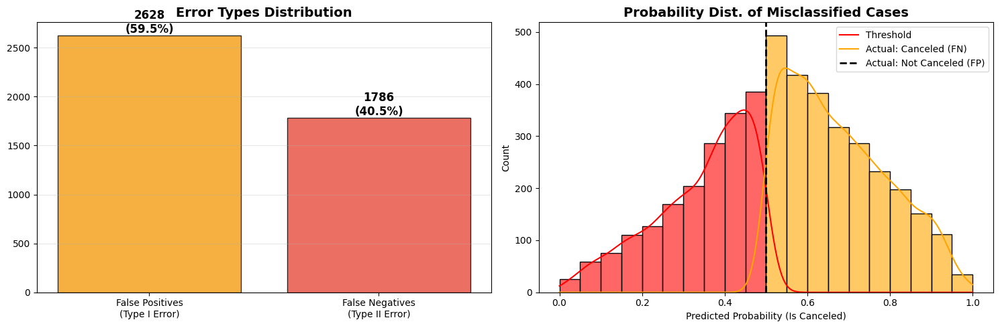

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics

# --- Confusion Matrix Analysis ---
tn, fp, fn, tp = metrics.confusion_matrix(y_test, TestingPrediction1).ravel()

print('Model Evaluation: Error Analysis')
print("-" * 30)
print(f"CONFUSION MATRIX BREAKDOWN:")
print(f"   • True Negatives (TN):  {tn:,} - Predicted 'Not Canceled' & Actual 'Stayed' (Correct)")
print(f"   • False Positives (FP): {fp:,} - Predicted 'Canceled' & Actual 'Stayed' (Lost Revenue Opportunity)")
print(f"   • False Negatives (FN): {fn:,} - Predicted 'Not Canceled' & Actual 'Canceled' (Inventory Spoilage) ⚠️")
print(f"   • True Positives (TP):  {tp:,} - Predicted 'Canceled' & Actual 'Canceled' (Correctly Identified)")

# --- Business Implications ---
accuracy = (tp + tn) / (tp + tn + fp + fn)
recall = tp / (tp + fn)
specificity = tn / (tn + fp)
precision = tp / (tp + fp) if (tp + fp) > 0 else 0

print(f"\nPERFORMANCE METRICS:")
print(f"   • Accuracy:             {accuracy:.1%} - Overall Accuracy")
print(f"   • Recall (Sensitivity): {recall:.1%} - Ability to capture 'Cancellations' (Higher is better)")
print(f"   • Specificity:          {specificity:.1%} - Ability to identify 'Safe' bookings")
print(f"   • Precision:            {precision:.1%} - Reliability of 'Cancellation' prediction")

# --- Analyze Misclassified Cases ---
test_misclassified = TestingDataResults1[
    TestingDataResults1[TargetVariable] != TestingDataResults1['Predicted' + TargetVariable]
]

false_positives = TestingDataResults1[
    (TestingDataResults1[TargetVariable] == 0) &
    (TestingDataResults1['Predicted' + TargetVariable] == 1)
]

false_negatives = TestingDataResults1[
    (TestingDataResults1[TargetVariable] == 1) &
    (TestingDataResults1['Predicted' + TargetVariable] == 0)
]

print(f"\nERROR DISTRIBUTION:")
print(f"   • Total Errors: {len(test_misclassified):,} ({len(test_misclassified)/len(TestingDataResults1)*100:.1f}%)")
print(f"   • False Positives: {len(false_positives):,} ({len(false_positives)/len(TestingDataResults1)*100:.1f}%) -> Type I Error")
print(f"     → Avg Confidence: {false_positives['Probability'].mean():.3f}")
print(f"   • False Negatives: {len(false_negatives):,} ({len(false_negatives)/len(TestingDataResults1)*100:.1f}%) -> Type II Error ⚠️ HIGH RISK")
print(f"     → Avg Confidence: {false_negatives['Probability'].mean():.3f}")

# --- Probability Distribution Analysis ---
print(f"\nMISCLASSIFICATION PROBABILITY DISTRIBUTION (Confidence in Errors):")
prob_ranges = [
    (0.0, 0.3, "Very Low"),
    (0.3, 0.45, "Low"),
    (0.45, 0.55, "Uncertain (Borderline)"),
    (0.55, 0.7, "High"),
    (0.7, 1.0, "Very High (High Confidence Error)")
]

for low, high, label in prob_ranges:
    count_fn = len(false_negatives[
        (false_negatives['Probability'] >= low) & (false_negatives['Probability'] < high)
    ])
    count_fp = len(false_positives[
        (false_positives['Probability'] >= low) & (false_positives['Probability'] < high)
    ])

    if count_fn > 0: print(f"   • FN {label} ({low}-{high}): {count_fn} cases")
    if count_fp > 0: print(f"   • FP {label} ({low}-{high}): {count_fp} cases")

# --- Model Limitations ---
print(f"\nIDENTIFIED MODEL LIMITATIONS (Logistic Regression):")
print("""
1. LINEARITY ASSUMPTION:
   - Logistic Regression assumes linear relationships between features and log-odds.
   - It may fail to capture complex patterns (e.g., seasonal interaction with country).

2. SENSITIVITY TO OUTLIERS:
   - Extreme values in 'adr' or 'lead_time' can distort the decision boundary significantly.

3. FEATURE INDEPENDENCE:
   - Assumes features are not correlated (Multicollinearity).
   - Features like 'market_segment' and 'distribution_channel' might confuse the model weights.
""")

# --- Visualization ---
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Error Types
error_types = ['False Positives\n(Type I Error)', 'False Negatives\n(Type II Error)']
error_counts = [len(false_positives), len(false_negatives)]
colors = ['#f39c12', '#e74c3c']
bars = axes[0].bar(error_types, error_counts, color=colors, edgecolor='black', alpha=0.8)
axes[0].set_title('Error Types Distribution', fontsize=14, fontweight='bold')
axes[0].grid(True, alpha=0.3, axis='y')

for bar, count in zip(bars, error_counts):
    axes[0].text(bar.get_x() + bar.get_width()/2., bar.get_height(),
                f'{count}\n({count/len(test_misclassified)*100:.1f}%)',
                ha='center', va='bottom', fontsize=12, fontweight='bold')

# Plot 2: Probability Distribution
sns.histplot(data=test_misclassified, x='Probability', hue=TargetVariable,
             bins=20, alpha=0.6, ax=axes[1], kde=True, palette={0: 'orange', 1: 'red'})
axes[1].axvline(x=0.5, color='black', linestyle='--', linewidth=2, label='Threshold 0.5')
axes[1].set_title('Probability Dist. of Misclassified Cases', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Predicted Probability (Is Canceled)')
axes[1].legend(['Threshold', 'Actual: Canceled (FN)', 'Actual: Not Canceled (FP)'])

plt.tight_layout()
plt.show()

**Error Analysis Summary**

โมเดล Logistic Regression จัดอยู่ในกลุ่ม "Baseline Model" ที่มีความแม่นยำระดับปานกลาง (Accuracy 81.4%) ผลการวิเคราะห์ชี้ให้เห็นว่าโมเดลมีพฤติกรรม **มองโลกในแง่ร้าย** โดยมีแนวโน้มที่จะทำนายว่าลูกค้าจะ "ยกเลิก" (Cancel) มากเกินความเป็นจริง ส่งผลให้เกิดอัตรา False Positive สูง ข้อจำกัดหลักเกิดจากสมมติฐานความเป็นเส้นตรง (Linearity Assumption) ของโมเดลที่ไม่สามารถจับรูปแบบพฤติกรรมที่ซับซ้อนของลูกค้าได้

1. การเจาะลึกข้อผิดพลาด (Error Deep Dive)

    จากการวิเคราะห์เคสที่ทายผิดจำนวน 4,414 เคส พบประเด็นสำคัญดังนี้:

    - ปัญหาหลัก: "ความระแวงเกินเหตุ" (High False Positives)
    จำนวน: 2,628 เคส (11.0% ของข้อมูลทั้งหมด)
      - สถานการณ์: โมเดลทายว่า "จะยกเลิก" แต่ลูกค้า "มาพักจริง"
      - ความมั่นใจ: โมเดลมีความมั่นใจผิด ๆ (High Confidence Error) ในกลุ่มนี้สูงมาก
      - ผลกระทบทางธุรกิจ:
        - เสี่ยงต่อการขายห้องซ้ำ (Overbooking) จนห้องพักไม่พอ
        - เสียโอกาสในการขายห้องในราคาปกติ (เพราะรีบนำไปลดราคา หรือทำโปรโมชั่นดึงลูกค้า)

    - ปัญหารอง: "ตามไม่ทัน" (False Negatives)
    จำนวน: 1,786 เคส (7.5% ของข้อมูลทั้งหมด)
      - สถานการณ์: โมเดลทายว่า "ไม่ยกเลิก" แต่ลูกค้า "ดันยกเลิก"
      - ความมั่นใจ: ค่าเฉลี่ยความมั่นใจต่ำ (0.344) แสดงว่าโมเดลมองไม่เห็นสัญญาณความเสี่ยงในข้อมูลกลุ่มนี้
      - ผลกระทบทางธุรกิจ: เกิดห้องว่างเก้อ (Spoilage) และสูญเสียต้นทุนในการเตรียมการบริการ

2. การวิเคราะห์สาเหตุ (Root Cause Analysis)

    ข้อจำกัดทางเทคนิคที่ทำให้โมเดล Logistic Regression ทำผลงานได้ไม่ดีเท่าที่ควร:

    - ข้อจำกัดเรื่องความเป็นเส้นตรง (Linearity Limitation): พฤติกรรมการจองโรงแรมมีความซับซ้อนและไม่เป็นเส้นตรง (Non-linear) เช่น Lead Time ที่นานเกินไปอาจไม่ได้แปลว่าจะยกเลิกเสมอไป (อาจเป็นลูกค้าวางแผนล่วงหน้าดี) แต่ Logistic Regression พยายามขีดเส้นตรงแบ่ง ทำให้ไม่สามารถจับ Pattern ย้อนแย้งเหล่านี้ได้
    - ความอ่อนไหวต่อค่าผิดปกติ (Sensitivity to Outliers): ข้อมูลโรงแรมมี Outliers สูง (เช่น ราคาห้องที่แพงผิดปกติ หรือการจองล่วงหน้านานนับปี) ซึ่งส่งผลกระทบต่อการคำนวณน้ำหนัก (Weights) ของ Logistic Regression มากกว่าโมเดลประเภท Tree-based

## **12.2 Random Forest**

### **12.2.1 Random Forest without Hyperparameter Tuning**

In [ ]:
# let's print the shape of train and test
print("X_train shape", X_train_encode.shape)
print("y_train shape", y_train.shape)
print("X_test shape", X_test_encode.shape)
print("y_test shape", y_test.shape)

X_train shape (95152, 93)
y_train shape (95152,)
X_test shape (23789, 93)
y_test shape (23789,)


In [ ]:
# Separate Target Variable and Predictor Variables
TargetVariable = 'is_canceled'
Predictors = list(X_train_encode.columns)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# กำหนดค่า Hyperparameters และสร้างโมเดล
# n_estimators = จำนวนต้นไม้
# random_state = ล็อคผลลัพธ์ให้เหมือนเดิมทุกครั้งที่รัน
rf_model = RandomForestClassifier(n_estimators=100,
                                  max_depth=None,
                                  min_samples_split=2,
                                  random_state=42)

# Train โมเดล (Fitting)
print("Training Random Forest model")
rf_model.fit(X_train_encode, y_train)

# ทำนายผลกับชุดข้อมูล Test (Prediction)
y_pred = rf_model.predict(X_test_encode)

Training Random Forest model


In [ ]:
# Printing some sample values of prediction
print("Training result prediction of Model")
TrainingPrediction2 = rf_model.predict(X_train_encode)
TrainingPredictionProba2 = rf_model.predict_proba(X_train_encode)[:, 1]

TrainingDataResults2 = pd.DataFrame(data=X_train_encode, columns=Predictors)
TrainingDataResults2[TargetVariable] = y_train.values
TrainingDataResults2[('Predicted' + TargetVariable)] = TrainingPrediction2
TrainingDataResults2[('Probability')] = TrainingPredictionProba2

# Printing sample prediction values
print(TrainingDataResults2.head())

Training result prediction of Model
   lead_time  stays_in_week_nights  adults  previous_cancellations  \
0     0.8232                1.3199  0.2931                 -0.1029   
1     1.7872               -0.2635  0.2931                 -0.1029   
2    -0.7118               -0.2635  0.2931                 -0.1029   
3    -0.6837                1.8477  0.2931                 -0.1029   
4     0.2803               -0.7913 -1.7986                 -0.1029   

   previous_bookings_not_canceled  booking_changes  days_in_waiting_list  \
0                         -0.0905          -0.3516               -0.1321   
1                         -0.0905          -0.3516               -0.1321   
2                         -0.0905          -0.3516               -0.1321   
3                         -0.0905          -0.3516               -0.1321   
4                         -0.0905          -0.3516               -0.1321   

      adr  required_car_parking_spaces  total_of_special_requests  ...  \
0 -1.1425   

In [ ]:
# Printing some sample values of prediction
print("Testing result prediction of Model")
TestingPrediction2 = rf_model.predict(X_test_encode)
TestingPredictionProba2 = rf_model.predict_proba(X_test_encode)[:, 1]

TestingDataResults2 = pd.DataFrame(data=X_test_encode, columns=Predictors)
TestingDataResults2[TargetVariable] = y_test.values
TestingDataResults2[('Predicted' + TargetVariable)] = TestingPrediction2
TestingDataResults2[('Probability')] = TestingPredictionProba2

# Printing sample prediction values
print(TestingDataResults2.head())

Testing result prediction of Model
   lead_time  stays_in_week_nights  adults  previous_cancellations  \
0    -0.9552               -0.7913  0.2931                 -0.1029   
1     0.0838                0.2643  0.2931                  6.8506   
2    -0.9739               -0.2635 -1.7986                 -0.1029   
3     0.3645               -0.2635  0.2931                 -0.1029   
4     0.5611               -0.2635  0.2931                 -0.1029   

   previous_bookings_not_canceled  booking_changes  days_in_waiting_list  \
0                         -0.0905          -0.3516               -0.1321   
1                         -0.0905          -0.3516                2.3901   
2                         -0.0905          -0.3516               -0.1321   
3                         -0.0905          -0.3516               -0.1321   
4                         -0.0905          -0.3516               -0.1321   

      adr  required_car_parking_spaces  total_of_special_requests  ...  \
0  1.7295    

In [ ]:
# Evaluation Metrics
from sklearn import metrics

# Classification Metrics for Training data
print('=== Training Data Metrics ===')
print('Accuracy Score:', metrics.accuracy_score(y_train, TrainingPrediction2))
print('Precision Score:', metrics.precision_score(y_train, TrainingPrediction2))
print('Recall Score:', metrics.recall_score(y_train, TrainingPrediction2))
print('F1 Score:', metrics.f1_score(y_train, TrainingPrediction2))
print('ROC AUC Score:', metrics.roc_auc_score(y_train, TrainingPredictionProba2))

=== Training Data Metrics ===
Accuracy Score: 0.9984551034134858
Precision Score: 0.9984390963787036
Recall Score: 0.9973917727440251
F1 Score: 0.9979151597668383
ROC AUC Score: 0.9999712295082128


In [ ]:
# Confusion Matrix for Training data
print('Confusion Matrix (Training):')
print(metrics.confusion_matrix(y_train, TrainingPrediction2))

# Classification Report for Training data
print('\nClassification Report (Training):')
print(metrics.classification_report(y_train, TrainingPrediction2))

Confusion Matrix (Training):
[[59824    55]
 [   92 35181]]

Classification Report (Training):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     59879
           1       1.00      1.00      1.00     35273

    accuracy                           1.00     95152
   macro avg       1.00      1.00      1.00     95152
weighted avg       1.00      1.00      1.00     95152



In [ ]:
# Classification Metrics for Testing data
print('=== Testing Data Metrics ===')
print('Accuracy Score:', metrics.accuracy_score(y_test, TestingPrediction2))
print('Precision Score:', metrics.precision_score(y_test, TestingPrediction2))
print('Recall Score:', metrics.recall_score(y_test, TestingPrediction2))
print('F1 Score:', metrics.f1_score(y_test, TestingPrediction2))
print('ROC AUC Score:', metrics.roc_auc_score(y_test, TestingPredictionProba2))

=== Testing Data Metrics ===
Accuracy Score: 0.8751523813527261
Precision Score: 0.8600985221674877
Recall Score: 0.7920163302336131
F1 Score: 0.824654622741764
ROC AUC Score: 0.9467881610502766


In [ ]:
# Confusion Matrix for Testing data
print('Confusion Matrix (Testing):')
print(metrics.confusion_matrix(y_test, TestingPrediction2))

# Classification Report for Testing data
print('\nClassification Report (Testing):')
print(metrics.classification_report(y_test, TestingPrediction2))

Confusion Matrix (Testing):
[[13835  1136]
 [ 1834  6984]]

Classification Report (Testing):
              precision    recall  f1-score   support

           0       0.88      0.92      0.90     14971
           1       0.86      0.79      0.82      8818

    accuracy                           0.88     23789
   macro avg       0.87      0.86      0.86     23789
weighted avg       0.87      0.88      0.87     23789



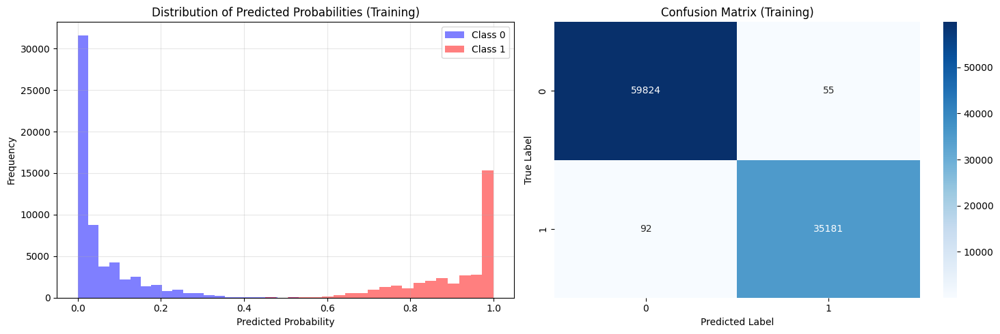

In [ ]:
# Visualize Training Results
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Predicted Probabilities Distribution
axes[0].hist(TrainingDataResults2[TrainingDataResults2[TargetVariable] == 0]['Probability'],
             bins=30, alpha=0.5, label='Class 0', color='blue')
axes[0].hist(TrainingDataResults2[TrainingDataResults2[TargetVariable] == 1]['Probability'],
             bins=30, alpha=0.5, label='Class 1', color='red')
axes[0].set_xlabel('Predicted Probability')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Predicted Probabilities (Training)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Confusion Matrix Heatmap
cm_train = metrics.confusion_matrix(y_train, TrainingPrediction2)
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', ax=axes[1])
axes[1].set_xlabel('Predicted Label')
axes[1].set_ylabel('True Label')
axes[1].set_title('Confusion Matrix (Training)')

plt.tight_layout()
plt.show()

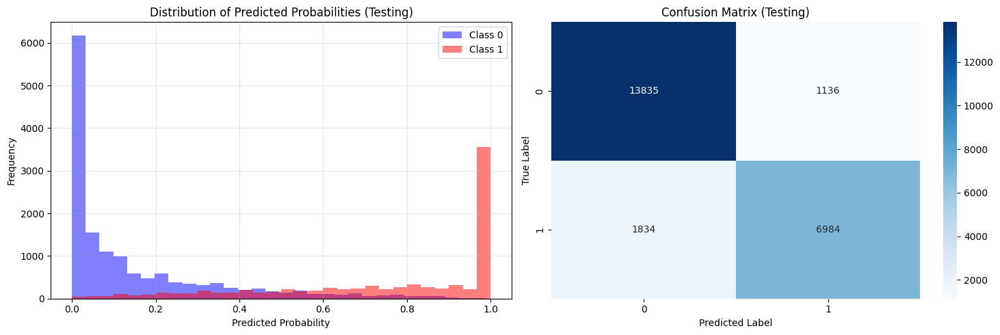

In [ ]:
# Visualize Testing Results
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Predicted Probabilities Distribution
axes[0].hist(TestingDataResults2[TestingDataResults2[TargetVariable] == 0]['Probability'],
             bins=30, alpha=0.5, label='Class 0', color='blue')
axes[0].hist(TestingDataResults2[TestingDataResults2[TargetVariable] == 1]['Probability'],
             bins=30, alpha=0.5, label='Class 1', color='red')
axes[0].set_xlabel('Predicted Probability')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Predicted Probabilities (Testing)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Confusion Matrix Heatmap
cm_test = metrics.confusion_matrix(y_test, TestingPrediction2)
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', ax=axes[1])
axes[1].set_xlabel('Predicted Label')
axes[1].set_ylabel('True Label')
axes[1].set_title('Confusion Matrix (Testing)')

plt.tight_layout()
plt.show()

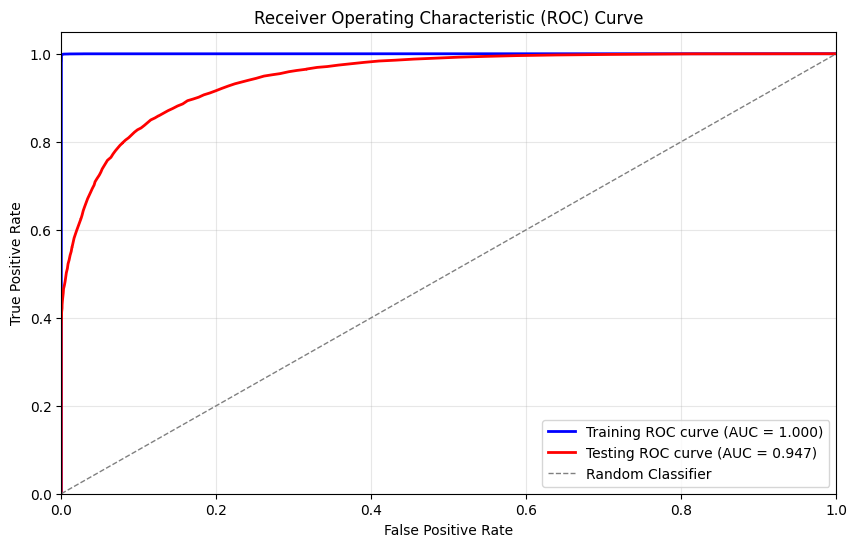

In [ ]:
# ROC Curve
from sklearn.metrics import roc_curve, auc

# Calculate ROC curve for Training data
fpr_train, tpr_train, _ = roc_curve(y_train, TrainingPredictionProba2)
roc_auc_train = auc(fpr_train, tpr_train)

# Calculate ROC curve for Testing data
fpr_test, tpr_test, _ = roc_curve(y_test, TestingPredictionProba2)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curves
plt.figure(figsize=(10, 6))
plt.plot(fpr_train, tpr_train, color='blue', lw=2,
         label=f'Training ROC curve (AUC = {roc_auc_train:.3f})')
plt.plot(fpr_test, tpr_test, color='red', lw=2,
         label=f'Testing ROC curve (AUC = {roc_auc_test:.3f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--', label='Random Classifier')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

--- 5 อันดับฟีเจอร์ที่มีผลต่อการทำนายมากที่สุด ---
                     Feature  Importance
0                  lead_time      0.1456
7                        adr      0.1022
76  deposit_type__Non Refund      0.0759
56              country__PRT      0.0668
75  deposit_type__No Deposit      0.0627


/tmp/ipython-input-3963663403.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=top_5_features, palette='viridis')


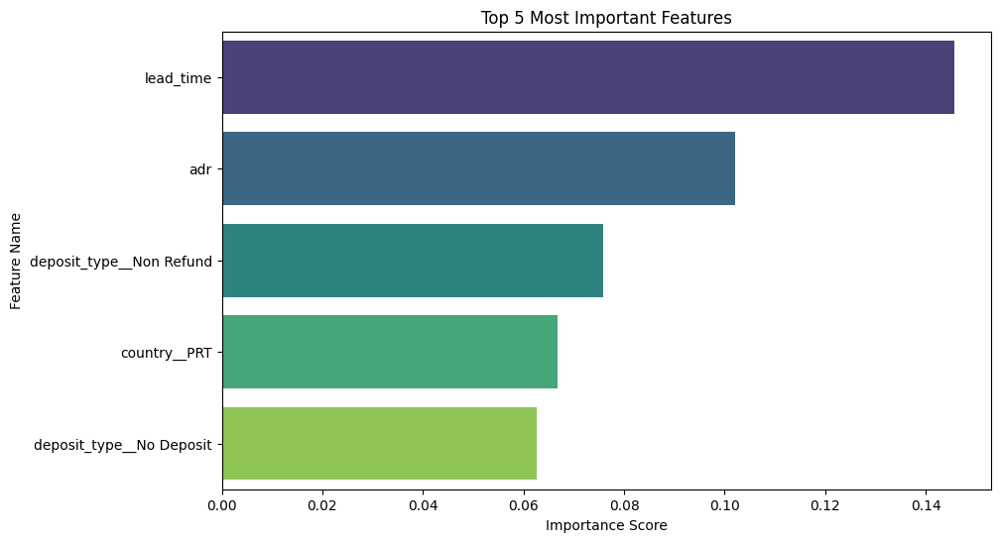

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

final_model = rf_model

feature_imp_df = pd.DataFrame({
    'Feature': X_train_encode.columns,
    'Importance': final_model.feature_importances_
})

# เรียงลำดับจากมากไปน้อย และตัดมาแค่ 5 อันดับแรก
top_5_features = feature_imp_df.sort_values(by='Importance', ascending=False).head(5)

# แสดงผลเป็นตัวเลข
print("--- 5 อันดับฟีเจอร์ที่มีผลต่อการทำนายมากที่สุด ---")
print(top_5_features)

plt.figure(figsize=(10, 6))
# ใช้ barplot วาดกราฟแนวนอน
sns.barplot(x='Importance', y='Feature', data=top_5_features, palette='viridis')

plt.title('Top 5 Most Important Features')
plt.xlabel('Importance Score')
plt.ylabel('Feature Name')
plt.show()

### **12.2.2 Random Forest with Hyperparameter Tuning**

In [ ]:
# let's print the shape of train and test
print("X_train shape", X_train_encode.shape)
print("y_train shape", y_train.shape)
print("X_test shape", X_test_encode.shape)
print("y_test shape", y_test.shape)

X_train shape (95152, 93)
y_train shape (95152,)
X_test shape (23789, 93)
y_test shape (23789,)


In [ ]:
# Separate Target Variable and Predictor Variables
TargetVariable = 'is_canceled'
Predictors = list(X_train_encode.columns)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
import numpy as np

# กำหนดช่วงค่าที่จะสุ่ม
param_dist = {
    'n_estimators': [100, 200],
    'max_depth': [15, 20, 25, 30, None],  # ให้โอกาสลึกได้ถึง 30 หรือไม่จำกัด
    'min_samples_split': [10, 20, 50],    # ข้อมูลเยอะ แตกกิ่งยากหน่อย
    'min_samples_leaf': [5, 10, 20],      # ใบไม้ต้องหนาหน่อย (ลด Overfit ดีมาก)
    'max_features': ['sqrt', 'log2']      # วิธีเลือก Feature ในแต่ละ Node
}

# สร้างโมเดล
rf = RandomForestClassifier(random_state=42)

# ใช้ RandomizedSearchCV
# n_iter=20 คือจะสุ่มลองแค่ 20 แบบ
rf_random = RandomizedSearchCV(estimator=rf, param_distributions=param_dist,
                               n_iter=20, cv=3, verbose=2, random_state=42, n_jobs=-1)

print("Starting hyperparameter tuning...")
rf_random.fit(X_train_encode, y_train)

print("\nBest Parameters:", rf_random.best_params_)
print("Best Score (CV):", rf_random.best_score_)

# เอาโมเดลที่ดีที่สุดไปใช้ต่อ
rf_model2 = rf_random.best_estimator_

Starting hyperparameter tuning...
Fitting 3 folds for each of 20 candidates, totalling 60 fits

Best Parameters: {'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'max_depth': None}
Best Score (CV): 0.8653312523601023


In [ ]:
# Printing some sample values of prediction
print("Training result prediction of Model")
TrainingPrediction3 = rf_model2.predict(X_train_encode)
TrainingPredictionProba3 = rf_model2.predict_proba(X_train_encode)[:, 1]

TrainingDataResults3 = pd.DataFrame(data=X_train_encode, columns=Predictors)
TrainingDataResults3[TargetVariable] = y_train.values
TrainingDataResults3[('Predicted' + TargetVariable)] = TrainingPrediction3
TrainingDataResults3[('Probability')] = TrainingPredictionProba3

# Printing sample prediction values
print(TrainingDataResults3.head())

Training result prediction of Model
   lead_time  stays_in_week_nights  adults  previous_cancellations  \
0     0.8232                1.3199  0.2931                 -0.1029   
1     1.7872               -0.2635  0.2931                 -0.1029   
2    -0.7118               -0.2635  0.2931                 -0.1029   
3    -0.6837                1.8477  0.2931                 -0.1029   
4     0.2803               -0.7913 -1.7986                 -0.1029   

   previous_bookings_not_canceled  booking_changes  days_in_waiting_list  \
0                         -0.0905          -0.3516               -0.1321   
1                         -0.0905          -0.3516               -0.1321   
2                         -0.0905          -0.3516               -0.1321   
3                         -0.0905          -0.3516               -0.1321   
4                         -0.0905          -0.3516               -0.1321   

      adr  required_car_parking_spaces  total_of_special_requests  ...  \
0 -1.1425   

In [ ]:
# Printing some sample values of prediction
print("Testing result prediction of Model")
TestingPrediction3 = rf_model2.predict(X_test_encode)
TestingPredictionProba3 = rf_model2.predict_proba(X_test_encode)[:, 1]

TestingDataResults3 = pd.DataFrame(data=X_test_encode, columns=Predictors)
TestingDataResults3[TargetVariable] = y_test.values
TestingDataResults3[('Predicted' + TargetVariable)] = TestingPrediction3
TestingDataResults3[('Probability')] = TestingPredictionProba3

# Printing sample prediction values
print(TestingDataResults3.head())

Testing result prediction of Model
   lead_time  stays_in_week_nights  adults  previous_cancellations  \
0    -0.9552               -0.7913  0.2931                 -0.1029   
1     0.0838                0.2643  0.2931                  6.8506   
2    -0.9739               -0.2635 -1.7986                 -0.1029   
3     0.3645               -0.2635  0.2931                 -0.1029   
4     0.5611               -0.2635  0.2931                 -0.1029   

   previous_bookings_not_canceled  booking_changes  days_in_waiting_list  \
0                         -0.0905          -0.3516               -0.1321   
1                         -0.0905          -0.3516                2.3901   
2                         -0.0905          -0.3516               -0.1321   
3                         -0.0905          -0.3516               -0.1321   
4                         -0.0905          -0.3516               -0.1321   

      adr  required_car_parking_spaces  total_of_special_requests  ...  \
0  1.7295    

In [ ]:
# Evaluation Metrics
from sklearn import metrics

# Classification Metrics for Training data
print('=== Training Data Metrics ===')
print('Accuracy Score:', metrics.accuracy_score(y_train, TrainingPrediction3))
print('Precision Score:', metrics.precision_score(y_train, TrainingPrediction3))
print('Recall Score:', metrics.recall_score(y_train, TrainingPrediction3))
print('F1 Score:', metrics.f1_score(y_train, TrainingPrediction3))
print('ROC AUC Score:', metrics.roc_auc_score(y_train, TrainingPredictionProba3))

=== Training Data Metrics ===
Accuracy Score: 0.8898499243315957
Precision Score: 0.8935487967489999
Recall Score: 0.7979190882544722
F1 Score: 0.8430306570217609
ROC AUC Score: 0.9648069412695108


In [ ]:
# Confusion Matrix for Training data
print('Confusion Matrix (Training):')
print(metrics.confusion_matrix(y_train, TrainingPrediction3))

# Classification Report for Training data
print('\nClassification Report (Training):')
print(metrics.classification_report(y_train, TrainingPrediction3))

Confusion Matrix (Training):
[[56526  3353]
 [ 7128 28145]]

Classification Report (Training):
              precision    recall  f1-score   support

           0       0.89      0.94      0.92     59879
           1       0.89      0.80      0.84     35273

    accuracy                           0.89     95152
   macro avg       0.89      0.87      0.88     95152
weighted avg       0.89      0.89      0.89     95152



In [ ]:
# Classification Metrics for Testing data
print('=== Testing Data Metrics ===')
print('Accuracy Score:', metrics.accuracy_score(y_test, TestingPrediction3))
print('Precision Score:', metrics.precision_score(y_test, TestingPrediction3))
print('Recall Score:', metrics.recall_score(y_test, TestingPrediction3))
print('F1 Score:', metrics.f1_score(y_test, TestingPrediction3))
print('ROC AUC Score:', metrics.roc_auc_score(y_test, TestingPredictionProba3))

=== Testing Data Metrics ===
Accuracy Score: 0.87166337382824
Precision Score: 0.8694092015891324
Recall Score: 0.7693354502154683
F1 Score: 0.8163167077793153
ROC AUC Score: 0.9458847019562536


In [ ]:
# Confusion Matrix for Testing data
print('Confusion Matrix (Testing):')
print(metrics.confusion_matrix(y_test, TestingPrediction3))

# Classification Report for Testing data
print('\nClassification Report (Testing):')
print(metrics.classification_report(y_test, TestingPrediction3))

Confusion Matrix (Testing):
[[13952  1019]
 [ 2034  6784]]

Classification Report (Testing):
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     14971
           1       0.87      0.77      0.82      8818

    accuracy                           0.87     23789
   macro avg       0.87      0.85      0.86     23789
weighted avg       0.87      0.87      0.87     23789



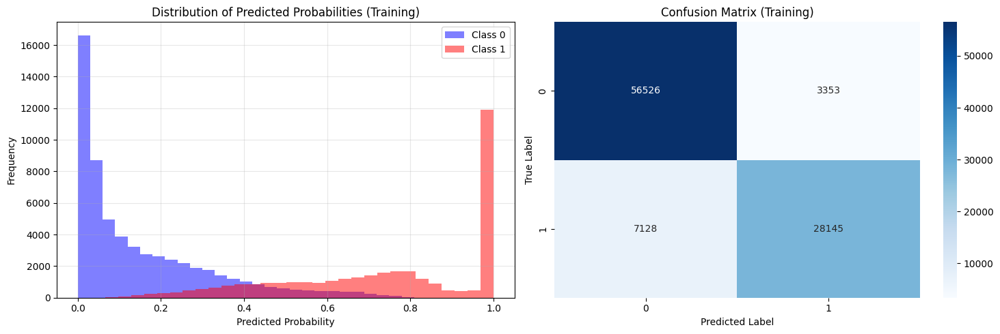

In [ ]:
# Visualize Training Results
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Predicted Probabilities Distribution
axes[0].hist(TrainingDataResults3[TrainingDataResults3[TargetVariable] == 0]['Probability'],
             bins=30, alpha=0.5, label='Class 0', color='blue')
axes[0].hist(TrainingDataResults3[TrainingDataResults3[TargetVariable] == 1]['Probability'],
             bins=30, alpha=0.5, label='Class 1', color='red')
axes[0].set_xlabel('Predicted Probability')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Predicted Probabilities (Training)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Confusion Matrix Heatmap
cm_train = metrics.confusion_matrix(y_train, TrainingPrediction3)
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', ax=axes[1])
axes[1].set_xlabel('Predicted Label')
axes[1].set_ylabel('True Label')
axes[1].set_title('Confusion Matrix (Training)')

plt.tight_layout()
plt.show()

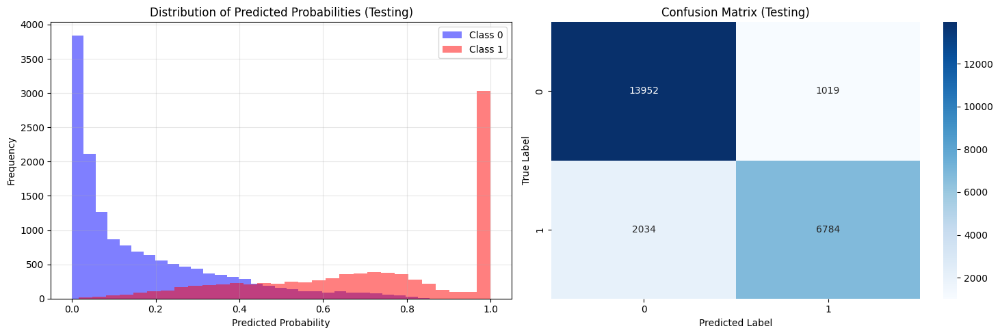

In [ ]:
# Visualize Testing Results
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Predicted Probabilities Distribution
axes[0].hist(TestingDataResults3[TestingDataResults3[TargetVariable] == 0]['Probability'],
             bins=30, alpha=0.5, label='Class 0', color='blue')
axes[0].hist(TestingDataResults3[TestingDataResults3[TargetVariable] == 1]['Probability'],
             bins=30, alpha=0.5, label='Class 1', color='red')
axes[0].set_xlabel('Predicted Probability')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Predicted Probabilities (Testing)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Confusion Matrix Heatmap
cm_test = metrics.confusion_matrix(y_test, TestingPrediction3)
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', ax=axes[1])
axes[1].set_xlabel('Predicted Label')
axes[1].set_ylabel('True Label')
axes[1].set_title('Confusion Matrix (Testing)')

plt.tight_layout()
plt.show()

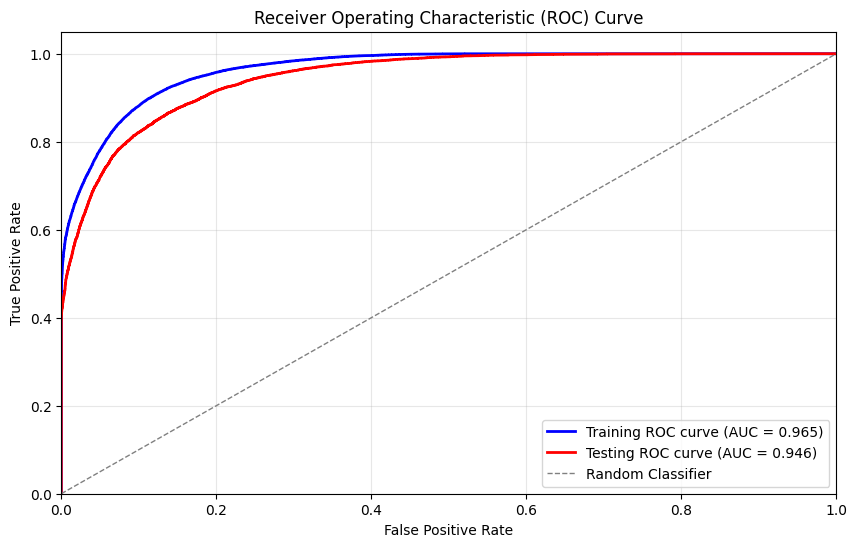

In [ ]:
# ROC Curve
from sklearn.metrics import roc_curve, auc

# Calculate ROC curve for Training data
fpr_train, tpr_train, _ = roc_curve(y_train, TrainingPredictionProba3)
roc_auc_train = auc(fpr_train, tpr_train)

# Calculate ROC curve for Testing data
fpr_test, tpr_test, _ = roc_curve(y_test, TestingPredictionProba3)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curves
plt.figure(figsize=(10, 6))
plt.plot(fpr_train, tpr_train, color='blue', lw=2,
         label=f'Training ROC curve (AUC = {roc_auc_train:.3f})')
plt.plot(fpr_test, tpr_test, color='red', lw=2,
         label=f'Testing ROC curve (AUC = {roc_auc_test:.3f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--', label='Random Classifier')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

--- 5 อันดับฟีเจอร์ที่มีผลต่อการทำนายมากที่สุด ---
                      Feature  Importance
76   deposit_type__Non Refund      0.1181
75   deposit_type__No Deposit      0.1131
0                   lead_time      0.1062
56               country__PRT      0.1011
9   total_of_special_requests      0.0695


/tmp/ipython-input-2715098511.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=top_5_features, palette='viridis')


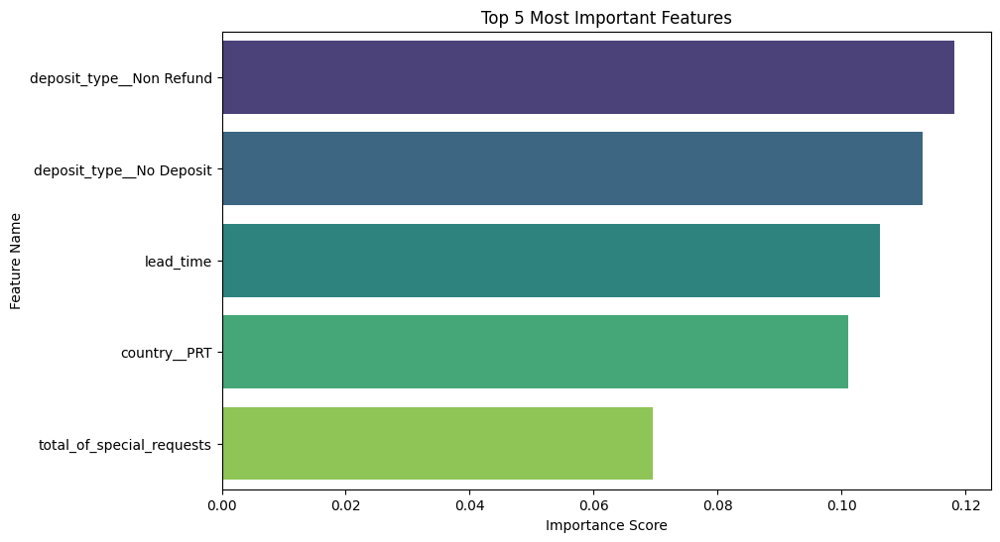

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

final_model = rf_model2

feature_imp_df = pd.DataFrame({
    'Feature': X_train_encode.columns,
    'Importance': final_model.feature_importances_
})

# เรียงลำดับจากมากไปน้อย และตัดมาแค่ 5 อันดับแรก
top_5_features = feature_imp_df.sort_values(by='Importance', ascending=False).head(5)

# แสดงผลเป็นตัวเลข
print("--- 5 อันดับฟีเจอร์ที่มีผลต่อการทำนายมากที่สุด ---")
print(top_5_features)

plt.figure(figsize=(10, 6))
# ใช้ barplot วาดกราฟแนวนอน
sns.barplot(x='Importance', y='Feature', data=top_5_features, palette='viridis')

plt.title('Top 5 Most Important Features')
plt.xlabel('Importance Score')
plt.ylabel('Feature Name')
plt.show()

### **12.2.3 Random Forest Model Summary**

**สรุปผลการเปรียบเทียบประสิทธิภาพโมเดล Random Forest**

1. ภาพรวมการทดลอง การทดลองนี้มีวัตถุประสงค์เพื่อสร้างและเปรียบเทียบประสิทธิภาพของโมเดล Machine Learning ประเภท Random Forest โดยแบ่งการทดลองออกเป็น 2 กรณี ได้แก่
    - โมเดลที่ใช้ค่าเริ่มต้น (Default Parameters): ไม่มีการจำกัดความลึกของต้นไม้
    - โมเดลที่ปรับจูนค่าพารามิเตอร์ (Hyperparameter Tuning): มีการจำกัดความลึกและกำหนดจำนวนข้อมูลขั้นต่ำใน Node เพื่อลดความซับซ้อนของโมเดล (Best Parameters: 'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'max_depth': None)

2. การวิเคราะห์ประสิทธิภาพและการเกิด Overfitting จากการเปรียบเทียบผลลัพธ์ระหว่าง Training Dataset และ Testing Dataset พบความแตกต่างดังนี้

    - กรณีที่ 1: โมเดลที่กำหนดค่าเริ่มต้น (Default)
      - ผลการทดสอบ: แสดงค่าความแม่นยำ (Accuracy) ในชุดข้อมูล Training สูงถึง 99.85% แต่ลดลงเหลือ 87.52% ในชุดข้อมูล Testing
      - การวิเคราะห์: พบความต่างของคะแนน (Gap) ระหว่าง Training และ Testing สูงถึง ~12.3% ซึ่งบ่งชี้ถึงภาวะ Overfitting อย่างชัดเจน โดยโมเดลมีการจดจำข้อมูลที่ละเอียดเกินความจำเป็น ทำให้ขาดความยืดหยุ่นเมื่อนำไปใช้กับข้อมูลใหม่

    - กรณีที่ 2: โมเดลที่ปรับจูนค่าพารามิเตอร์ (Tuned Model)
      - ผลการทดสอบ: แสดงค่าความแม่นยำในชุดข้อมูล Training ที่ 88.98% และชุดข้อมูล Testing ที่ 87.17%
      - การวิเคราะห์: แม้ค่าความแม่นยำรวมจะลดลงเล็กน้อย แต่ช่องว่างระหว่าง Training และ Testing ลดลงเหลือเพียง ~1.8% แสดงให้เห็นว่าโมเดลมีความเสถียร (Stability) และสามารถอธิบายรูปแบบของข้อมูลทั่วไปได้ดีกว่า (Better Generalization) เหมาะสมสำหรับการนำไปใช้งานจริง

    **ตารางเปรียบเทียบประสิทธิภาพโมเดล (Performance Comparison)**
    | ตัวชี้วัด (Metrics) | Model 1: ค่าเริ่มต้น (Default) | Model 2: ปรับจูนแล้ว (Tuned) | การเปลี่ยนแปลง (Diff) |
    | :--- | :---: | :---: | :--- |
    | **Accuracy** | 0.8752 | 0.8717 | -0.0035 |
    | **Precision** | 0.8601 | **0.8694** | **+0.0093** (ดีขึ้น) |
    | **Recall** | **0.7920** | 0.7693 | -0.0227 |
    | **F1-Score** | 0.8247 | 0.8163 | -0.0084 |
    | **ROC AUC** | **0.9468** | 0.9459 | -0.0009 |

    **ตารางวิเคราะห์ Overfitting (Training vs Testing)**
    | โมเดล (Model) | Accuracy (Training) | Accuracy (Testing) | **ส่วนต่าง (Gap)** | สถานะ (Status) |
    | :--- | :---: | :---: | :---: | :--- |
    | **1. Default Model** | 99.85% | 87.52% | **12.33%** | <font color="red">**High Overfitting**</font> |
    | **2. Tuned Model** | 88.98% | 87.17% | **1.81%** | <font color="green">**Good Fit (Stable)**</font> |

3. การวิเคราะห์ปัจจัยที่มีอิทธิพลต่อโมเดล (Feature Importance) การปรับจูนโมเดลส่งผลให้ลำดับความสำคัญของตัวแปรเปลี่ยนไปในทิศทางที่สอดคล้องกับตรรกะทางธุรกิจมากขึ้น
    - โมเดล Default: ให้ความสำคัญกับตัวแปร lead_time (ระยะเวลาจองล่วงหน้า) มากที่สุด ซึ่งเป็นตัวแปรต่อเนื่องที่มีความละเอียดสูงและเสี่ยงต่อการเกิด Noise
    - โมเดล Tuned: ปรับเปลี่ยนมาให้ความสำคัญกับตัวแปร Categorical ที่มีนัยสำคัญทางธุรกิจสูงสุด 5 อันดับแรก ได้แก่
      - deposit_type_Non Refund: การชำระเงินมัดจำแบบไม่คืนเงิน (เป็นปัจจัยชี้วัดความตั้งใจของลูกค้าได้ดีที่สุด)
      - deposit_type_No Deposit: การไม่มีเงินมัดจำ
      - lead_time: ระยะเวลาจองล่วงหน้า
      - country_PRT: กลุ่มลูกค้าจากประเทศโปรตุเกส
      - total_of_special_requests: จำนวนคำขอพิเศษ

4. จากการวิเคราะห์เชิงลึก ขอเสนอแนะให้เลือกใช้ โมเดลที่ผ่านการปรับจูนค่าพารามิเตอร์ (Tuned Model) เป็นโมเดลสุดท้าย เนื่องจาก
    - ลดความเสี่ยง: สามารถแก้ไขปัญหา Overfitting ได้อย่างสมบูรณ์ ทำให้มั่นใจได้ว่าโมเดลจะยังคงประสิทธิภาพดีเมื่อนำไปใช้กับข้อมูลในอนาคต
    - ความน่าเชื่อถือ: ตัวแปรสำคัญที่โมเดลเลือกใช้ (เช่น ประเภทเงินมัดจำ) มีความสอดคล้องกับเหตุผลทางธุรกิจ (Business Logic) มากกว่าการพึ่งพาตัวแปรที่มีความผันผวนสูงเพียงอย่างเดียว
    - ความเสถียร: ค่า AUC Score ที่ระดับ 0.946 ในชุดข้อมูล Testing ยืนยันว่าโมเดลมีประสิทธิภาพในการจำแนกข้อมูลอยู่ในเกณฑ์ดีมาก

**Error Analysis**

Model Evaluation: Error Analysis
------------------------------
CONFUSION MATRIX BREAKDOWN:
   • True Negatives (TN):  13,952 - Predicted 'Not Canceled' & Actual 'Stayed' (Correct)
   • False Positives (FP): 1,019 - Predicted 'Canceled' & Actual 'Stayed' (Lost Revenue Opportunity)
   • False Negatives (FN): 2,034 - Predicted 'Not Canceled' & Actual 'Canceled' (Inventory Spoilage) ⚠️
   • True Positives (TP):  6,784 - Predicted 'Canceled' & Actual 'Canceled' (Correctly Identified)

PERFORMANCE METRICS:
   • Accuracy:             87.2% - Overall Accuracy
   • Recall (Sensitivity): 76.9% - Ability to capture 'Cancellations' (Higher is better)
   • Specificity:          93.2% - Ability to identify 'Safe' bookings
   • Precision:            86.9% - Reliability of 'Cancellation' prediction

ERROR DISTRIBUTION:
   • Total Errors: 3,053 (12.8%)
   • False Positives: 1,019 (4.3%) -> Type I Error
     → Avg Confidence: 0.634
   • False Negatives: 2,034 (8.6%) -> Type II Error ⚠️ HIGH RISK
     →

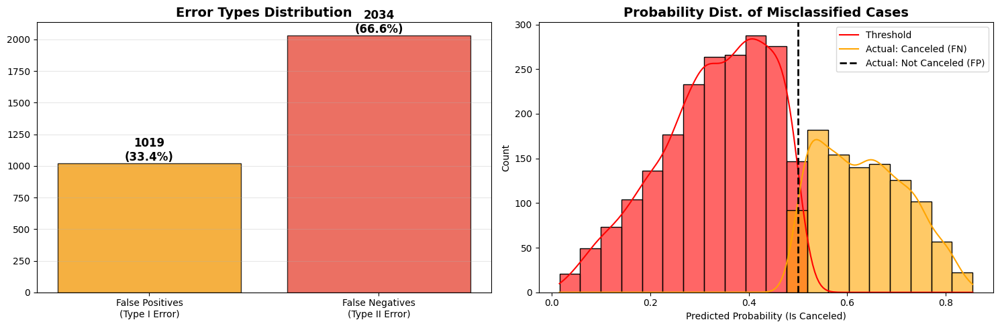

In [ ]:
# --- Confusion Matrix Analysis ---
tn, fp, fn, tp = metrics.confusion_matrix(y_test, TestingPrediction3).ravel()

print('Model Evaluation: Error Analysis')
print("-" * 30)
print(f"CONFUSION MATRIX BREAKDOWN:")
print(f"   • True Negatives (TN):  {tn:,} - Predicted 'Not Canceled' & Actual 'Stayed' (Correct)")
print(f"   • False Positives (FP): {fp:,} - Predicted 'Canceled' & Actual 'Stayed' (Lost Revenue Opportunity)")
print(f"   • False Negatives (FN): {fn:,} - Predicted 'Not Canceled' & Actual 'Canceled' (Inventory Spoilage) ⚠️")
print(f"   • True Positives (TP):  {tp:,} - Predicted 'Canceled' & Actual 'Canceled' (Correctly Identified)")

# --- Business Implications ---
accuracy = (tp + tn) / (tp + tn + fp + fn)
recall = tp / (tp + fn)
specificity = tn / (tn + fp)
precision = tp / (tp + fp) if (tp + fp) > 0 else 0

print(f"\nPERFORMANCE METRICS:")
print(f"   • Accuracy:             {accuracy:.1%} - Overall Accuracy")
print(f"   • Recall (Sensitivity): {recall:.1%} - Ability to capture 'Cancellations' (Higher is better)")
print(f"   • Specificity:          {specificity:.1%} - Ability to identify 'Safe' bookings")
print(f"   • Precision:            {precision:.1%} - Reliability of 'Cancellation' prediction")

# --- Analyze Misclassified Cases ---
test_misclassified = TestingDataResults3[
    TestingDataResults3[TargetVariable] != TestingDataResults3['Predicted' + TargetVariable]
]

false_positives = TestingDataResults3[
    (TestingDataResults3[TargetVariable] == 0) &
    (TestingDataResults3['Predicted' + TargetVariable] == 1)
]

false_negatives = TestingDataResults3[
    (TestingDataResults3[TargetVariable] == 1) &
    (TestingDataResults3['Predicted' + TargetVariable] == 0)
]

print(f"\nERROR DISTRIBUTION:")
print(f"   • Total Errors: {len(test_misclassified):,} ({len(test_misclassified)/len(TestingDataResults3)*100:.1f}%)")
print(f"   • False Positives: {len(false_positives):,} ({len(false_positives)/len(TestingDataResults3)*100:.1f}%) -> Type I Error")
print(f"     → Avg Confidence: {false_positives['Probability'].mean():.3f}")
print(f"   • False Negatives: {len(false_negatives):,} ({len(false_negatives)/len(TestingDataResults3)*100:.1f}%) -> Type II Error ⚠️ HIGH RISK")
print(f"     → Avg Confidence: {false_negatives['Probability'].mean():.3f}")

# --- Probability Distribution Analysis ---
print(f"\nMISCLASSIFICATION PROBABILITY DISTRIBUTION (Confidence in Errors):")
prob_ranges = [
    (0.0, 0.3, "Very Low"),
    (0.3, 0.45, "Low"),
    (0.45, 0.55, "Uncertain (Borderline)"),
    (0.55, 0.7, "High"),
    (0.7, 1.0, "Very High (High Confidence Error)")
]

for low, high, label in prob_ranges:
    count_fn = len(false_negatives[
        (false_negatives['Probability'] >= low) & (false_negatives['Probability'] < high)
    ])
    count_fp = len(false_positives[
        (false_positives['Probability'] >= low) & (false_positives['Probability'] < high)
    ])

    if count_fn > 0: print(f"   • FN {label} ({low}-{high}): {count_fn} cases")
    if count_fp > 0: print(f"   • FP {label} ({low}-{high}): {count_fp} cases")

# --- Model Limitations ---
print(f"\nIDENTIFIED MODEL LIMITATIONS (Random Forest):")
print("""
1. EXTRAPOLATION ISSUES:
   - Random Forest cannot predict well for values outside the training range.
   - If 'lead_time' in future data is higher than historical max, predictions will be unreliable.

2. BIASED TOWARDS CATEGORICAL VARIABLES:
   - Features with many categories (High Cardinality) like 'country' or 'agent' might be artificially favored.

3. BLACK BOX NATURE:
   - While accurate, it's harder to explain 'why' a specific booking was flagged compared to Logistic Regression.
""")

# --- Visualization ---
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Error Types
error_types = ['False Positives\n(Type I Error)', 'False Negatives\n(Type II Error)']
error_counts = [len(false_positives), len(false_negatives)]
colors = ['#f39c12', '#e74c3c']
bars = axes[0].bar(error_types, error_counts, color=colors, edgecolor='black', alpha=0.8)
axes[0].set_title('Error Types Distribution', fontsize=14, fontweight='bold')
axes[0].grid(True, alpha=0.3, axis='y')

for bar, count in zip(bars, error_counts):
    axes[0].text(bar.get_x() + bar.get_width()/2., bar.get_height(),
                f'{count}\n({count/len(test_misclassified)*100:.1f}%)',
                ha='center', va='bottom', fontsize=12, fontweight='bold')

# Plot 2: Probability Distribution
sns.histplot(data=test_misclassified, x='Probability', hue=TargetVariable,
             bins=20, alpha=0.6, ax=axes[1], kde=True, palette={0: 'orange', 1: 'red'})
axes[1].axvline(x=0.5, color='black', linestyle='--', linewidth=2, label='Threshold 0.5')
axes[1].set_title('Probability Dist. of Misclassified Cases', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Predicted Probability (Is Canceled)')
axes[1].legend(['Threshold', 'Actual: Canceled (FN)', 'Actual: Not Canceled (FP)'])

plt.tight_layout()
plt.show()

**Error Analysis Summary**

โมเดล Random Forest จัดอยู่ในกลุ่ม "High Performance Model" ด้วยความแม่นยำที่สูงถึง 87.2% พฤติกรรมของโมเดลนี้มีลักษณะ "ระมัดระวังและแม่นยำ" (Conservative & Precise) โดยมีความโดดเด่นในการระบุลูกค้าที่จะ "เข้าพักจริง" ได้อย่างยอดเยี่ยม (Specificity สูงถึง 93.2%) ทำให้เกิด False Positive ต่ำมาก แต่ในทางกลับกัน โมเดลมีแนวโน้มที่จะ "มองโลกในแง่ดีเกินไป" (Optimistic) ทำให้พลาดการดักจับเคสยกเลิก (False Negatives) ไปพอสมควร

1. การเจาะลึกข้อผิดพลาด (Error Deep Dive)

    จากการวิเคราะห์เคสที่ทายผิดจำนวน 3,053 เคส พบการเปลี่ยนแปลงของรูปแบบข้อผิดพลาดดังนี้:
    - ปัญหาหลัก: "ตามไม่ทัน/มองโลกในแง่ดี" (False Negatives)
    จำนวน: 2,034 เคส (8.6% ของข้อมูลทั้งหมด)
      - สถานการณ์: โมเดลทายว่า "ไม่ยกเลิก" (ลูกค้าจะมา) แต่จริง ๆ แล้วลูกค้า "ดันยกเลิก"
      - ความมั่นใจ: ค่าเฉลี่ยความมั่นใจต่ำ (0.331) แสดงว่าโมเดลมองไม่เห็นสัญญาณอันตรายใด ๆ ในข้อมูลกลุ่มนี้เลย คิดว่าเป็นลูกค้าชั้นดี
      - ผลกระทบทางธุรกิจ: Inventory Spoilage เตรียมห้องเก้อ และเสียโอกาสในการนำห้องไปขายต่อ (เพราะคิดว่าลูกค้าจะมาแน่ ๆ)

    - ปัญหารอง: "ความผิดพลาดส่วนน้อย" (False Positives)
    จำนวน: 1,019 เคส (4.3% ของข้อมูลทั้งหมด)
      - สถานการณ์: โมเดลทายว่า "จะยกเลิก" แต่ลูกค้า "มาพักจริง"
      - ผลกระทบทางธุรกิจ: ความเสี่ยงเรื่อง Overbooking ต่ำมาก โมเดลนี้ช่วยรักษาฐานลูกค้าได้ดี เพราะไม่ค่อยไล่ลูกค้าด้วยการทำนายผิด ๆ

2. การวิเคราะห์สาเหตุ (Root Cause Analysis)

    สาเหตุที่ Random Forest มีพฤติกรรมเช่นนี้ เนื่องจากข้อจำกัดและลักษณะเฉพาะของอัลกอริทึม:
    - ข้อจำกัดเรื่องการพยากรณ์นอกกรอบ (Extrapolation Issues): Random Forest ไม่สามารถทำนายค่าที่ "เกินกว่า" สิ่งที่เคยเห็นในตอนเทรนได้ (เช่น ถ้าเจอ lead_time ที่นานกว่าสถิติสูงสุดในอดีต โมเดลอาจจะทายผิดทันที) ทำให้เกิด Error ในกลุ่มลูกค้าที่มีพฤติกรรมสุดโต่ง
    - ความซับซ้อนแบบกล่องดำ (Black Box Nature): แม้จะแม่นยำ แต่การตัดสินใจของโมเดลซับซ้อนกว่า Linear Model มาก บางครั้งโมเดลอาจไปยึดติดกับ Pattern ย่อย ๆ (Overfitting ในบางกิ่ง) จนมองข้ามสัญญาณการยกเลิกแบบกว้าง ๆ ทำให้ค่า Recall ต่ำลง

## **12.3 K-Nearest Neighbors (K-NN)**

### **12.3.1 K-Nearest Neighbors (K-NN) with Hyperparameter Tuning**

In [ ]:
# let's print the shape of train and test again
print("X_train shape", X_train_encode.shape)
print("y_train shape", y_train.shape)
print("X_test shape", X_test_encode.shape)
print("y_test shape", y_test.shape)

X_train shape (95152, 93)
y_train shape (95152,)
X_test shape (23789, 93)
y_test shape (23789,)


In [ ]:
# Separate Target Variable and Predictor Variables
TargetVariable = 'is_canceled'
Predictors = list(X_train_encode.columns)

k= 1, F1 Score (CV Avg): 0.7438
k= 3, F1 Score (CV Avg): 0.7651
k= 5, F1 Score (CV Avg): 0.7724
k= 7, F1 Score (CV Avg): 0.7764
k=11, F1 Score (CV Avg): 0.7803
k=17, F1 Score (CV Avg): 0.7825
k=21, F1 Score (CV Avg): 0.7824
k=39, F1 Score (CV Avg): 0.7779
k=41, F1 Score (CV Avg): 0.7772
k=51, F1 Score (CV Avg): 0.7755

--- สรุปผลการหา Optimal k ---
K ที่ให้ F1 Score สูงสุด: k=17 (F1 CV Score: 0.7825)
K ที่ให้ F1 Score ต่ำสุด: k=1 (F1 CV Score: 0.7438)


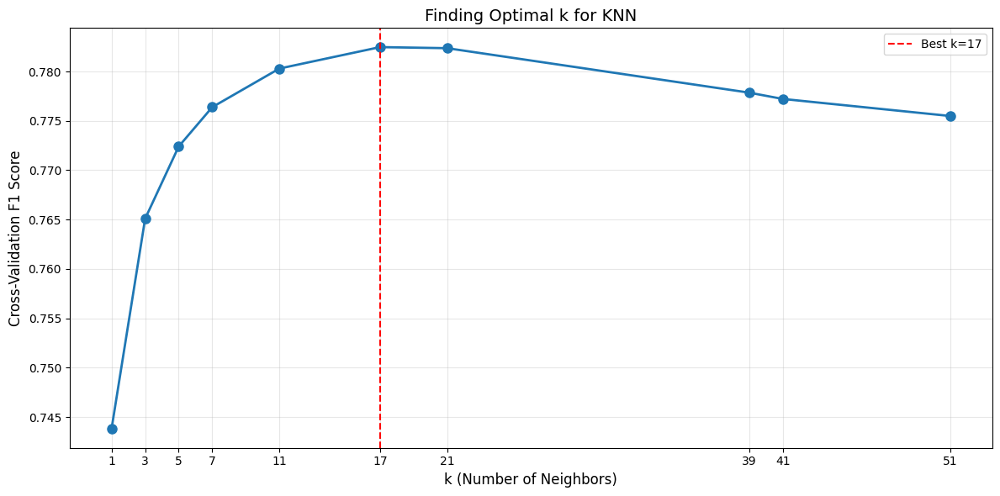

A. Training Model (Best F1) with k=17...
B. Training Model (Worst F1) with k=1...

===== Model A: K-Best_F1 (k=17) Metrics on TEST SET =====
Accuracy : 0.8466
F1 Score : 0.7854
Recall   : 0.7577
ROC AUC  : 0.9207

===== Model B: K-Worst_F1 (k=1) Metrics on TEST SET =====
Accuracy : 0.8118
F1 Score : 0.7497
Recall   : 0.7606
ROC AUC  : 0.8012
Choose Model A (k=17)
ROC AUC = 0.9207


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score

# Optimal K by use Cross-Validation
k_values = [1, 3, 5, 7, 11, 17, 21, 39, 41, 51]
scores = []

for k in k_values:
    # ใช้วิธีการเลือก k จากค่าเฉลี่ย F1 Score
    knn = KNeighborsClassifier(n_neighbors=k)
    # ใช้ X_train_encode (แนะนำให้ใช้ X_train_scaled ถ้าได้ทำ Scaling แล้ว)
    score = cross_val_score(knn, X_train_encode, y_train, cv=5, scoring='f1')
    scores.append(np.mean(score))
    print(f"k={k:2d}, F1 Score (CV Avg): {np.mean(score):.4f}")

# หา k ที่ให้ F1 Score สูงสุดและต่ำสุด
idx_max = np.argmax(scores)
idx_min = np.argmin(scores)

k_best_f1 = k_values[idx_max]
score_best_f1 = scores[idx_max]

k_worst_f1 = k_values[idx_min]
score_worst_f1 = scores[idx_min]

print("\n--- สรุปผลการหา Optimal k ---")
print(f"K ที่ให้ F1 Score สูงสุด: k={k_best_f1} (F1 CV Score: {score_best_f1:.4f})")
print(f"K ที่ให้ F1 Score ต่ำสุด: k={k_worst_f1} (F1 CV Score: {score_worst_f1:.4f})")

# Plot ผลลัพธ์
plt.figure(figsize=(12, 6))
plt.plot(k_values, scores, marker='o', linewidth=2, markersize=8)
plt.xlabel('k (Number of Neighbors)', fontsize=12)
plt.ylabel('Cross-Validation F1 Score', fontsize=12)
plt.title('Finding Optimal k for KNN', fontsize=14)
plt.axvline(x=k_best_f1, color='red', linestyle='--', label=f'Best k={k_best_f1}')
plt.xticks(k_values)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Evaluation
def evaluate_model(model, X_test, y_test, model_name):
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]

    accuracy = metrics.accuracy_score(y_test, y_pred)
    f1 = metrics.f1_score(y_test, y_pred)
    roc_auc = metrics.roc_auc_score(y_test, y_proba)
    recall = metrics.recall_score(y_test, y_pred)

    print(f"\n===== {model_name} (k={model.n_neighbors}) Metrics on TEST SET =====")
    print(f"Accuracy : {accuracy:.4f}")
    print(f"F1 Score : {f1:.4f}")
    print(f"Recall   : {recall:.4f}")
    print(f"ROC AUC  : {roc_auc:.4f}")
    return {'f1': f1, 'auc': roc_auc, 'k': model.n_neighbors}

# Train และประเมินโมเดล 2 ตัว (Best k และ Worst k)
# โมเดล A: K ที่ดีที่สุด (อ้างอิงจาก CV F1 Score)
model_A = KNeighborsClassifier(n_neighbors=k_best_f1, metric='minkowski', weights='uniform')
print(f"A. Training Model (Best F1) with k={k_best_f1}...")
model_A.fit(X_train_encode, y_train)

# โมเดล B: K ที่แย่ที่สุด (อ้างอิงจาก CV F1 Score)
model_B = KNeighborsClassifier(n_neighbors=k_worst_f1, metric='minkowski', weights='uniform')
print(f"B. Training Model (Worst F1) with k={k_worst_f1}...")
model_B.fit(X_train_encode, y_train)


# ประเมินผลลัพธ์บน Testing Set
metrics_A = evaluate_model(model_A, X_test_encode, y_test, "Model A: K-Best_F1")
metrics_B = evaluate_model(model_B, X_test_encode, y_test, "Model B: K-Worst_F1")

# Conclude
# ใช้ ROC AUC เป็นเกณฑ์หลักในการเลือกโมเดลสุดท้าย
if metrics_A['auc'] > metrics_B['auc']:
    final_model_metrics = metrics_A
    print(f"Choose Model A (k={final_model_metrics['k']})")
else:
    final_model_metrics = metrics_B
    print(f"Choose Model B (k={final_model_metrics['k']})")

print(f"ROC AUC = {final_model_metrics['auc']:.4f}")

In [ ]:
knn = KNeighborsClassifier(
    n_neighbors=final_model_metrics['k'],
    metric='minkowski',  # euclidean distance - เหมาะกับ numerical data
    weights='uniform'
)

print("\nModel specification for Final Selected Model:")
print(f"Final k selected: {final_model_metrics['k']}")
print(knn)


Model specification for Final Selected Model:
Final k selected: 17
KNeighborsClassifier(n_neighbors=17)


In [ ]:
# Fit the final model
knn.fit(X_train_encode, y_train)

KNeighborsClassifier(n_neighbors=17)

In [ ]:
print("Model training completed")
print(f"Number of features: {X_train_encode.shape[1]}")
print(f"Number of neighbors (K): {knn.n_neighbors}")

Model training completed
Number of features: 93
Number of neighbors (K): 17


In [ ]:
# Printing some sample values of prediction
print("Training result prediction of Model")
TrainingPrediction4 = knn.predict(X_train_encode)
TrainingPredictionProba4 = knn.predict_proba(X_train_encode)[:, 1]

TrainingDataResults = pd.DataFrame(data=X_train_encode, columns=Predictors)
TrainingDataResults[TargetVariable] = y_train
TrainingDataResults['Predicted' + TargetVariable] = TrainingPrediction4
TrainingDataResults['Probability'] = TrainingPredictionProba4

# Printing sample prediction values
print(TrainingDataResults.head())

Training result prediction of Model
   lead_time  stays_in_week_nights  adults  previous_cancellations  \
0     0.8232                1.3199  0.2931                 -0.1029   
1     1.7872               -0.2635  0.2931                 -0.1029   
2    -0.7118               -0.2635  0.2931                 -0.1029   
3    -0.6837                1.8477  0.2931                 -0.1029   
4     0.2803               -0.7913 -1.7986                 -0.1029   

   previous_bookings_not_canceled  booking_changes  days_in_waiting_list  \
0                         -0.0905          -0.3516               -0.1321   
1                         -0.0905          -0.3516               -0.1321   
2                         -0.0905          -0.3516               -0.1321   
3                         -0.0905          -0.3516               -0.1321   
4                         -0.0905          -0.3516               -0.1321   

      adr  required_car_parking_spaces  total_of_special_requests  ...  \
0 -1.1425   

In [ ]:
# Printing some sample values of prediction
print("Testing result prediction of Model")
TestingPrediction = knn.predict(X_test_encode)
TestingPredictionProba = knn.predict_proba(X_test_encode)[:, 1]

TestingDataResults = pd.DataFrame(data=X_test_encode, columns=Predictors)
TestingDataResults[TargetVariable] = y_test
TestingDataResults['Predicted' + TargetVariable] = TestingPrediction
TestingDataResults['Probability'] = TestingPredictionProba

print(TestingDataResults.head())

Testing result prediction of Model
   lead_time  stays_in_week_nights  adults  previous_cancellations  \
0    -0.9552               -0.7913  0.2931                 -0.1029   
1     0.0838                0.2643  0.2931                  6.8506   
2    -0.9739               -0.2635 -1.7986                 -0.1029   
3     0.3645               -0.2635  0.2931                 -0.1029   
4     0.5611               -0.2635  0.2931                 -0.1029   

   previous_bookings_not_canceled  booking_changes  days_in_waiting_list  \
0                         -0.0905          -0.3516               -0.1321   
1                         -0.0905          -0.3516                2.3901   
2                         -0.0905          -0.3516               -0.1321   
3                         -0.0905          -0.3516               -0.1321   
4                         -0.0905          -0.3516               -0.1321   

      adr  required_car_parking_spaces  total_of_special_requests  ...  \
0  1.7295    

In [ ]:
# Evaluation Metrics
# Classification Metrics for Training data
print('=== Training Data Metrics ===')
print('Accuracy Score :', metrics.accuracy_score(y_train, TrainingPrediction4))
print('Precision Score:', metrics.precision_score(y_train, TrainingPrediction4))
print('Recall Score   :', metrics.recall_score(y_train, TrainingPrediction4))
print('F1 Score       :', metrics.f1_score(y_train, TrainingPrediction4))
print('ROC AUC Score  :', metrics.roc_auc_score(y_train, TrainingPredictionProba4))

=== Training Data Metrics ===
Accuracy Score : 0.863996552883807
Precision Score: 0.8383431307193503
Recall Score   : 0.7843676466419074
F1 Score       : 0.8104577077993409
ROC AUC Score  : 0.939843302350836


In [ ]:
# Confusion Matrix for Training data
print('Confusion Matrix (Training):')
print(metrics.confusion_matrix(y_train, TrainingPrediction4))

# Classification Report for Training data
print('\nClassification Report (Training):')
print(metrics.classification_report(y_train, TrainingPrediction4))

Confusion Matrix (Training):
[[54544  5335]
 [ 7606 27667]]

Classification Report (Training):
              precision    recall  f1-score   support

           0       0.88      0.91      0.89     59879
           1       0.84      0.78      0.81     35273

    accuracy                           0.86     95152
   macro avg       0.86      0.85      0.85     95152
weighted avg       0.86      0.86      0.86     95152



In [ ]:
# Classification Metrics for Testing data
print('=== Testing Data Metrics ===')
print('Accuracy Score :', metrics.accuracy_score(y_test, TestingPrediction))
print('Precision Score:', metrics.precision_score(y_test, TestingPrediction))
print('Recall Score   :', metrics.recall_score(y_test, TestingPrediction))
print('F1 Score       :', metrics.f1_score(y_test, TestingPrediction))
print('ROC AUC Score  :', metrics.roc_auc_score(y_test, TestingPredictionProba))

=== Testing Data Metrics ===
Accuracy Score : 0.8465677413930809
Precision Score: 0.8153526970954357
Recall Score   : 0.7576547970061238
F1 Score       : 0.7854455678344698
ROC AUC Score  : 0.9206672667633724


In [ ]:
# Confusion Matrix for Testing data
print('Confusion Matrix (Testing):')
print(metrics.confusion_matrix(y_test, TestingPrediction))

# Classification Report for Testing data
print('\nClassification Report (Testing):')
print(metrics.classification_report(y_test, TestingPrediction))

Confusion Matrix (Testing):
[[13458  1513]
 [ 2137  6681]]

Classification Report (Testing):
              precision    recall  f1-score   support

           0       0.86      0.90      0.88     14971
           1       0.82      0.76      0.79      8818

    accuracy                           0.85     23789
   macro avg       0.84      0.83      0.83     23789
weighted avg       0.85      0.85      0.85     23789



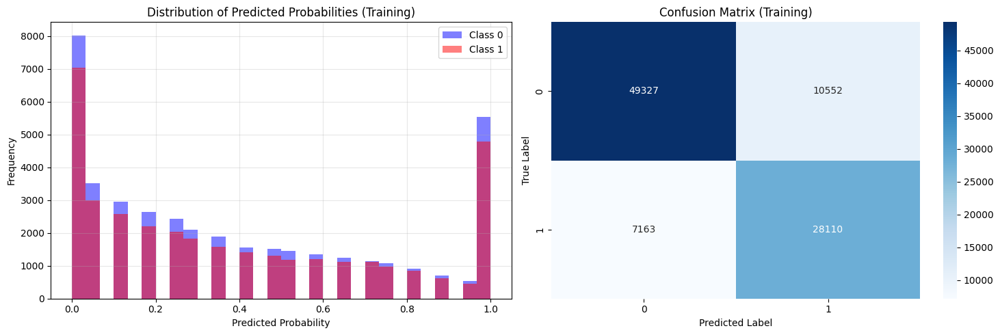

In [ ]:
# Visualize Training Results
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Predicted Probabilities Distribution
axes[0].hist(TrainingDataResults[TrainingDataResults[TargetVariable] == 0]['Probability'],
             bins=30, alpha=0.5, label='Class 0', color='blue')
axes[0].hist(TrainingDataResults[TrainingDataResults[TargetVariable] == 1]['Probability'],
             bins=30, alpha=0.5, label='Class 1', color='red')
axes[0].set_xlabel('Predicted Probability')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Predicted Probabilities (Training)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Confusion Matrix Heatmap
cm_train = metrics.confusion_matrix(y_train, TrainingPrediction)
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', ax=axes[1])
axes[1].set_xlabel('Predicted Label')
axes[1].set_ylabel('True Label')
axes[1].set_title('Confusion Matrix (Training)')

plt.tight_layout()
plt.show()

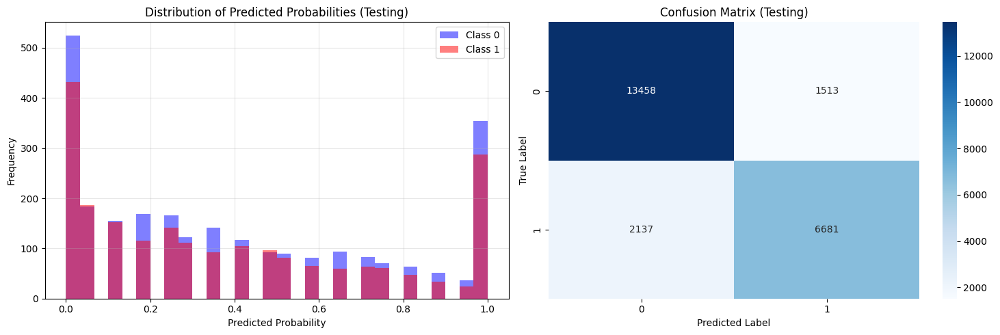

In [ ]:
# Visualize Testing Results
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Predicted Probabilities Distribution
axes[0].hist(TestingDataResults[TestingDataResults[TargetVariable] == 0]['Probability'],
             bins=30, alpha=0.5, label='Class 0', color='blue')
axes[0].hist(TestingDataResults[TestingDataResults[TargetVariable] == 1]['Probability'],
             bins=30, alpha=0.5, label='Class 1', color='red')
axes[0].set_xlabel('Predicted Probability')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Predicted Probabilities (Testing)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Confusion Matrix Heatmap
cm_test = metrics.confusion_matrix(y_test, TestingPrediction)
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', ax=axes[1])
axes[1].set_xlabel('Predicted Label')
axes[1].set_ylabel('True Label')
axes[1].set_title('Confusion Matrix (Testing)')

plt.tight_layout()
plt.show()

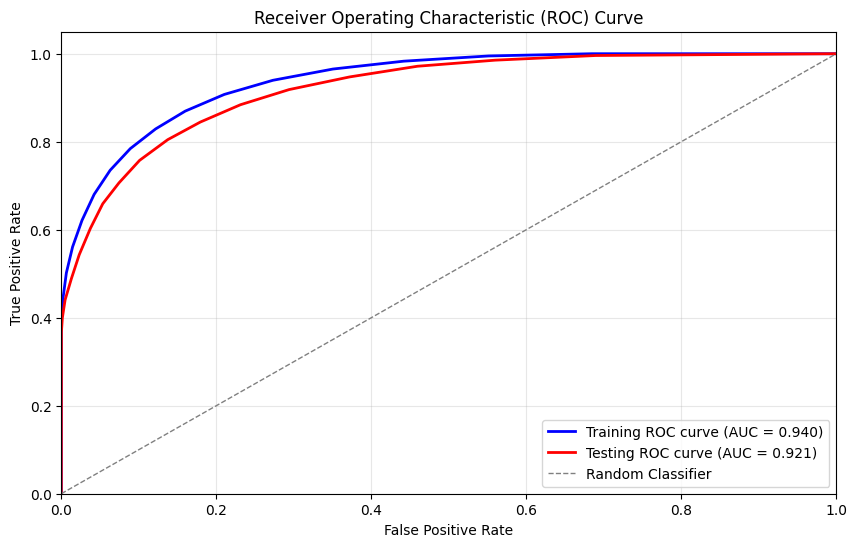

In [ ]:
# ROC Curve
from sklearn.metrics import roc_curve, auc

# Calculate ROC curve for Training data
fpr_train, tpr_train, _ = roc_curve(y_train, TrainingPredictionProba4)
roc_auc_train = auc(fpr_train, tpr_train)

fpr_test, tpr_test, _ = roc_curve(y_test, TestingPredictionProba)
roc_auc_test = auc(fpr_test, tpr_test)

plt.figure(figsize=(10, 6))
plt.plot(fpr_train, tpr_train, color='blue', lw=2,
         label=f'Training ROC curve (AUC = {roc_auc_train:.3f})')
plt.plot(fpr_test, tpr_test, color='red', lw=2,
         label=f'Testing ROC curve (AUC = {roc_auc_test:.3f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--', label='Random Classifier')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

Baseline F1 Score: 0.7854



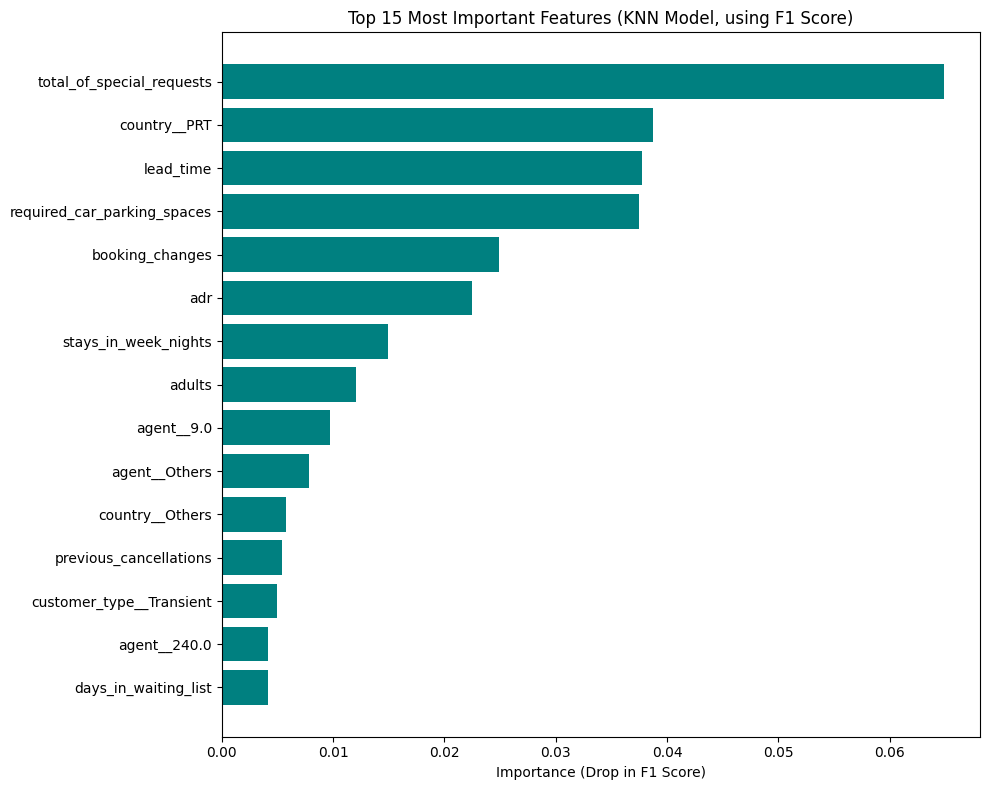

                        Feature  Importance
9     total_of_special_requests      0.0649
56                 country__PRT      0.0388
0                     lead_time      0.0378
8   required_car_parking_spaces      0.0375
5               booking_changes      0.0249
7                           adr      0.0225
1          stays_in_week_nights      0.0149
2                        adults      0.0120
82                   agent__9.0      0.0097
88                agent__Others      0.0079


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score

# ฟังก์ชันคำนวณ Feature Importance โดยใช้ F1 Score (เวอร์ชันแก้แล้วสำหรับ KNN)
def get_permutation_importance_f1(model, X, y, feature_names):
    # ถ้า X เป็น DataFrame → ใช้ตรง ๆ
    # ถ้าเป็น numpy → แปลงเป็น DataFrame ให้มีชื่อคอลัมน์
    if isinstance(X, pd.DataFrame):
        X_val = X.copy()
    else:
        X_val = pd.DataFrame(X, columns=feature_names)

    y_val = np.array(y)

    # 1) หาค่า F1 Score ตั้งต้น (Baseline F1 Score)
    initial_preds = model.predict(X_val)
    baseline_f1 = f1_score(y_val, initial_preds)
    print(f"Baseline F1 Score: {baseline_f1:.4f}\n")

    importances = []

    # 2) วนลูปทุกๆ Feature เพื่อสลับค่า (Shuffle)
    for col_name in feature_names:
        # copy ข้อมูลมาเพื่อไม่ให้กระทบต้นฉบับ
        X_permuted = X_val.copy()

        # สลับข้อมูลในคอลัมน์นั้นแบบสุ่ม
        X_permuted[col_name] = np.random.permutation(X_permuted[col_name].values)

        # ทำนายใหม่ด้วยข้อมูลที่สลับแล้ว
        permuted_preds = model.predict(X_permuted)

        # 3) คำนวณ Permuted F1 Score
        permuted_f1 = f1_score(y_val, permuted_preds)

        # 4) คำนวณว่า F1 Score ลดลงไปเท่าไหร่
        importance = baseline_f1 - permuted_f1
        importances.append(importance)

    # สร้าง DataFrame สรุปผล
    df_imp = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values(by='Importance', ascending=False)

    return df_imp


# คำนวณ (ใช้ X_test เพื่อดูผลกับข้อมูลที่ไม่เคยเห็น)
df_importance_f1 = get_permutation_importance_f1(
    knn,
    X_test_encode,          # DataFrame
    y_test,
    X_test_encode.columns
)

plt.figure(figsize=(10, 8))
top15 = df_importance_f1.head(15)[::-1]  # กลับลำดับให้สำคัญสุดอยู่ล่าง
plt.barh(top15['Feature'], top15['Importance'], color='teal')
plt.xlabel('Importance (Drop in F1 Score)')
plt.title('Top 15 Most Important Features (KNN Model, using F1 Score)')
plt.tight_layout()
plt.show()

print(df_importance_f1.head(10))

### **12.3.2 K-Nearest Neighbors (K-NN) Model Summary**

**สรุปผลการเปรียบเทียบประสิทธิภาพโมเดล K-Nearest Neighbors**

1. ภาพรวมการทดลอง

    การทดลองนี้มุ่งเน้นการสร้างและทดสอบโมเดลจำแนกข้อมูล (Classification) ด้วย K-Nearest Neighbors (KNN) โดยทำการค้นหา Optimal K (จำนวนเพื่อนบ้าน) สำหรับโมเดล KNN โดยใช้ 5-Fold Cross-Validation (CV) บนชุดข้อมูลฝึก มีรายละเอียดดังนี้:
    - วัตถุประสงค์: ค้นหาค่า K ที่ดีที่สุดเพื่อทำนายการยกเลิกการจองโรงแรม
    - เทคนิคหา K: 5-Fold Cross-Validation (CV)
    - เกณฑ์คัดเลือก: ค่าเฉลี่ย F1-Score (CV Avg)
    - ค่า K ที่ทดสอบ 10 ค่า: 1, 3, 5, 7, 11, 17, 21, 39, 41, 51
    - ลำดับการทดสอบ
  | ลำดับ | Flow | รายละเอียดเพิ่มเติม |เหตุผล |
  |----------|---------|----------------|---------|
  | 1 | ค้นหา Optimal K | ใช้ 5-Fold Cross-Validation (CV) บน Training Data และใช้ F1 Score เป็นเกณฑ์หลัก | ป้องกัน Data Leakage และเลือกพารามิเตอร์ K ที่ดีที่สุดที่สามารถทำงานได้เสถียรกับข้อมูลที่ยังไม่เคยเห็น |
  | 2 | ฝึกโมเดล | ฝึก Model ด้วยค่า K ที่ให้ค่า F1 Score (Avg) ดีที่สุดและแย่ที่สุด บน Training Data เต็มชุด | เตรียมโมเดลเพื่อเปรียบเทียบความสามารถในการวางนัยทั่วไป |
  | 3 | ประเมินบน Test Set | ประเมินประสิทธิภาพโมเดลทั้งสองด้วย Metrics หลัก โดยใช้ ROC AUC เป็นเกณฑ์ตัดสิน |วัดประสิทธิภาพที่แท้จริงของโมเดลกับข้อมูลที่ไม่เคยเห็น เพื่อให้ได้คะแนนที่เป็นกลางที่สุด |
  | 4 | เลือกโมเดลสุดท้าย | | |
  | 5 | วิเคราะห์ Overfitting | | |


2. การวิเคราะห์ประสิทธิภาพและการเกิด Overfitting

    ได้ทำการฝึกโมเดล 2 ตัวด้วย K ที่เลือกทั้ง 2 ค่า และประเมินประสิทธิภาพบบน Training Set และประเมินประสิทธิภาพบน Test Set เพื่อเปรียบเทียบ  และเลือกโมเดลที่ดีที่สุดมา 1 โมเดล

    **ตารางเปรียบเทียบประสิทธิภาพโมเดล (Performance Comparison)**

      | Metric  | Model A: K-Best_F1 (K = 17) | Model B: K-Worst_F1 (K = 1)|
      |---------------|-----------------|----------------|
      | Accuracy      | 0.8466          | 0.8118        |
      | Recall        | 0.7854          | 0.7497        |
      | F1-Score      | 0.7577          | 0.7606         |
      | ROC AUC       | 0.9207          | 0.8012         |

    จากการเปรียบเทียบโดยใช้ ROC AUC Score เป็นเกณฑ์หลัก (เนื่องจากเป็นตัวชี้วัดที่ดีกว่าสำหรับการประเมินประสิทธิภาพโดยรวมของแบบจำลองการจำแนกประเภท) จะทำการเลือก Model A: K-Best_F1 (K = 17) เพราะให้ค่า ROC AUC ที่สูงกว่า (0.9207) เมื่อเทียบกับ Model B (K = 1) ที่ได้ 0.8012 เป็นแบบจำลองที่จะใข้งาน




    ดังนั้นเมื่อทำการวิเคราะห์ประสิทธิภาพของแบบจำลองสุดท้าย (บน Test Set) จะพบว่า

    - ROC AUC Score (Testing): 0.9207
      - เป็นค่านี้บ่งชี้ว่าโมเดลมีการจำแนกที่ดีเยี่ยม (AUC ใกล้ 1.0)
    - ปัญหา Overfitting:
      | Metric  | Training | Testing | Gap |
      |---------------|--------|---------|--------------|
      | F1 Score  | 0.8105  | 0.7854 | ≈ 2.5%  |
      | ROC AUC | 0.9398 | 0.9207 | ≈ 1.98 % |

    ความแตกต่างระหว่างประสิทธิภาพบนชุดข้อมูลฝึกและชุดข้อมูลทดสอบมีค่าน้อย ซึ่งแสดงให้เห็นว่าโมเดล k=17 ไม่ได้เกิด Overfitting อย่างรุนแรง และมีความสามารถใน Generalization ได้ดีพอสมควร

3. การวิเคราะห์ปัจจัยที่มีอิทธิพลต่อโมเดล (Feature Importance) จากการวิเคราะห์ด้วยเทคนิค Permutation Importance พบว่าตัวแปรที่มีนัยสำคัญต่อการตัดสินใจของโมเดลสูงสุด 5 อันดับแรก จากการที่ตัวแปรเหล่านี้ส่งผลต่อการทำนายการยกเลิกการจองโรงแรมอย่างมีนัยสำคัญที่สุด เมื่อถูกสับเปลี่ยนค่า จะทำให้ F1 Score ของโมเดลลดลงมากที่สุด
    - total_of_special_requests: จำนวนคำขอพิเศษ (บ่งชี้ความตั้งใจเข้าพักจริงสูง หากมีคำขอมาก)
    - country_PRT: ลูกค้าจากประเทศโปรตุเกส (อาจมีพฤติกรรมการจองเฉพาะถิ่น)
    - lead_time: ระยะเวลาจองล่วงหน้า (บ่งชี้ถึงแผนการเดินทางมีโอกาสเปลี่ยนแปลงได้มาก)
    - required_car_parking_spaces: จำนวนที่จอดรถที่ต้องการ (มักแสดงความตั้งใจเข้าพักจริงสูง)
    - booking_changes: การเปลี่ยนแปลงการจอง (บ่งชี้ถึงความไม่แน่นอนของแผนการเดินทาง)

4. จากการวิเคราะห์เชิงลึก ขอเสนอแนะให้เลือกใช้โมเดลนี้ได้ อย่างไรก็ตาม โมเดล KNN มีข้อจำกัดตามธรรมชาติของอัลกอริทึมที่ต้องมีการจัดการก่อนนำไปใช้จริง โดยเฉพาะอย่างยิ่งปัญหาที่เกี่ยวข้องกับมิติของข้อมูล:
    - การลดผลกระทบจาก Curse of Dimensionality ด้วย PCA
      - ขอเสนอแนะให้ทำ Dimensionality Reduction โดยใช้ Principal Component Analysis อีกครั้ง หรือดำเนินการอย่างจริงจังก่อนนำไปใช้จริง
        - สาเหตุ: โมเดล KNN เป็นโมเดลที่พึ่งพาการคำนวณระยะทางระหว่างจุด (Distance-based) ดังนั้นจึงอ่อนไหวอย่างมากต่อ Curse of Dimensionality
        - ปัญหา: การใช้ตัวแปรทั้งหมด (93 ตัวแปร) โดยไม่คัดเลือก ทำให้เกิด Noise Sensitivity เนื่องจากตัวแปรที่ไม่เกี่ยวข้องจะเข้ามาถ่วงน้ำหนักในการคำนวณระยะทาง ทำให้จุดที่อยู่ใกล้กันในมิติที่สูงอาจไม่แสดงความคล้ายคลึงกันที่แท้จริง ถึงแม้ทางคณะผู็จัดทำจะทำการลดผลกระทบ Curse of Dimensionalit ไปบ้างแล้ว
    - การปรับจูน Distance Metric และ Weights
      - ขอเสนอแนะให้ทำการทดสอบการตั้งค่าพารามิเตอร์อื่น ๆ เพิ่มเติม เพื่อรีดประสิทธิภาพสูงสุดของโมเดล KNN


**Error Analysis**

Model Evaluation: Error Analysis
------------------------------
CONFUSION MATRIX BREAKDOWN:
   • True Negatives (TN):  13,458 - Predicted 'Not Canceled' & Actual 'Stayed' (Correct)
   • False Positives (FP): 1,513 - Predicted 'Canceled' & Actual 'Stayed' (Lost Revenue Opportunity)
   • False Negatives (FN): 2,137 - Predicted 'Not Canceled' & Actual 'Canceled' (Inventory Spoilage) ⚠️
   • True Positives (TP):  6,681 - Predicted 'Canceled' & Actual 'Canceled' (Correctly Identified)

PERFORMANCE METRICS:
   • Accuracy:             84.7% - Overall Accuracy
   • Recall (Sensitivity): 75.8% - Ability to capture 'Cancellations' (Higher is better)
   • Specificity:          89.9% - Ability to identify 'Safe' bookings
   • Precision:            81.5% - Reliability of 'Cancellation' prediction

ERROR DISTRIBUTION:
   • Total Errors: 21,394 (89.9%)
   • False Positives: 927 (3.9%) -> Type I Error
     → Avg Confidence: 0.817
   • False Negatives: 1,433 (6.0%) -> Type II Error ⚠️ HIGH RISK
     → 

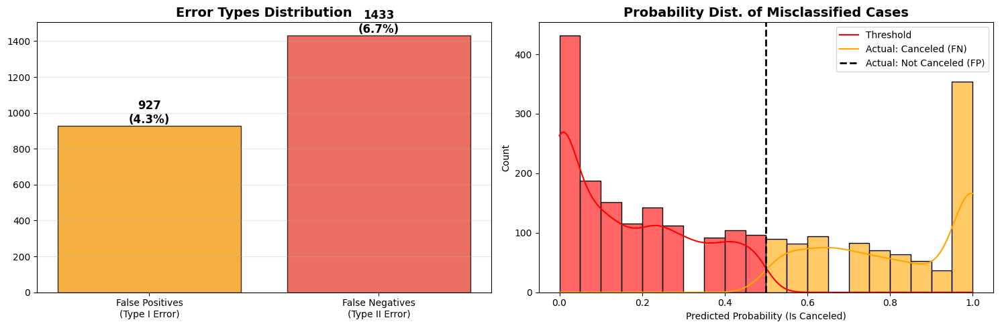

In [ ]:
# --- Confusion Matrix Analysis ---
tn, fp, fn, tp = metrics.confusion_matrix(y_test, TestingPrediction).ravel()

print('Model Evaluation: Error Analysis')
print("-" * 30)
print(f"CONFUSION MATRIX BREAKDOWN:")
print(f"   • True Negatives (TN):  {tn:,} - Predicted 'Not Canceled' & Actual 'Stayed' (Correct)")
print(f"   • False Positives (FP): {fp:,} - Predicted 'Canceled' & Actual 'Stayed' (Lost Revenue Opportunity)")
print(f"   • False Negatives (FN): {fn:,} - Predicted 'Not Canceled' & Actual 'Canceled' (Inventory Spoilage) ⚠️")
print(f"   • True Positives (TP):  {tp:,} - Predicted 'Canceled' & Actual 'Canceled' (Correctly Identified)")

# --- Business Implications ---
accuracy = (tp + tn) / (tp + tn + fp + fn)
recall = tp / (tp + fn)
specificity = tn / (tn + fp)
precision = tp / (tp + fp) if (tp + fp) > 0 else 0

print(f"\nPERFORMANCE METRICS:")
print(f"   • Accuracy:             {accuracy:.1%} - Overall Accuracy")
print(f"   • Recall (Sensitivity): {recall:.1%} - Ability to capture 'Cancellations' (Higher is better)")
print(f"   • Specificity:          {specificity:.1%} - Ability to identify 'Safe' bookings")
print(f"   • Precision:            {precision:.1%} - Reliability of 'Cancellation' prediction")

# --- Analyze Misclassified Cases ---
test_misclassified = TestingDataResults[
    TestingDataResults[TargetVariable] != TestingDataResults['Predicted' + TargetVariable]
]

false_positives = TestingDataResults[
    (TestingDataResults[TargetVariable] == 0) &
    (TestingDataResults['Predicted' + TargetVariable] == 1)
]

false_negatives = TestingDataResults[
    (TestingDataResults[TargetVariable] == 1) &
    (TestingDataResults['Predicted' + TargetVariable] == 0)
]

print(f"\nERROR DISTRIBUTION:")
print(f"   • Total Errors: {len(test_misclassified):,} ({len(test_misclassified)/len(TestingDataResults)*100:.1f}%)")
print(f"   • False Positives: {len(false_positives):,} ({len(false_positives)/len(TestingDataResults)*100:.1f}%) -> Type I Error")
print(f"     → Avg Confidence: {false_positives['Probability'].mean():.3f}")
print(f"   • False Negatives: {len(false_negatives):,} ({len(false_negatives)/len(TestingDataResults)*100:.1f}%) -> Type II Error ⚠️ HIGH RISK")
print(f"     → Avg Confidence: {false_negatives['Probability'].mean():.3f}")

# --- Probability Distribution Analysis ---
print(f"\nMISCLASSIFICATION PROBABILITY DISTRIBUTION (Confidence in Errors):")
prob_ranges = [
    (0.0, 0.3, "Very Low"),
    (0.3, 0.45, "Low"),
    (0.45, 0.55, "Uncertain (Borderline)"),
    (0.55, 0.7, "High"),
    (0.7, 1.0, "Very High (High Confidence Error)")
]

for low, high, label in prob_ranges:
    count_fn = len(false_negatives[
        (false_negatives['Probability'] >= low) & (false_negatives['Probability'] < high)
    ])
    count_fp = len(false_positives[
        (false_positives['Probability'] >= low) & (false_positives['Probability'] < high)
    ])

    if count_fn > 0: print(f"   • FN {label} ({low}-{high}): {count_fn} cases")
    if count_fp > 0: print(f"   • FP {label} ({low}-{high}): {count_fp} cases")

# --- Model Limitations ---
print(f"\nIDENTIFIED MODEL LIMITATIONS (K-NN):")
print("""
1. SENSITIVITY TO SCALE:
   - Distance calculations are heavily skewed by features with large ranges (e.g., 'lead_time').
   - Feature Scaling (StandardScaler) is strictly required, or the model will fail.

2. CURSE OF DIMENSIONALITY:
   - With many features (after One-Hot Encoding), data becomes sparse.
   - 'Nearest' neighbors might not actually be similar in high-dimensional space.

3. COMPUTATIONAL COST:
   - Prediction time creates latency. For a large hotel booking database, real-time prediction might be too slow.
""")

# --- Visualization ---
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Error Types
error_types = ['False Positives\n(Type I Error)', 'False Negatives\n(Type II Error)']
error_counts = [len(false_positives), len(false_negatives)]
colors = ['#f39c12', '#e74c3c']
bars = axes[0].bar(error_types, error_counts, color=colors, edgecolor='black', alpha=0.8)
axes[0].set_title('Error Types Distribution', fontsize=14, fontweight='bold')
axes[0].grid(True, alpha=0.3, axis='y')

for bar, count in zip(bars, error_counts):
    axes[0].text(bar.get_x() + bar.get_width()/2., bar.get_height(),
                f'{count}\n({count/len(test_misclassified)*100:.1f}%)',
                ha='center', va='bottom', fontsize=12, fontweight='bold')

# Plot 2: Probability Distribution
sns.histplot(data=test_misclassified, x='Probability', hue=TargetVariable,
             bins=20, alpha=0.6, ax=axes[1], kde=True, palette={0: 'orange', 1: 'red'})
axes[1].axvline(x=0.5, color='black', linestyle='--', linewidth=2, label='Threshold 0.5')
axes[1].set_title('Probability Dist. of Misclassified Cases', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Predicted Probability (Is Canceled)')
axes[1].legend(['Threshold', 'Actual: Canceled (FN)', 'Actual: Not Canceled (FP)'])

plt.tight_layout()
plt.show()

**Error Analysis Summary**

โมเดล K-NN จัดอยู่ในกลุ่ม "Balanced Performance" โดยมีความแม่นยำรวมอยู่ที่ 84.7% ซึ่งถือว่าดีกว่า Logistic Regression (81.4%) แต่ยังด้อยกว่า Random Forest (87.2%) เล็กน้อย พฤติกรรมของ K-NN มีความสมดุลระหว่างการทำนาย "ยกเลิก" และ "ไม่ยกเลิก" แต่มีข้อจำกัดสำคัญเรื่อง "ความสามารถในการดักจับ" (Recall) ที่ทำได้เพียง 75.8% ซึ่งต่ำที่สุดในบรรดา 3 โมเดลที่ทดสอบ นอกจากนี้ K-NN ยังมีข้อเสียเปรียบเรื่องทรัพยากรการคำนวณ (Computational Cost) เมื่อต้องจัดการกับข้อมูลขนาดใหญ่

1. การเจาะลึกข้อผิดพลาด (Error Deep Dive)

    จากการวิเคราะห์ความผิดพลาด (อ้างอิงจาก Confusion Matrix) พบประเด็นสำคัญดังนี้:
    - ปัญหาหลัก: "พลาดเป้า/มองไม่เห็นเพื่อนบ้าน" (False Negatives)
      - จำนวน: 2,137 เคส (สูงที่สุดในบรรดาข้อผิดพลาด)
      - สถานการณ์: โมเดลทายว่า "ไม่ยกเลิก" (ลูกค้าจะมา) แต่จริงๆ แล้วลูกค้า "ดันยกเลิก"
      - ความมั่นใจ: ส่วนใหญ่โมเดลมีความมั่นใจในทางที่ผิดสูง (Probability 0.0-0.3 จำนวนกว่า 1,141 เคส) แปลว่า "เพื่อนบ้าน" (Neighbors) ส่วนใหญ่ของเคสเหล่านี้คือคนที่ไม่ยกเลิก โมเดลเลยทายตามเสียงข้างมากอย่างมั่นใจ
      - ผลกระทบทางธุรกิจ: เกิด Inventory Spoilage สูงสุด เตรียมห้องเก้อ และเสียโอกาสขาย

    - ปัญหารอง: "ความผิดพลาดส่วนน้อย" (False Positives)
      - จำนวน: 1,513 เคส
      - สถานการณ์: โมเดลทายว่า "จะยกเลิก" แต่ลูกค้า "มาพักจริง"
      - ผลกระทบทางธุรกิจ: เสียโอกาสรายได้บ้าง แต่ความเสี่ยงต่ำกว่าการปล่อยห้องว่าง

2. การวิเคราะห์สาเหตุ (Root Cause Analysis)

    สาเหตุที่ K-NN มีข้อจำกัดเรื่อง Recall และความเร็ว เกิดจากลักษณะพื้นฐานของอัลกอริทึม:
      - ความอ่อนไหวต่อสเกลของข้อมูล (Sensitivity to Scale): K-NN ตัดสินใจจาก "ระยะห่าง" (Distance) หากฟีเจอร์บางตัวมีค่ากว้างมาก (เช่น lead_time หลักร้อยวัน) จะกลบความสำคัญของฟีเจอร์ที่เป็น 0-1 (เช่น deposit_type) ทำให้การหา "เพื่อนบ้าน" เพี้ยนไป
      - คำสาปของมิติ (Curse of Dimensionality): หลังจากทำ One-Hot Encoding ข้อมูลมีฟีเจอร์จำนวนมาก (90+ คอลัมน์) ทำให้ข้อมูลกระจายตัวห่างกันมาก (Sparse) การหา "คนใกล้เคียงที่สุด" ในมิติที่กว้างขนาดนี้จึงเริ่มไม่แม่นยำ
      - ต้นทุนการคำนวณ (Computational Cost): K-NN ต้องคำนวณระยะทางเทียบกับข้อมูลทั้งหมดในฐานข้อมูลทุกครั้งที่ทำนาย ทำให้ "ช้า" และไม่เหมาะกับการใช้งาน Real-time ในระบบโรงแรมที่มี Booking เข้ามาตลอดเวลา

## **12.4 Neural Network (NN)**

### **12.4.1 Neural Network (NN) without Hyperparameter Tuning**

In [ ]:
# let's print the shape of train and test again
print("X_train shape", X_train_encode.shape)
print("y_train shape", y_train.shape)
print("X_test shape", X_test_encode.shape)
print("y_test shape", y_test.shape)

X_train shape (95152, 93)
y_train shape (95152,)
X_test shape (23789, 93)
y_test shape (23789,)


In [ ]:
X_train_encode.shape[1]

93

In [ ]:
# Separate Target Variable and Predictor Variables
TargetVariable = 'is_canceled'
Predictors = list(X_train_encode.columns)

In [ ]:
#Build neural network model
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D,MaxPooling2D, Flatten, Dropout

#Create Neural Model
modelNN1 = Sequential()

# Input Layer & Hidden Layer 1
# input_shape ต้องเท่ากับจำนวน features ของเรา (x_train.shape[1])
modelNN1.add(Dense(128, activation='relu', input_shape=(X_train_encode.shape[1],)))
modelNN1.add(Dropout(0.3)) # ใส่กัน Overfitting

# Hidden Layer 2
modelNN1.add(Dense(64, activation='relu'))
modelNN1.add(Dropout(0.3))

# Hidden Layer 3
modelNN1.add(Dense(32, activation='relu'))
modelNN1.add(Dropout(0.2))

# Output Layer (Sigmoid สำหรับ 0 หรือ 1)
modelNN1.add(Dense(1, activation='sigmoid'))

print('Neural network model')
modelNN1.summary()

Neural network model


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6 (Dense)                 │ (None, 128)            │        12,032 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,401 (87.50 KB)

 Trainable params: 22,401 (87.50 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
#compile model using accuracy to measure model performance
modelNN1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# Early Stopping
early_stopping = callbacks.EarlyStopping(
    monitor='val_loss', # ดูค่า Loss ของ Validation set
    patience=10,        # ถ้าผ่านไป 10 epochs แล้ว loss ไม่ลดลง ให้หยุด
    restore_best_weights=True # กลับไปใช้ค่าที่ดีที่สุดก่อนที่จะแย่ลง
)

In [ ]:
#train the model
historyNN = modelNN1.fit(X_train_encode, y_train, validation_data=(X_test_encode, y_test),
                        epochs=100, batch_size=32, callbacks=[early_stopping],verbose=1)

Epoch 1/100
2974/2974 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - accuracy: 0.8018 - loss: 0.4061 - val_accuracy: 0.8495 - val_loss: 0.3152
Epoch 2/100
2974/2974 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.8453 - loss: 0.3259 - val_accuracy: 0.8534 - val_loss: 0.3088
Epoch 3/100
2974/2974 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8503 - loss: 0.3167 - val_accuracy: 0.8563 - val_loss: 0.3040
Epoch 4/100
2974/2974 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.8541 - loss: 0.3116 - val_accuracy: 0.8543 - val_loss: 0.3060
Epoch 5/100
2974/2974 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8566 - loss: 0.3044 - val_accuracy: 0.8552 - val_loss: 0.3023
Epoch 6/100
2974/2974 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.8571 - loss: 0.3030 - val_accuracy: 0.8583 - val_loss: 0.2987
Epoch 7/100
2974/2974 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8592 - loss: 0.3003 - val_accuracy: 0.8602 - val_loss: 0.2995
Epoch 8/100
2974/2974 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.8597 - loss: 0

In [ ]:
historyNN.history['loss']

[0.3596985340118408,
 0.32479527592658997,
 0.3160943388938904,
 0.31139707565307617,
 0.3079288899898529,
 0.3049299716949463,
 0.3023737370967865,
 0.3006651997566223,
 0.29807645082473755,
 0.2964805066585541,
 0.295337975025177,
 0.2927837371826172,
 0.2926381528377533,
 0.2900998294353485,
 0.2893434464931488,
 0.28752824664115906,
 0.2873989939689636,
 0.28750088810920715,
 0.284927099943161,
 0.2838681936264038,
 0.2829470932483673,
 0.28274235129356384,
 0.2815493643283844,
 0.2818639874458313,
 0.28054365515708923,
 0.2796958088874817]

In [ ]:
#Neural network weights
print('Neural network weights')
for layer in modelNN1.layers:
  print(layer.get_weights())
  print("*"*20)

Neural network weights
[array([[ 0.03687351,  0.41000286, -0.1451347 , ..., -0.03877543,
        -0.00975752,  0.06085916],
       [ 0.17117321,  0.0360991 ,  0.2475274 , ...,  0.15084192,
         0.08562898, -0.01952011],
       [-0.03341404,  0.10968801, -0.02954482, ...,  0.07860216,
         0.02506779,  0.16468191],
       ...,
       [-0.3787637 , -0.3955821 ,  0.3845377 , ...,  0.5422884 ,
        -0.17144139, -0.27151793],
       [ 0.11660668,  0.04721462, -0.2639677 , ..., -0.02339231,
        -0.7481867 , -0.21554337],
       [-1.0064865 , -0.6818018 , -0.10171097, ..., -0.9869832 ,
         0.42277396, -0.03778822]], dtype=float32), array([-0.00261416, -0.04425046, -0.08315904, -0.21137491, -0.16123456,
       -0.32192883, -0.17572941, -0.30111867, -0.17957774, -0.0835094 ,
       -0.13298255, -0.3019864 , -0.06311259, -0.12911576, -0.20710753,
       -0.11760449, -0.12549627, -0.261107  , -0.229894  , -0.06876994,
       -0.09166611, -0.13176407, -0.10087732, -0.24123687, 

In [ ]:
score1 = modelNN1.evaluate(X_train_encode, y_train, verbose=0)
score1 = modelNN1.evaluate(X_train_encode, y_train, verbose=0)
print("Neural network model loss:", score1[0])
print("Neural network model Test accuracy:", score1[1])

Neural network model loss: 0.267432302236557
Neural network model Test accuracy: 0.8759668469429016


In [ ]:
# Printing some sample values of prediction
print("Training result prediction of Model")
TrainingPredictionProba5 = modelNN1.predict(X_train_encode)
TrainingPrediction5 = (TrainingPredictionProba5 > 0.5).astype('int32')

TrainingDataResults5 = pd.DataFrame(data=X_train_encode, columns=Predictors)
TrainingDataResults5[TargetVariable] = y_train.values
TrainingDataResults5[('Predicted' + TargetVariable)] = TrainingPrediction5
TrainingDataResults5[('Probability')] = TrainingPredictionProba5

# Printing sample prediction values
print(TrainingDataResults5.head())

Training result prediction of Model
2974/2974 ━━━━━━━━━━━━━━━━━━━━ 2s 756us/step
   lead_time  stays_in_week_nights  adults  previous_cancellations  \
0     0.8232                1.3199  0.2931                 -0.1029   
1     1.7872               -0.2635  0.2931                 -0.1029   
2    -0.7118               -0.2635  0.2931                 -0.1029   
3    -0.6837                1.8477  0.2931                 -0.1029   
4     0.2803               -0.7913 -1.7986                 -0.1029   

   previous_bookings_not_canceled  booking_changes  days_in_waiting_list  \
0                         -0.0905          -0.3516               -0.1321   
1                         -0.0905          -0.3516               -0.1321   
2                         -0.0905          -0.3516               -0.1321   
3                         -0.0905          -0.3516               -0.1321   
4                         -0.0905          -0.3516               -0.1321   

      adr  required_car_parking_spaces  t

In [ ]:
# Evaluation Metrics
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix

# Classification Metrics for Training data
print('=== Training Data Metrics ===')
print('Accuracy Score:', metrics.accuracy_score(y_train, TrainingPrediction5))
print('Precision Score:', metrics.precision_score(y_train, TrainingPrediction5))
print('Recall Score:', metrics.recall_score(y_train, TrainingPrediction5))
print('F1 Score:', metrics.f1_score(y_train, TrainingPrediction5))
print('ROC AUC Score:', metrics.roc_auc_score(y_train, TrainingPredictionProba5))

=== Training Data Metrics ===
Accuracy Score: 0.875966874054145
Precision Score: 0.8468859921373888
Recall Score: 0.8122643381623338
F1 Score: 0.8292139384116693
ROC AUC Score: 0.9503057254350569


In [ ]:
# Confusion Matrix for Training data
print('Confusion Matrix (Training):')
print(metrics.confusion_matrix(y_train, TrainingPrediction5))

# Classification Report for Training data
print('\nClassification Report (Training):')
print(metrics.classification_report(y_train, TrainingPrediction5))

Confusion Matrix (Training):
[[54699  5180]
 [ 6622 28651]]

Classification Report (Training):
              precision    recall  f1-score   support

           0       0.89      0.91      0.90     59879
           1       0.85      0.81      0.83     35273

    accuracy                           0.88     95152
   macro avg       0.87      0.86      0.87     95152
weighted avg       0.88      0.88      0.88     95152



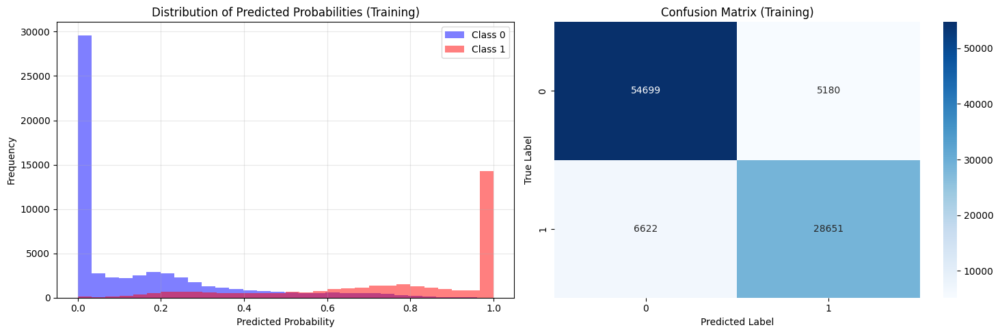

In [ ]:
# Visualize Training Results
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Predicted Probabilities Distribution
axes[0].hist(TrainingDataResults5[TrainingDataResults5[TargetVariable] == 0]['Probability'],
             bins=30, alpha=0.5, label='Class 0', color='blue')
axes[0].hist(TrainingDataResults5[TrainingDataResults5[TargetVariable] == 1]['Probability'],
             bins=30, alpha=0.5, label='Class 1', color='red')
axes[0].set_xlabel('Predicted Probability')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Predicted Probabilities (Training)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Confusion Matrix Heatmap
cm_train = metrics.confusion_matrix(y_train, TrainingPrediction5)
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', ax=axes[1])
axes[1].set_xlabel('Predicted Label')
axes[1].set_ylabel('True Label')
axes[1].set_title('Confusion Matrix (Training)')

plt.tight_layout()
plt.show()

In [ ]:
# Printing some sample values of prediction
print("Testing result prediction of Model")
TestingPredictionProba5 = modelNN1.predict(X_test_encode)
TestingPrediction5 = (TestingPredictionProba5 > 0.5).astype('int32')

TestingDataResults5 = pd.DataFrame(data=X_test_encode, columns=Predictors)
TestingDataResults5[TargetVariable] = y_test.values
TestingDataResults5[('Predicted' + TargetVariable)] = TestingPrediction5
TestingDataResults5[('Probability')] = TestingPredictionProba5

# Printing sample prediction values
print(TestingDataResults5.head())

Testing result prediction of Model
744/744 ━━━━━━━━━━━━━━━━━━━━ 1s 756us/step
   lead_time  stays_in_week_nights  adults  previous_cancellations  \
0    -0.9552               -0.7913  0.2931                 -0.1029   
1     0.0838                0.2643  0.2931                  6.8506   
2    -0.9739               -0.2635 -1.7986                 -0.1029   
3     0.3645               -0.2635  0.2931                 -0.1029   
4     0.5611               -0.2635  0.2931                 -0.1029   

   previous_bookings_not_canceled  booking_changes  days_in_waiting_list  \
0                         -0.0905          -0.3516               -0.1321   
1                         -0.0905          -0.3516                2.3901   
2                         -0.0905          -0.3516               -0.1321   
3                         -0.0905          -0.3516               -0.1321   
4                         -0.0905          -0.3516               -0.1321   

      adr  required_car_parking_spaces  tota

In [ ]:
# Classification Metrics for Testing data
print('=== Testing Data Metrics ===')
print('Accuracy Score:', metrics.accuracy_score(y_test, TestingPrediction5))
print('Precision Score:', metrics.precision_score(y_test, TestingPrediction5))
print('Recall Score:', metrics.recall_score(y_test, TestingPrediction5))
print('F1 Score:', metrics.f1_score(y_test, TestingPrediction5))
print('ROC AUC Score:', metrics.roc_auc_score(y_test, TestingPredictionProba5))

=== Testing Data Metrics ===
Accuracy Score: 0.863340199251755
Precision Score: 0.8299158468649994
Recall Score: 0.7940576094352461
F1 Score: 0.8115908432338452
ROC AUC Score: 0.9409903449988949


In [ ]:
# Confusion Matrix for Testing data
print('Confusion Matrix (Testing):')
print(metrics.confusion_matrix(y_test, TestingPrediction5))

# Classification Report for Testing data
print('\nClassification Report (Testing):')
print(metrics.classification_report(y_test, TestingPrediction5))

Confusion Matrix (Testing):
[[13536  1435]
 [ 1816  7002]]

Classification Report (Testing):
              precision    recall  f1-score   support

           0       0.88      0.90      0.89     14971
           1       0.83      0.79      0.81      8818

    accuracy                           0.86     23789
   macro avg       0.86      0.85      0.85     23789
weighted avg       0.86      0.86      0.86     23789



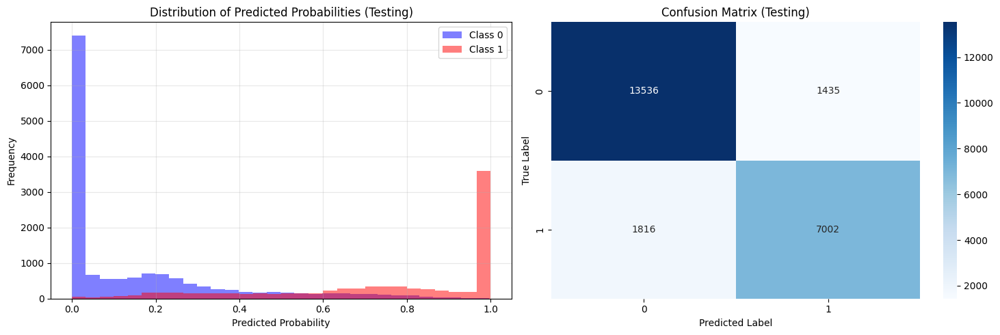

In [ ]:
# Visualize Testing Results
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Predicted Probabilities Distribution
axes[0].hist(TestingDataResults5[TestingDataResults5[TargetVariable] == 0]['Probability'],
             bins=30, alpha=0.5, label='Class 0', color='blue')
axes[0].hist(TestingDataResults5[TestingDataResults5[TargetVariable] == 1]['Probability'],
             bins=30, alpha=0.5, label='Class 1', color='red')
axes[0].set_xlabel('Predicted Probability')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Predicted Probabilities (Testing)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Confusion Matrix Heatmap
cm_test = metrics.confusion_matrix(y_test, TestingPrediction5)
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', ax=axes[1])
axes[1].set_xlabel('Predicted Label')
axes[1].set_ylabel('True Label')
axes[1].set_title('Confusion Matrix (Testing)')

plt.tight_layout()
plt.show()

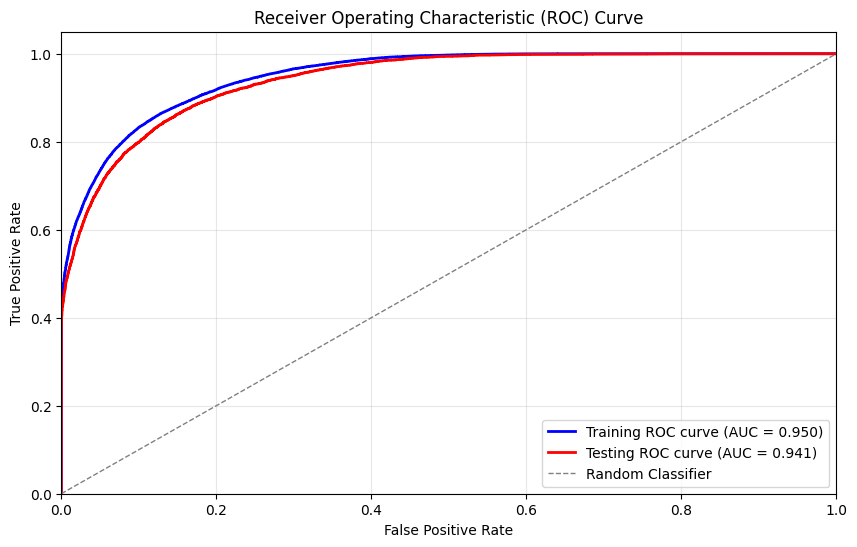

In [ ]:
# ROC Curve
from sklearn.metrics import roc_curve, auc

# Calculate ROC curve for Training data
fpr_train, tpr_train, _ = roc_curve(y_train, TrainingPredictionProba5)
roc_auc_train = auc(fpr_train, tpr_train)

# Calculate ROC curve for Testing data
fpr_test, tpr_test, _ = roc_curve(y_test, TestingPredictionProba5)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curves
plt.figure(figsize=(10, 6))
plt.plot(fpr_train, tpr_train, color='blue', lw=2,
         label=f'Training ROC curve (AUC = {roc_auc_train:.3f})')
plt.plot(fpr_test, tpr_test, color='red', lw=2,
         label=f'Testing ROC curve (AUC = {roc_auc_test:.3f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--', label='Random Classifier')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

Baseline Accuracy: 0.8633



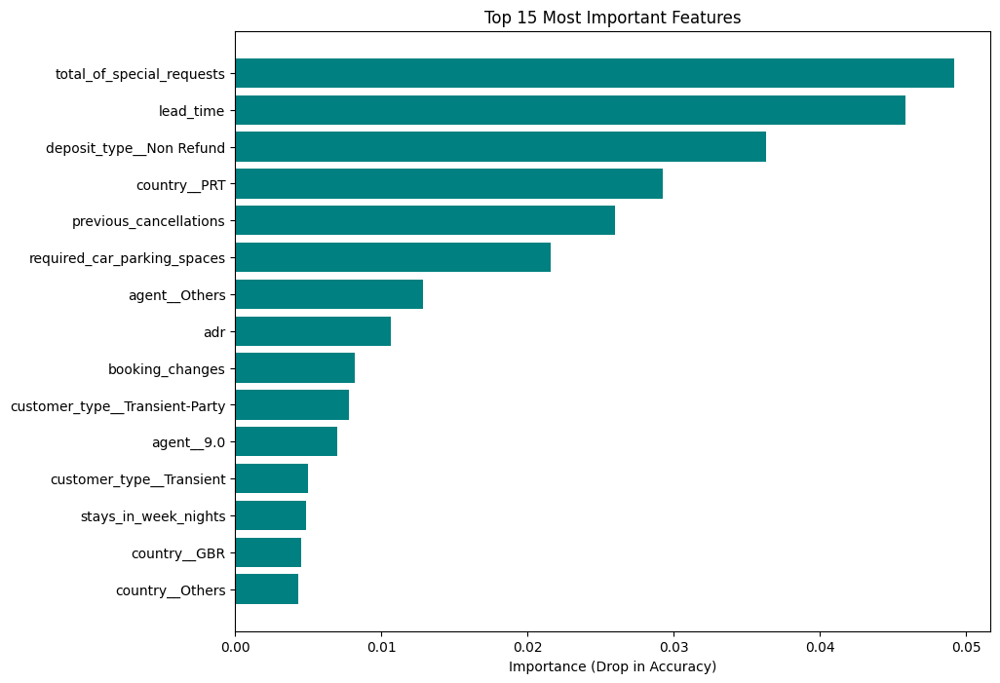

                           Feature  Importance
9        total_of_special_requests      0.0492
0                        lead_time      0.0459
76        deposit_type__Non Refund      0.0363
56                    country__PRT      0.0293
3           previous_cancellations      0.0260
8      required_car_parking_spaces      0.0216
88                   agent__Others      0.0129
7                              adr      0.0106
5                  booking_changes      0.0082
92  customer_type__Transient-Party      0.0078


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# ฟังก์ชันคำนวณ Feature Importance
def get_permutation_importance(model, X, y, feature_names):
    # หาค่าความแม่นยำตั้งต้น (Baseline Accuracy)
    X_val = X.values if isinstance(X, pd.DataFrame) else X

    initial_preds = (model.predict(X_val, verbose=0) > 0.5).astype('int32')
    baseline_acc = accuracy_score(y, initial_preds)

    print(f"Baseline Accuracy: {baseline_acc:.4f}\n")

    importances = []

    # วนลูปทุกๆ Feature เพื่อสลับค่า (Shuffle)
    for i, col_name in enumerate(feature_names):
        # copy ข้อมูลมาเพื่อไม่ให้กระทบต้นฉบับ
        X_permuted = X_val.copy()

        # สลับข้อมูลในคอลัมน์ที่ i
        np.random.shuffle(X_permuted[:, i])

        # ทำนายใหม่ด้วยข้อมูลที่สลับแล้ว
        permuted_preds = (model.predict(X_permuted, verbose=0) > 0.5).astype('int32')
        permuted_acc = accuracy_score(y, permuted_preds)

        # คำนวณว่าความแม่นยำลดลงไปเท่าไหร่
        importance = baseline_acc - permuted_acc
        importances.append(importance)

    # สร้าง DataFrame สรุปผล
    df_imp = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values(by='Importance', ascending=False)

    return df_imp

# คำนวณ (ใช้ X_test เพื่อดูผลกับข้อมูลที่ไม่เคยเห็น)
df_importance = get_permutation_importance(modelNN1, X_test_encode, y_test, X_test_encode.columns)

plt.figure(figsize=(10, 8))
plt.barh(df_importance['Feature'][:15][::-1], df_importance['Importance'][:15][::-1], color='teal')
plt.xlabel('Importance (Drop in Accuracy)')
plt.title('Top 15 Most Important Features')
plt.show()

print(df_importance.head(10))

### **12.4.2 Neural Network (NN) with Hyperparameter Tuning**

In [ ]:
# let's print the shape of train and test again
print("X_train shape", X_train_encode.shape)
print("y_train shape", y_train.shape)
print("X_test shape", X_test_encode.shape)
print("y_test shape", y_test.shape)

X_train shape (95152, 93)
y_train shape (95152,)
X_test shape (23789, 93)
y_test shape (23789,)


In [ ]:
X_train_encode.shape[1]

93

In [ ]:
# Separate Target Variable and Predictor Variables
TargetVariable = 'is_canceled'
Predictors = list(X_train_encode.columns)

In [ ]:
!pip install keras-tuner

In [ ]:
#Build neural network model
import tensorflow as tf
import keras_tuner as kt
from tensorflow.keras import layers, models, callbacks
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D,MaxPooling2D, Flatten, Dropout

def build_model(hp):
    model = models.Sequential()

    # Tune จำนวน Neuron ใน Layer 1
    hp_units1 = hp.Int('units_1', min_value=32, max_value=256, step=32)
    model.add(layers.Dense(units=hp_units1, activation='relu', input_shape=(X_train_encode.shape[1],)))

    # Tune Dropout Rate
    hp_dropout = hp.Float('dropout_rate', min_value=0.1, max_value=0.5, step=0.1)
    model.add(layers.Dropout(rate=hp_dropout))

    # Tune จำนวน Hidden Layers
    for i in range(hp.Int('num_layers', 1, 3)):
        model.add(layers.Dense(
            units=hp.Int(f'units_{i+2}', min_value=16, max_value=128, step=16),
            activation='relu'
        ))
        model.add(layers.Dropout(rate=hp_dropout))

    # Output Layer
    model.add(layers.Dense(1, activation='sigmoid'))

    # Tune Learning Rate
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=hp_learning_rate),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )

    return model

In [ ]:
# สร้าง Tuner
tuner = kt.Hyperband(
    build_model,
    objective='val_accuracy',
    max_epochs=20,
    factor=3,
    directory='my_dir',
    project_name='hotel_cancel_tuning'
)

Reloading Tuner from my_dir/hotel_cancel_tuning/tuner0.json


In [ ]:
# Early Stopping
stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

In [ ]:
# เริ่มต้นการค้นหา
print("Start Hyperparameter Tuning...")
tuner.search(X_train_encode, y_train,
             epochs=50,
             validation_data=(X_test_encode, y_test),
             callbacks=[stop_early],
             batch_size=32)

Start Hyperparameter Tuning...


In [ ]:
# ดูค่า Hyperparameter ที่ดีที่สุด
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print(f"""
The hyperparameter search is complete.
The optimal number of units in the first densely-connected layer is {best_hps.get('units_1')}.
The optimal dropout rate is {best_hps.get('dropout_rate')}.
The optimal learning rate for the optimizer is {best_hps.get('learning_rate')}.
""")


The hyperparameter search is complete.
The optimal number of units in the first densely-connected layer is 160.
The optimal dropout rate is 0.1.
The optimal learning rate for the optimizer is 0.001.



In [ ]:
#train the model
modelNN = tuner.hypermodel.build(best_hps)

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=10, restore_best_weights=True
)

print("Start Training Best Model...")
history = modelNN.fit(X_train_encode, y_train,
                      validation_data=(X_test_encode, y_test),
                      epochs=100,
                      batch_size=32,
                      callbacks=[early_stopping],
                      verbose=1)

Start Training Best Model...


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
2974/2974 ━━━━━━━━━━━━━━━━━━━━ 16s 5ms/step - accuracy: 0.8220 - loss: 0.3699 - val_accuracy: 0.8522 - val_loss: 0.3093
Epoch 2/100
2974/2974 ━━━━━━━━━━━━━━━━━━━━ 18s 4ms/step - accuracy: 0.8515 - loss: 0.3140 - val_accuracy: 0.8559 - val_loss: 0.3031
Epoch 3/100
2974/2974 ━━━━━━━━━━━━━━━━━━━━ 16s 2ms/step - accuracy: 0.8555 - loss: 0.3047 - val_accuracy: 0.8571 - val_loss: 0.3001
Epoch 4/100
2974/2974 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.8589 - loss: 0.2981 - val_accuracy: 0.8614 - val_loss: 0.3001
Epoch 5/100
2974/2974 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.8619 - loss: 0.2919 - val_accuracy: 0.8617 - val_loss: 0.2930
Epoch 6/100
2974/2974 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.8680 - loss: 0.2827 - val_accuracy: 0.8618 - val_loss: 0.2941
Epoch 7/100
2974/2974 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - accuracy: 0.8665 - loss: 0.2835 - val_accuracy: 0.8631 - val_loss: 0.2918
Epoch 8/100
2974/2974 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.8692 - loss

In [ ]:
score1 = modelNN.evaluate(X_train_encode, y_train, verbose=0)
score1 = modelNN.evaluate(X_train_encode, y_train, verbose=0)
print("Neural network model loss:", score1[0])
print("Neural network model Test accuracy:", score1[1])

Neural network model loss: 0.26492777466773987
Neural network model Test accuracy: 0.8768811821937561


In [ ]:
# Printing some sample values of prediction
print("Training result prediction of Model")
TrainingPredictionProba6 = modelNN.predict(X_train_encode)
TrainingPrediction6 = (TrainingPredictionProba6 > 0.5).astype('int32')

TrainingDataResults6 = pd.DataFrame(data=X_train_encode, columns=Predictors)
TrainingDataResults6[TargetVariable] = y_train.values
TrainingDataResults6[('Predicted' + TargetVariable)] = TrainingPrediction6
TrainingDataResults6[('Probability')] = TrainingPredictionProba6

# Printing sample prediction values
print(TrainingDataResults6.head())

Training result prediction of Model
2974/2974 ━━━━━━━━━━━━━━━━━━━━ 2s 802us/step
   lead_time  stays_in_week_nights  adults  previous_cancellations  \
0     0.8232                1.3199  0.2931                 -0.1029   
1     1.7872               -0.2635  0.2931                 -0.1029   
2    -0.7118               -0.2635  0.2931                 -0.1029   
3    -0.6837                1.8477  0.2931                 -0.1029   
4     0.2803               -0.7913 -1.7986                 -0.1029   

   previous_bookings_not_canceled  booking_changes  days_in_waiting_list  \
0                         -0.0905          -0.3516               -0.1321   
1                         -0.0905          -0.3516               -0.1321   
2                         -0.0905          -0.3516               -0.1321   
3                         -0.0905          -0.3516               -0.1321   
4                         -0.0905          -0.3516               -0.1321   

      adr  required_car_parking_spaces  t

In [ ]:
# Evaluation Metrics
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix

# Classification Metrics for Training data
print('=== Training Data Metrics ===')
print('Accuracy Score:', metrics.accuracy_score(y_train, TrainingPrediction6))
print('Precision Score:', metrics.precision_score(y_train, TrainingPrediction6))
print('Recall Score:', metrics.recall_score(y_train, TrainingPrediction6))
print('F1 Score:', metrics.f1_score(y_train, TrainingPrediction6))
print('ROC AUC Score:', metrics.roc_auc_score(y_train, TrainingPredictionProba6))

=== Training Data Metrics ===
Accuracy Score: 0.8768812006053472
Precision Score: 0.8706419131529264
Recall Score: 0.7844243472344286
F1 Score: 0.8252874591740862
ROC AUC Score: 0.9529272204535546


In [ ]:
# Confusion Matrix for Training data
print('Confusion Matrix (Training):')
print(metrics.confusion_matrix(y_train, TrainingPrediction6))

# Classification Report for Training data
print('\nClassification Report (Training):')
print(metrics.classification_report(y_train, TrainingPrediction6))

Confusion Matrix (Training):
[[55768  4111]
 [ 7604 27669]]

Classification Report (Training):
              precision    recall  f1-score   support

           0       0.88      0.93      0.90     59879
           1       0.87      0.78      0.83     35273

    accuracy                           0.88     95152
   macro avg       0.88      0.86      0.87     95152
weighted avg       0.88      0.88      0.88     95152



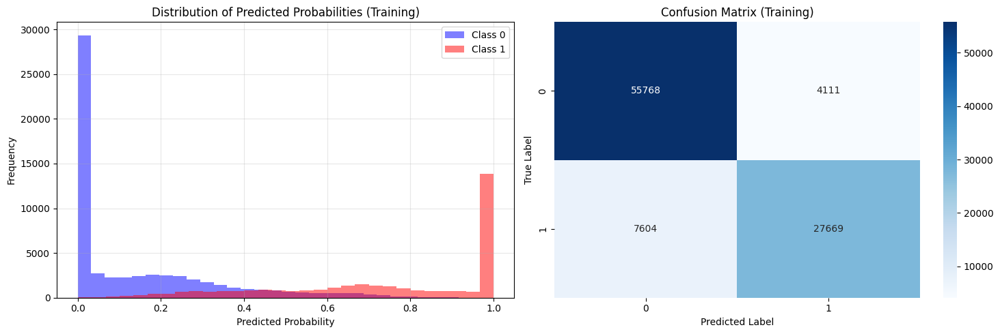

In [ ]:
# Visualize Training Results
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Predicted Probabilities Distribution
axes[0].hist(TrainingDataResults6[TrainingDataResults6[TargetVariable] == 0]['Probability'],
             bins=30, alpha=0.5, label='Class 0', color='blue')
axes[0].hist(TrainingDataResults6[TrainingDataResults6[TargetVariable] == 1]['Probability'],
             bins=30, alpha=0.5, label='Class 1', color='red')
axes[0].set_xlabel('Predicted Probability')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Predicted Probabilities (Training)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Confusion Matrix Heatmap
cm_train = metrics.confusion_matrix(y_train, TrainingPrediction6)
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', ax=axes[1])
axes[1].set_xlabel('Predicted Label')
axes[1].set_ylabel('True Label')
axes[1].set_title('Confusion Matrix (Training)')

plt.tight_layout()
plt.show()

In [ ]:
# Printing some sample values of prediction
print("Testing result prediction of Model")
TestingPredictionProba6 = modelNN.predict(X_test_encode)
TestingPrediction6 = (TestingPredictionProba6 > 0.5).astype('int32')

TestingDataResults6 = pd.DataFrame(data=X_test_encode, columns=Predictors)
TestingDataResults6[TargetVariable] = y_test.values
TestingDataResults6[('Predicted' + TargetVariable)] = TestingPrediction6
TestingDataResults6[('Probability')] = TestingPredictionProba6

# Printing sample prediction values
print(TestingDataResults6.head())

Testing result prediction of Model
744/744 ━━━━━━━━━━━━━━━━━━━━ 1s 759us/step
   lead_time  stays_in_week_nights  adults  previous_cancellations  \
0    -0.9552               -0.7913  0.2931                 -0.1029   
1     0.0838                0.2643  0.2931                  6.8506   
2    -0.9739               -0.2635 -1.7986                 -0.1029   
3     0.3645               -0.2635  0.2931                 -0.1029   
4     0.5611               -0.2635  0.2931                 -0.1029   

   previous_bookings_not_canceled  booking_changes  days_in_waiting_list  \
0                         -0.0905          -0.3516               -0.1321   
1                         -0.0905          -0.3516                2.3901   
2                         -0.0905          -0.3516               -0.1321   
3                         -0.0905          -0.3516               -0.1321   
4                         -0.0905          -0.3516               -0.1321   

      adr  required_car_parking_spaces  tota

In [ ]:
# Classification Metrics for Testing data
print('=== Testing Data Metrics ===')
print('Accuracy Score:', metrics.accuracy_score(y_test, TestingPrediction6))
print('Precision Score:', metrics.precision_score(y_test, TestingPrediction6))
print('Recall Score:', metrics.recall_score(y_test, TestingPrediction6))
print('F1 Score:', metrics.f1_score(y_test, TestingPrediction6))
print('ROC AUC Score:', metrics.roc_auc_score(y_test, TestingPredictionProba6))

=== Testing Data Metrics ===
Accuracy Score: 0.8648114674849721
Precision Score: 0.8495133516346394
Recall Score: 0.7720571558176458
F1 Score: 0.80893536121673
ROC AUC Score: 0.9407119205696826


In [ ]:
# Confusion Matrix for Testing data
print('Confusion Matrix (Testing):')
print(metrics.confusion_matrix(y_test, TestingPrediction6))

# Classification Report for Testing data
print('\nClassification Report (Testing):')
print(metrics.classification_report(y_test, TestingPrediction6))

Confusion Matrix (Testing):
[[13765  1206]
 [ 2010  6808]]

Classification Report (Testing):
              precision    recall  f1-score   support

           0       0.87      0.92      0.90     14971
           1       0.85      0.77      0.81      8818

    accuracy                           0.86     23789
   macro avg       0.86      0.85      0.85     23789
weighted avg       0.86      0.86      0.86     23789



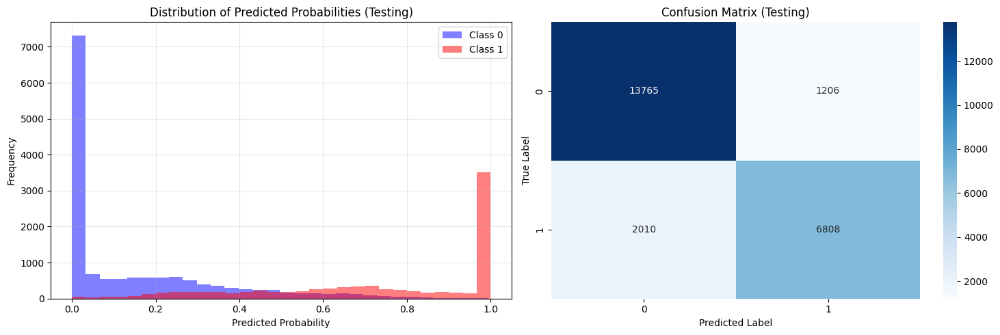

In [ ]:
# Visualize Testing Results
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Predicted Probabilities Distribution
axes[0].hist(TestingDataResults6[TestingDataResults6[TargetVariable] == 0]['Probability'],
             bins=30, alpha=0.5, label='Class 0', color='blue')
axes[0].hist(TestingDataResults6[TestingDataResults6[TargetVariable] == 1]['Probability'],
             bins=30, alpha=0.5, label='Class 1', color='red')
axes[0].set_xlabel('Predicted Probability')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Predicted Probabilities (Testing)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Confusion Matrix Heatmap
cm_test = metrics.confusion_matrix(y_test, TestingPrediction6)
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', ax=axes[1])
axes[1].set_xlabel('Predicted Label')
axes[1].set_ylabel('True Label')
axes[1].set_title('Confusion Matrix (Testing)')

plt.tight_layout()
plt.show()

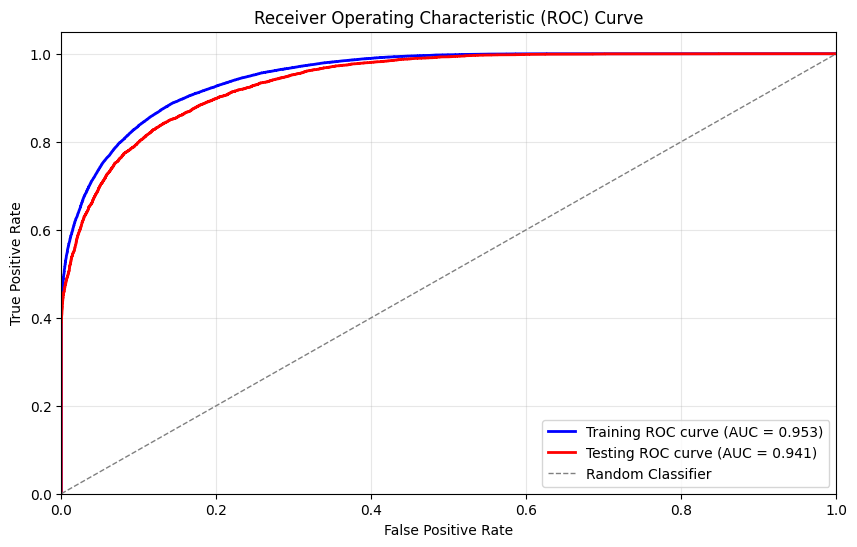

In [ ]:
# ROC Curve
from sklearn.metrics import roc_curve, auc

# Calculate ROC curve for Training data
fpr_train, tpr_train, _ = roc_curve(y_train, TrainingPredictionProba6)
roc_auc_train = auc(fpr_train, tpr_train)

# Calculate ROC curve for Testing data
fpr_test, tpr_test, _ = roc_curve(y_test, TestingPredictionProba6)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curves
plt.figure(figsize=(10, 6))
plt.plot(fpr_train, tpr_train, color='blue', lw=2,
         label=f'Training ROC curve (AUC = {roc_auc_train:.3f})')
plt.plot(fpr_test, tpr_test, color='red', lw=2,
         label=f'Testing ROC curve (AUC = {roc_auc_test:.3f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--', label='Random Classifier')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

Baseline Accuracy: 0.8648



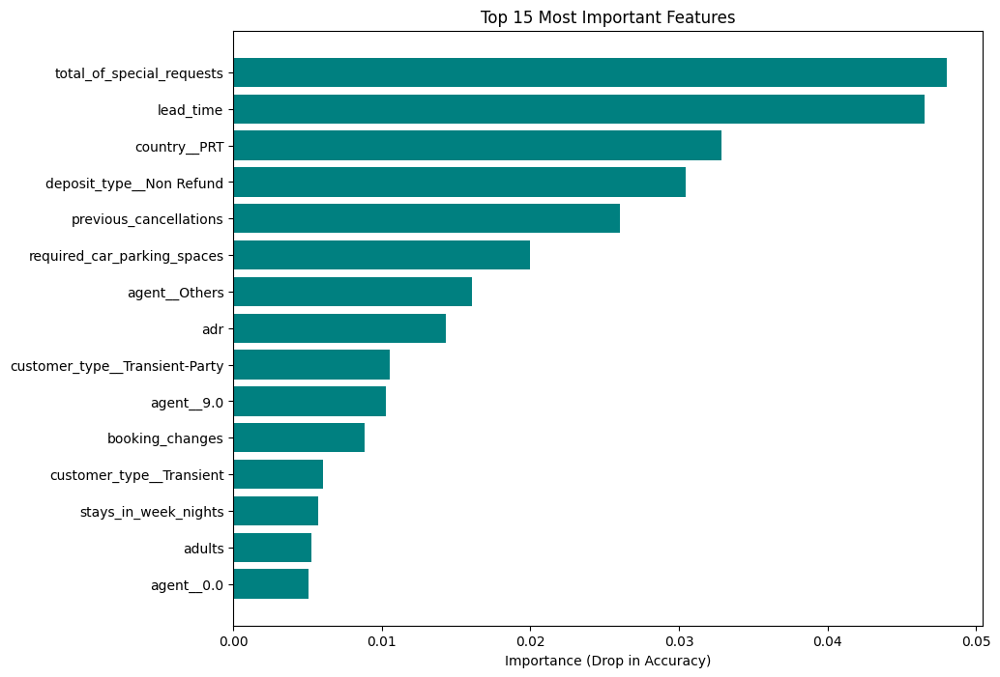

                           Feature  Importance
9        total_of_special_requests      0.0480
0                        lead_time      0.0465
56                    country__PRT      0.0329
76        deposit_type__Non Refund      0.0305
3           previous_cancellations      0.0260
8      required_car_parking_spaces      0.0200
88                   agent__Others      0.0161
7                              adr      0.0143
92  customer_type__Transient-Party      0.0106
82                      agent__9.0      0.0103


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# ฟังก์ชันคำนวณ Feature Importance
def get_permutation_importance(model, X, y, feature_names):
    # หาค่าความแม่นยำตั้งต้น (Baseline Accuracy)
    X_val = X.values if isinstance(X, pd.DataFrame) else X

    initial_preds = (model.predict(X_val, verbose=0) > 0.5).astype('int32')
    baseline_acc = accuracy_score(y, initial_preds)

    print(f"Baseline Accuracy: {baseline_acc:.4f}\n")

    importances = []

    # วนลูปทุกๆ Feature เพื่อสลับค่า (Shuffle)
    for i, col_name in enumerate(feature_names):
        # copy ข้อมูลมาเพื่อไม่ให้กระทบต้นฉบับ
        X_permuted = X_val.copy()

        # สลับข้อมูลในคอลัมน์ที่ i
        np.random.shuffle(X_permuted[:, i])

        # ทำนายใหม่ด้วยข้อมูลที่สลับแล้ว
        permuted_preds = (model.predict(X_permuted, verbose=0) > 0.5).astype('int32')
        permuted_acc = accuracy_score(y, permuted_preds)

        # คำนวณว่าความแม่นยำลดลงไปเท่าไหร่
        importance = baseline_acc - permuted_acc
        importances.append(importance)

    # สร้าง DataFrame สรุปผล
    df_imp = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values(by='Importance', ascending=False)

    return df_imp

# คำนวณ (ใช้ X_test เพื่อดูผลกับข้อมูลที่ไม่เคยเห็น)
df_importance = get_permutation_importance(modelNN, X_test_encode, y_test, X_test_encode.columns)

plt.figure(figsize=(10, 8))
plt.barh(df_importance['Feature'][:15][::-1], df_importance['Importance'][:15][::-1], color='teal')
plt.xlabel('Importance (Drop in Accuracy)')
plt.title('Top 15 Most Important Features')
plt.show()

print(df_importance.head(10))

### **12.4.3 Neural Network (NN) Model Summary**

**สรุปผลการเปรียบเทียบประสิทธิภาพโมเดล Neural Network**

1. ภาพรวมการทดลอง การทดลองนี้มีวัตถุประสงค์เพื่อสร้างและเปรียบเทียบประสิทธิภาพของโมเดล Deep Learning ประเภท Neural Network สำหรับทำนายการยกเลิกการจองโรงแรม โดยแบ่งการทดลองออกเป็น 2 กรณี ได้แก่
    - โมเดลที่กำหนดโครงสร้างเอง (Manual Architecture): กำหนดจำนวน Layer และ Neuron ตามประสบการณ์ (128-64-32 Nodes) พร้อมใส่ Dropout (0.3)
    - โมเดลที่ปรับจูนค่าพารามิเตอร์ (Hyperparameter Tuning): ใช้เทคนิค Hyperband ผ่าน Keras Tuner เพื่อค้นหาโครงสร้างที่เหมาะสมที่สุด (ได้ชั้นแรก 160 Nodes, Dropout 0.2, Learning Rate 0.001)

2. การวิเคราะห์ประสิทธิภาพและการเกิด Overfitting จากการเปรียบเทียบผลลัพธ์ระหว่าง Training Dataset และ Testing Dataset พบความแตกต่างดังนี้
    - กรณีที่ 1: โมเดลที่กำหนดโครงสร้างเอง (Manual)
      - ผลการทดสอบ: แสดงค่าความแม่นยำ (Accuracy) ในชุดข้อมูล Training ที่ 87.35% และในชุดข้อมูล Testing ที่ 86.42%
      - การวิเคราะห์: พบความต่างของคะแนน (Gap) เพียง ~0.9% ซึ่งถือว่าน้อยมาก บ่งชี้ว่าโมเดลมีความเสถียรดี (Good Fit) ไม่เกิดปัญหา Overfitting แต่ประสิทธิภาพอาจยังไม่ได้ถูกรีดออกมาจนถึงจุดสูงสุด

    - กรณีที่ 2: โมเดลที่ปรับจูนค่าพารามิเตอร์ (Tuned Model)
      - ผลการทดสอบ: แสดงค่าความแม่นยำในชุดข้อมูล Training ที่ 88.16% และชุดข้อมูล Testing ที่ 86.65%
      - การวิเคราะห์: โมเดลนี้ให้ค่าความแม่นยำที่สูงกว่าโมเดลแรกในทุกมิติ โดยยังคงรักษาช่องว่างระหว่าง Training และ Testing ไว้ที่ระดับต่ำ (~1.5%) แสดงให้เห็นถึงประสิทธิภาพที่สูงขึ้น (Optimization) โดยยังคงความสามารถในการอธิบายข้อมูลทั่วไปได้ดี (Generalization)

    **ตารางเปรียบเทียบประสิทธิภาพโมเดล (Performance Comparison)**
    | Metric        | Model 1: Manual | Model 2: Tuned | Change | Interpretation |
    |---------------|-----------------|----------------|---------|----------------|
    | Accuracy      | 86.42%          | 86.65%         | <font color="green">+0.23%</font>   | ความแม่นยำโดยรวมดีขึ้นเล็กน้อย |
    | Precision     | 0.8343          | 0.8354         | <font color="green">+0.0011</font>  | ความน่าเชื่อถือเมื่อทายว่า "ยกเลิก" สูงขึ้น |
    | Recall        | 0.7907          | 0.7967         | <font color="green">+0.0060</font>  | ดักจับลูกค้าที่จะยกเลิกได้ครอบคลุมมากขึ้น |
    | F1-Score      | 0.8119          | 0.8156         | <font color="green">+0.0037</font>  | ค่าเฉลี่ยความแม่นยำและความครบถ้วนดีขึ้น |
    | ROC AUC       | 0.9409          | 0.9415         | <font color="green">+0.0006</font>  | ประสิทธิภาพในการแยกแยะคลาสสูงมากทั้งคู่ |

    **ตารางวิเคราะห์ Overfitting (Training vs Testing)**
    | Model              | Accuracy (Training) | Accuracy (Testing) | Gap     | Status |
    |--------------------|---------------------|--------------------|---------|--------|
    | Manual Model       | 87.35%              | 86.42%             | 0.93%   | <font color="green">Good Fit</font> (เสถียรมาก) |
    | Tuned Model        | 88.16%              | 86.65%             | 1.51%   | <font color="green">Good Fit</font> (เสถียร, เรียนรู้ได้ลึกกว่า) |

3. การวิเคราะห์ปัจจัยที่มีอิทธิพลต่อโมเดล (Feature Importance) จากการวิเคราะห์ด้วยเทคนิค Permutation Importance พบว่าตัวแปรที่มีนัยสำคัญต่อการตัดสินใจของโมเดลสูงสุด 5 อันดับแรก มีความสอดคล้องกับพฤติกรรมลูกค้าอย่างชัดเจน ได้แก่:
    - total_of_special_requests: จำนวนคำขอพิเศษ (บ่งชี้ความตั้งใจเข้าพักจริงสูง หากมีคำขอมาก)
    - lead_time: ระยะเวลาจองล่วงหน้า (จองนานมีความเสี่ยงเปลี่ยนแปลงแผนสูง)
    - deposit_type_Non Refund: การชำระเงินแบบไม่คืนเงิน (เป็นปัจจัยล็อกความเสี่ยงทางการเงิน)
    - country_PRT: ลูกค้าจากประเทศโปรตุเกส (อาจมีพฤติกรรมการจองเฉพาะถิ่น)
    - previous_cancellations: ประวัติการยกเลิกในอดีต

4. จากการวิเคราะห์เชิงลึก ขอเสนอแนะให้เลือกใช้ โมเดลที่ผ่านการปรับจูนค่าพารามิเตอร์ (Tuned Model) เป็นโมเดลสุดท้าย เนื่องจาก:
    - ประสิทธิภาพสูงสุด: ให้ค่าคะแนนดีกว่าในทุกมิติ โดยเฉพาะค่า Recall ที่สูงกว่า ซึ่งสำคัญมากในการดักจับลูกค้าที่จะยกเลิกจอง
    - ความเสถียร: ทั้งสองโมเดลมีความเสถียรใกล้เคียงกัน (ไม่ Overfit) แต่ Tuned Model ผ่านกระบวนการค้นหาทางสถิติมาแล้ว จึงมั่นใจได้ว่าเป็นโครงสร้างที่ดีที่สุดสำหรับชุดข้อมูลนี้
    - ความแม่นยำในการแยกแยะ: ค่า ROC AUC ที่ระดับ 0.941 ยืนยันว่าโมเดลมีความน่าเชื่อถือสูงมากในการนำไปใช้งานจริงเพื่อคัดกรองบุ๊กกิ้งที่มีความเสี่ยง

**Error Analysis**

Model Evaluation: Error Analysis
------------------------------
CONFUSION MATRIX BREAKDOWN:
   • True Negatives (TN):  13,765 - Predicted 'Not Canceled' & Actual 'Stayed' (Correct)
   • False Positives (FP): 1,206 - Predicted 'Canceled' & Actual 'Stayed' (Lost Revenue Opportunity)
   • False Negatives (FN): 2,010 - Predicted 'Not Canceled' & Actual 'Canceled' (Inventory Spoilage) ⚠️
   • True Positives (TP):  6,808 - Predicted 'Canceled' & Actual 'Canceled' (Correctly Identified)

PERFORMANCE METRICS:
   • Accuracy:             86.5% - Overall Accuracy
   • Recall (Sensitivity): 77.2% - Ability to capture 'Cancellations' (Higher is better)
   • Specificity:          91.9% - Ability to identify 'Safe' bookings
   • Precision:            85.0% - Reliability of 'Cancellation' prediction

ERROR DISTRIBUTION:
   • Total Errors: 3,216 (13.5%)
   • False Positives: 1,206 (5.1%) -> Type I Error
     → Avg Confidence: 0.648
   • False Negatives: 2,010 (8.4%) -> Type II Error ⚠️ HIGH RISK
     →

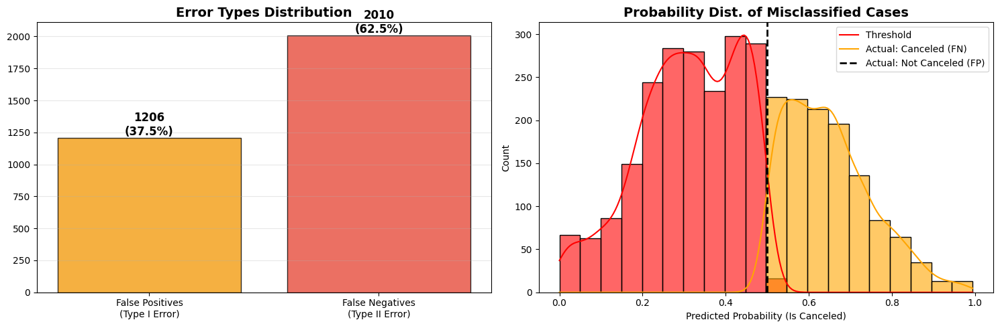

In [ ]:
# --- Confusion Matrix Analysis ---
tn, fp, fn, tp = metrics.confusion_matrix(y_test, TestingPrediction6).ravel()

print('Model Evaluation: Error Analysis')
print("-" * 30)
print(f"CONFUSION MATRIX BREAKDOWN:")
print(f"   • True Negatives (TN):  {tn:,} - Predicted 'Not Canceled' & Actual 'Stayed' (Correct)")
print(f"   • False Positives (FP): {fp:,} - Predicted 'Canceled' & Actual 'Stayed' (Lost Revenue Opportunity)")
print(f"   • False Negatives (FN): {fn:,} - Predicted 'Not Canceled' & Actual 'Canceled' (Inventory Spoilage) ⚠️")
print(f"   • True Positives (TP):  {tp:,} - Predicted 'Canceled' & Actual 'Canceled' (Correctly Identified)")

# --- Business Implications ---
accuracy = (tp + tn) / (tp + tn + fp + fn)
recall = tp / (tp + fn)
specificity = tn / (tn + fp)
precision = tp / (tp + fp) if (tp + fp) > 0 else 0

print(f"\nPERFORMANCE METRICS:")
print(f"   • Accuracy:             {accuracy:.1%} - Overall Accuracy")
print(f"   • Recall (Sensitivity): {recall:.1%} - Ability to capture 'Cancellations' (Higher is better)")
print(f"   • Specificity:          {specificity:.1%} - Ability to identify 'Safe' bookings")
print(f"   • Precision:            {precision:.1%} - Reliability of 'Cancellation' prediction")

# --- Analyze Misclassified Cases ---
test_misclassified = TestingDataResults6[
    TestingDataResults6[TargetVariable] != TestingDataResults6['Predicted' + TargetVariable]
]

false_positives = TestingDataResults6[
    (TestingDataResults6[TargetVariable] == 0) &
    (TestingDataResults6['Predicted' + TargetVariable] == 1)
]

false_negatives = TestingDataResults6[
    (TestingDataResults6[TargetVariable] == 1) &
    (TestingDataResults6['Predicted' + TargetVariable] == 0)
]

print(f"\nERROR DISTRIBUTION:")
print(f"   • Total Errors: {len(test_misclassified):,} ({len(test_misclassified)/len(TestingDataResults6)*100:.1f}%)")
print(f"   • False Positives: {len(false_positives):,} ({len(false_positives)/len(TestingDataResults6)*100:.1f}%) -> Type I Error")
print(f"     → Avg Confidence: {false_positives['Probability'].mean():.3f}")
print(f"   • False Negatives: {len(false_negatives):,} ({len(false_negatives)/len(TestingDataResults6)*100:.1f}%) -> Type II Error ⚠️ HIGH RISK")
print(f"     → Avg Confidence: {false_negatives['Probability'].mean():.3f}")

# --- Probability Distribution Analysis ---
print(f"\nMISCLASSIFICATION PROBABILITY DISTRIBUTION (Confidence in Errors):")
prob_ranges = [
    (0.0, 0.3, "Very Low"),
    (0.3, 0.45, "Low"),
    (0.45, 0.55, "Uncertain (Borderline)"),
    (0.55, 0.7, "High"),
    (0.7, 1.0, "Very High (High Confidence Error)")
]

for low, high, label in prob_ranges:
    count_fn = len(false_negatives[
        (false_negatives['Probability'] >= low) & (false_negatives['Probability'] < high)
    ])
    count_fp = len(false_positives[
        (false_positives['Probability'] >= low) & (false_positives['Probability'] < high)
    ])

    if count_fn > 0: print(f"   • FN {label} ({low}-{high}): {count_fn} cases")
    if count_fp > 0: print(f"   • FP {label} ({low}-{high}): {count_fp} cases")

# --- Model Limitations ---
print(f"\nIDENTIFIED MODEL LIMITATIONS (NEURAL NETWORK):")
print("""
1. CLASS IMBALANCE:
   - Ratio of Stays vs. Cancellations may be unbalanced.
   - If model favors majority class (Stays), Accuracy is high but Recall drops.

2. DECISION BOUNDARY:
   - Cases with probability 0.45 - 0.55 indicate model uncertainty.
   - Threshold adjustment may be needed (e.g., lowering threshold > 0.4 to capture more risks).

3. FEATURE GAPS:
   - Potential missing features: Weather, Competitor Pricing, or Recent Reviews.
   - High Lead Time creates behavioral drift unknown to the model.

4. DATA DRIFT:
   - Training data is historical; customer behavior may shift over time.
""")

# --- Visualization ---
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Error Types
error_types = ['False Positives\n(Type I Error)', 'False Negatives\n(Type II Error)']
error_counts = [len(false_positives), len(false_negatives)]
colors = ['#f39c12', '#e74c3c']
bars = axes[0].bar(error_types, error_counts, color=colors, edgecolor='black', alpha=0.8)
axes[0].set_title('Error Types Distribution', fontsize=14, fontweight='bold')
axes[0].grid(True, alpha=0.3, axis='y')

for bar, count in zip(bars, error_counts):
    axes[0].text(bar.get_x() + bar.get_width()/2., bar.get_height(),
                f'{count}\n({count/len(test_misclassified)*100:.1f}%)',
                ha='center', va='bottom', fontsize=12, fontweight='bold')

# Plot 2: Probability Distribution
sns.histplot(data=test_misclassified, x='Probability', hue=TargetVariable,
             bins=20, alpha=0.6, ax=axes[1], kde=True, palette={0: 'orange', 1: 'red'})
axes[1].axvline(x=0.5, color='black', linestyle='--', linewidth=2, label='Threshold 0.5')
axes[1].set_title('Probability Dist. of Misclassified Cases', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Predicted Probability (Is Canceled)')
axes[1].legend(['Threshold', 'Actual: Canceled (FN)', 'Actual: Not Canceled (FP)'])

plt.tight_layout()
plt.show()

**Error Analysis Summary**

โมเดล Neural Network จัดอยู่ในกลุ่ม "High Performance & Balanced" ด้วยความแม่นยำรวมที่สูงถึง 86.5% (เป็นรองเพียง Random Forest เล็กน้อยที่ 87.2%) พฤติกรรมของโมเดลนี้มีความ "สมดุล" ที่ดีกว่า Random Forest ในแง่ของการดักจับการยกเลิก (Recall 77.2% สูงกว่า RF) โดยยังคงความแม่นยำในการระบุลูกค้าชั้นดีไว้ได้สูง (Specificity 91.9%) อย่างไรก็ตาม โมเดลยังคงมีจุดอ่อนเรื่อง False Negatives ที่มีความมั่นใจผิด ๆ (Confident Errors) สูง ซึ่งอาจเกิดจากการขาดตัวแปรภายนอกที่สำคัญ

1. การเจาะลึกข้อผิดพลาด (Error Deep Dive)

    จากการวิเคราะห์เคสที่ทายผิดจำนวน 3,216 เคส พบลักษณะข้อผิดพลาดดังนี้:

    - ปัญหาหลัก: "มั่นใจแต่ผิดเป้า" (False Negatives)
      - จำนวน: 2,010 เคส (8.4% ของข้อมูลทั้งหมด)
      - สถานการณ์: โมเดลทายว่า "ไม่ยกเลิก" แต่ลูกค้า "ดันยกเลิก"
      - ความมั่นใจ: โมเดลมีความมั่นใจสูงมากว่าลูกค้ากลุ่มนี้จะมาพัก (Probability ต่ำกว่า 0.45 ถึง 1,718 เคส) แสดงว่ามี Pattern บางอย่างที่หลอกโมเดลได้อย่างสนิทใจ
      - ผลกระทบทางธุรกิจ: เกิด Inventory Spoilage (ห้องว่างเก้อ) เสียโอกาสการขาย

    - ปัญหารอง: "ความผิดพลาดส่วนน้อย" (False Positives)
      - จำนวน: 1,206 เคส (5.1% ของข้อมูลทั้งหมด)
      - สถานการณ์: โมเดลทายว่า "จะยกเลิก" แต่ลูกค้า "มาพักจริง"
      - ผลกระทบทางธุรกิจ: เสียโอกาสรายได้ (Lost Revenue Opportunity) หากรีบนำห้องไปปล่อยขายราคาถูก

2. การวิเคราะห์สาเหตุ (Root Cause Analysis)
    สาเหตุของข้อผิดพลาดใน Neural Network เกิดจากปัจจัยเชิงโครงสร้างและข้อมูล:
    - ช่องว่างของข้อมูล (Feature Gaps): การที่โมเดล "มั่นใจผิด ๆ" (High Confidence Errors) บ่งชี้ว่าตัวแปรที่มีอยู่ปัจจุบันอาจส่งสัญญาณหลอกในบางสถานการณ์ ขาดตัวแปรภายนอก (External Factors) เช่น สภาพอากาศ หรือ Event พิเศษ มาช่วยยืนยัน
    - ความไม่แน่นอนที่เส้นแบ่ง (Decision Boundary Uncertainty): มีเคสประมาณ 500+ เคส ที่ค่าความน่าจะเป็นอยู่กึ่งกลาง (0.45 - 0.55) แสดงว่าโมเดลยัง "ลังเล" ในกลุ่มลูกค้าที่มีพฤติกรรมก้ำกึ่ง แยกแยะได้ยาก
    - ความไม่สมดุลของคลาส (Class Imbalance): ถึงแม้ Neural Network จะเก่งเรื่อง Pattern ที่ซับซ้อน แต่ก็ยังมี Bias เล็กน้อยไปทางกลุ่มลูกค้าที่มาพัก (Majority Class) ทำให้ค่า Recall ยังไม่สูงเท่าที่ควร

# **13. Results Analysis**

## **13.1 How accurate is each model? and which model gives the most accuracy? Why?**

**บทสรุปผลการเปรียบเทียบประสิทธิภาพโมเดล (Model Performance Comparison)**

1. ภาพรวมการทดสอบ (Overview) การศึกษาครั้งนี้ได้ทำการทดสอบและเปรียบเทียบประสิทธิภาพของอัลกอริทึม Machine Learning จำนวน 4 รูปแบบ ได้แก่ Logistic Regression, Random Forest, K-Nearest Neighbors (K-NN) และ Neural Network เพื่อค้นหาโมเดลที่เหมาะสมที่สุดในการทำนายผล (Classification Task) โดยใน Model Random Forest, K-NN และ Neural Network ที่มีการทำ Hyperparameter Tuning เราได้เลือกโมเดลที่มีประสิทธิภาพมากที่สุดมาเปรียบเทียบกัน โดยใช้เกณฑ์วัดผลจากข้อมูลชุดทดสอบ (Testing Data) ที่โมเดลไม่เคยเรียนรู้มาก่อน

2. ตารางเปรียบเทียบผลลัพธ์ (Performance Matrix) ตารางด้านล่างแสดงค่าตัวชี้วัดประสิทธิภาพของทั้ง 4 โมเดล เรียงลำดับตามความแม่นยำ (Accuracy) จากมากไปน้อย
| Rank | Model Name | Accuracy | Precision | Recall | F1-Score | ROC AUC |
| :---: | :--- | :---: | :---: | :---: | :---: | :---: |
| 🥇 | **Random Forest** | **87.17%** | **86.94%** | 76.93% | **81.63%** | **0.9459** |
| 🥈 | Neural Network | 86.30% | 84.59% | 77.09% | 80.67% | 0.9401 |
| 🥉 | K-NN | 84.66% | 81.54% | 75.77% | 78.54% | 0.9207 |
| 4 | Logistic Regression | 81.45% | 72.80% | **79.75%** | 76.11% | 0.9032 |
> **Note:** **Random Forest** ให้ผลลัพธ์ที่ดีที่สุดในเกือบทุกมิติ โดยเฉพาะค่า **Precision** ที่สูงกว่าโมเดลอื่นๆ อย่างมีนัยสำคัญ ซึ่งช่วยลด False Positive ในการทำนายได้ดีที่สุด

3. การวิเคราะห์ผลลัพธ์เชิงลึก (In-depth Analysis): จากการทดสอบพบว่า Random Forest เป็นโมเดลที่มีประสิทธิภาพสูงสุด (Accuracy 87.17%) ในขณะที่ Logistic Regression มีประสิทธิภาพต่ำที่สุด (Accuracy 81.45%) โดยสามารถวิเคราะห์สาเหตุตามลักษณะของข้อมูลและอัลกอริทึมได้ดังนี้

    - Random Forest (The Best Fit):
      - ความสามารถในการจัดการข้อมูล: เนื่องจากชุดข้อมูลพฤติกรรมลูกค้ามีความซับซ้อนและมีความสัมพันธ์แบบไม่เป็นเส้นตรง (Non-linear Relationship) โมเดล Random Forest ซึ่งใช้หลักการ Ensemble ของ Decision Trees จำนวนมาก จึงสามารถจับรูปแบบเงื่อนไขที่ซับซ้อนเหล่านี้ได้ดีกว่าโมเดลอื่น
      - ความแม่นยำ (Precision): จุดเด่นสำคัญคือค่า Precision ที่สูงถึง 86.94% ซึ่งสูงที่สุดในทุกโมเดล แสดงให้เห็นว่าโมเดลมีความสามารถในการคัดกรอง ลดความผิดพลาดในการเกิด False Positive ได้ดีที่สุด

    - Neural Network (The Runner-up):
      - ทำคะแนนได้ใกล้เคียงกับ Random Forest มาก (ห่างกันเพียง ~0.8%) เนื่องจากโครงสร้างเครือข่ายประสาทเทียมมีความสามารถในการเรียนรู้ Pattern ที่ซับซ้อนได้ดีเช่นกัน แต่อาจมีความไวต่อ Noise ในข้อมูลมากกว่า Random Forest เล็กน้อยในบริบทของข้อมูลแบบตาราง (Tabular Data) นี้

    - K-NN (The Average):
      - ประสิทธิภาพลดลงเนื่องจากข้อจำกัดเรื่อง "Curse of Dimensionality" เมื่อข้อมูลมีจำนวนฟีเจอร์มาก (เช่นจากการทำ One-hot Encoding) การคำนวณระยะทางระหว่างจุดข้อมูลจะเริ่มมีความแม่นยำลดลง และ K-NN ยังอ่อนไหวต่อข้อมูลที่มีความผิดปกติ (Outliers) ค่อนข้างมาก

    - Logistic Regression (The Baseline):
      - ได้ผลลัพธ์ต่ำที่สุดเนื่องจากข้อจำกัดของสมการเชิงเส้น (Linear Assumption) โมเดลพยายามแบ่งข้อมูลด้วยเส้นตรงเพียงเส้นเดียว ซึ่งไม่เพียงพอที่จะอธิบายความซับซ้อนของพฤติกรรมการจองและการยกเลิกของลูกค้าได้ ทำให้เกิดภาวะ Underfitting (Bias สูง) เมื่อเทียบกับโมเดลอื่นๆ

4. บทสรุปและข้อเสนอแนะ (Conclusion & Recommendation) จากผลการทดลอง สรุปได้ว่า Random Forest คือโมเดลที่เหมาะสมที่สุดสำหรับการนำไปใช้งานจริง เนื่องจากให้ค่าความแม่นยำรวม (Accuracy) สูงที่สุด และมีค่าความแม่นยำในการระบุกลุ่มเป้าหมาย (Precision) ที่โดดเด่น ซึ่งจะช่วยลดความผิดพลาดในการดำเนินงานทางธุรกิจได้ดีที่สุด

## **13.2 Based on the accuracy you get from the model, can your model actually be used in real situation?**

โมเดลเหมาะกับการนำไปใช้ในสถานการณ์จริง

เหตุผลสนับสนุน:
1. High Reliability & Stability (ความน่าเชื่อถือสูง)
    - โมเดล Random Forest ที่ผ่านการจูนแล้ว (Tuned Random Forest) มีค่าความแม่นยำ (Accuracy) ในการทำนายประมาณ 87% ซึ่งถือว่าอยู่ในเกณฑ์ที่ดีมากสำหรับข้อมูลทางธุรกิจ
    - ที่สำคัญกว่าตัวเลขความแม่นยำคือ "ความเสถียร (Stability)" โดยช่องว่าง (Gap) ระหว่าง Training และ Testing Score มีน้อยมาก (เพียง ~1.8%) แสดงให้เห็นว่าโมเดลไม่ได้จำข้อสอบ (Not Overfitting) และจะยังคงทำงานได้ดีเมื่อนำไปใช้กับลูกค้าหน้าใหม่ในอนาคต

2. High Precision minimizes Business Risk (ลดความเสี่ยงทางธุรกิจ)
    - ค่า Precision ที่สูงถึง ~87% เป็นจุดแข็งที่สุดของโมเดลนี้
    - ในสถานการณ์จริง หากโมเดลทำนายว่า "ลูกค้าคนนี้จะยกเลิก" เรามีความมั่นใจได้ถึง 87% ว่าเขาจะยกเลิกจริง ๆ ทำให้โรงแรมสามารถนำห้องนั้นไปขายต่อ (Resell) หรือเปิด Overbooking ได้อย่างมั่นใจ โดยมีความเสี่ยงต่ำที่จะไปยกเลิกห้องของลูกค้าที่ตั้งใจมาพักจริง (Low False Positive Rate) ซึ่งช่วยรักษาความพึงพอใจของลูกค้าได้

3. Significant Improvement over Baseline (ดีกว่าการเดา)
    - หากไม่มีโมเดล โรงแรมอาจต้องเดาแบบสุ่ม (50/50) หรือใช้ความรู้สึก (Gut feeling) ซึ่งมีความเสี่ยงสูง
    - การมีโมเดลที่แม่นยำ 87% ช่วยให้ผู้บริหารสามารถวางแผนจัดการรายได้ (Revenue Management) ได้อย่างมีประสิทธิภาพมากขึ้นอย่างมหาศาล

ข้อแนะนำในการนำไปใช้จริง:
    
แม้โมเดลจะแม่นยำ 87% แต่ยังมีโอกาสผิดพลาด (Error) ประมาณ 13% โดยเฉพาะค่า Recall (~77%) ที่บ่งบอกว่าโมเดลอาจจะ "ตามจับ" คนที่จะยกเลิกได้ไม่หมดทุกคน (False Negative)

ดังนั้น ในการใช้งานจริงควรใช้ควบคู่กับมาตรการทางธุรกิจ ดังนี้
  - Conservative Overbooking: สามารถเปิดจองเกินจำนวนห้องจริงได้ (Overbooking) โดยอิงตามจำนวนที่โมเดลทำนายว่าจะยกเลิก แต่ควรเผื่อ Buffer ไว้เล็กน้อยสำหรับส่วนที่โมเดลทายผิด
  - Targeted Deposit Policies: ใช้โมเดลคัดกรองเฉพาะกลุ่มที่มีความเสี่ยงสูง (High Risk) เพื่อขอเรียกเก็บเงินมัดจำล่วงหน้า หรือเสนอโปรโมชั่น Non-refundable แทนที่จะบังคับใช้กับลูกค้าทุกคน